In [1]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [210]:
import numpy as np
import scipy as sp
import h5py
from scipy.interpolate import interp1d
from scipy.linalg import sqrtm, solve_sylvester, solve_lyapunov
from scipy.integrate import quad
from scipy.io import savemat, loadmat
from scipy.sparse.linalg import svds
import matplotlib.pyplot as plt
import sys
import time
import pseudo
import os
import copy
import glob
import miscUtil
import ops
import warnings
%matplotlib inline
#%matplotlib notebook

os.environ['DATA'] = os.environ['DATA186']
physDataDir = os.environ['DATA'] + 'phys/'
specDataDir = os.environ['DATA'] + 'spec/'
covDataDir = os.environ['DATA'] + 'cov/'
libDir = os.environ['LINLIB']
figureFolder = 'MTSMFigures/'

# Resolvent analysis for modified mean profiles

I'll start with some simple verification to reproduce the results of 
Moarref et. al. JFM (2013); Model-based scaling of the streamwise energy density ...

I'll call this paper, MSTM (Moarref, Sharma, Tropp, McKeon).

## Fig. 3 of MSTM
### Principal velocity response mode
At $Re_\tau = 10,000$, for $c=10$, $\lambda^+_x = 700$, and $\lambda^+_z = 100$. 

In [302]:
N = 401; Re = 10000.; c = 10.;
LxPlus = 700.; LzPlus = 100.
Nx = 101; Nz = 16

Lx = LxPlus/Re; Lz = LzPlus/Re
a = 2.*np.pi/Lx; b = 2.*np.pi/Lz; omega = a*c;
I2 = np.identity(2*N,dtype=np.complex); I3 = np.identity(3*N, dtype=np.complex)

statInst = ops.statComp(a=a, b=b, N=N, Re=Re, covMat = I3)
weightDict = pseudo.weightMats(N)
W3s = weightDict['W3Sqrt']
W3si = weightDict['W3SqrtInv']

#A, C, B = statInst.makeSystem()
A = statInst.dynamicsMat(a=a,b=b)
C = statInst.velVor2primitivesMat(a=a,b=b)
B = statInst.primitives2velVorMat(a=a,b=b)

R = (1.j*omega*I2 + A)
R = -np.linalg.solve(R, I2)
H = C @ R @ B
H = W3s @ H @ W3si

velResp,ampl,forcing = np.linalg.svd(H)

# The velResp modes are (Clenshaw-Curtis) weighted velocities 
# Convert it to unweigthed
primaryMode = W3si @ velResp[:,0]
primaryMode = primaryMode.reshape((3,1,1,N))

# Calcualte the field at t=0 in physical space
xArr = np.linspace(0., Lx, Nx).reshape((Nx,1,1))
zArr = np.linspace(-Lz/2., Lz/2., Nz).reshape((1,Nz,1))
y = pseudo.chebdif(N,1)[0]
y = y.reshape((1,1,N))

#uPhys = np.zeros((Nx,Nz,N))
#vPhys = np.zeros((Nx,Nz,N))
#wPhys = np.zeros((Nx,Nz,N))

#uPhys = 4.* np.cos(b*zArr) * np.real( primaryMode[0] * np.exp(1.j*a*xArr)   )
#vPhys = 4.* np.cos(b*zArr) * np.real( primaryMode[1] * np.exp(1.j*a*xArr)   )
#wPhys = -4.*np.sin(b*zArr) * np.imag( primaryMode[2] * np.exp(1.j*a*xArr)   )

uPhys = np.real( primaryMode[0] * np.exp(1.j*(a*xArr+b*zArr))   )
vPhys = np.real( primaryMode[1] * np.exp(1.j*(a*xArr+b*zArr))   )
wPhys = np.real( primaryMode[2] * np.exp(1.j*(a*xArr+b*zArr))   )



Using parameters Re=1e+04, alfa=25.4, kapa=0.426, N=401
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 89.7597901025655 628.3185307179587 10000.0


/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


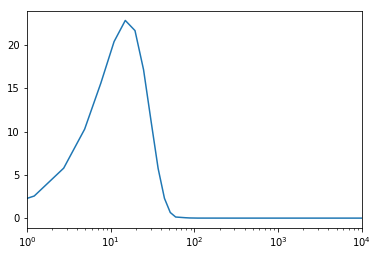

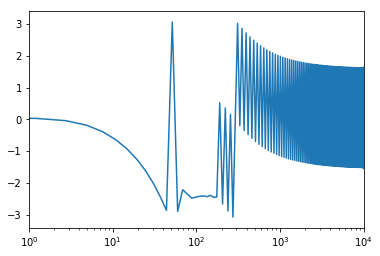

In [303]:
#plt.plot(Re*(1.-y[0,0]), np.abs(velResp[:N,0]))
#plt.plot(Re*(1.-y[0,0]), np.abs(velResp[N:2*N,0]))
#plt.plot(Re*(1.-y[0,0]), np.abs(velResp[2*N:3*N,0]))
plt.plot(Re*(1.-y[0,0]), np.abs(primaryMode[0,0,0]))
plt.xlim([1.,Re])
plt.xscale("log")
plt.show()

#plt.plot(Re*(1.-y[0,0]), np.angle(velResp[:N,0]))
#plt.plot(Re*(1.-y[0,0]), np.angle(velResp[N:2*N,0]))
#plt.plot(Re*(1.-y[0,0]), np.angle(velResp[2*N:3*N,0]))
plt.plot(Re*(1.-y[0,0]), np.angle(primaryMode[0,0,0]))
plt.xlim([1.,Re])
plt.xscale("log")
plt.show()


### So, the weight matrices are pretty messed up
Are they though?

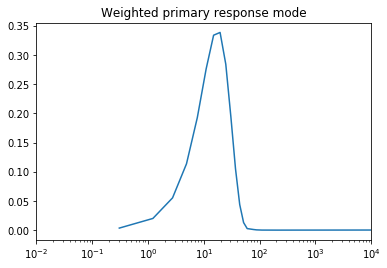

[  0.63671283   2.55428801   5.77617352  10.27538011  15.60043339]


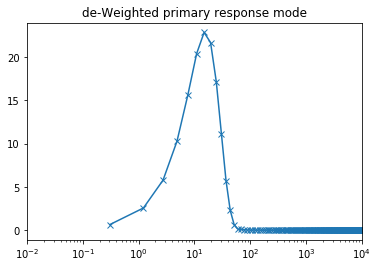

In [304]:
W3si = weightDict['W3SqrtInv']

plt.plot(Re*(1.- statInst.y), np.abs(velResp[:N,0]))
plt.xlim([0.01,Re])
plt.xscale('log')
plt.title("Weighted primary response mode")
plt.show()


plt.figure()
someMode = 1./np.sqrt(statInst.w) * velResp[:N,0]
someMode1 = (W3si @ velResp[:,0])[:N]
someMode = primaryMode[0,0,0]
print(np.abs(someMode[:5]))
plt.plot(Re*(1.- statInst.y), np.abs(someMode),'x-')
plt.xlim([0.01,Re])
plt.xscale('log')
plt.title("de-Weighted primary response mode")
plt.show()

## Fig. 3b of MTSM

(1-0j)


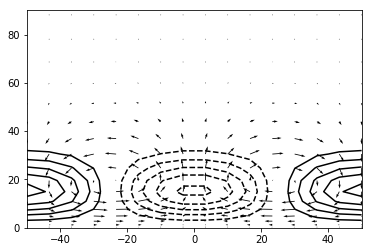

In [308]:
maxInd = np.argmax(np.abs(primaryMode[0,0,0,:N//2].flatten()))
phaseMaxInd = np.angle(primaryMode[0,0,0,maxInd])
primaryMode[:,0,0] = np.exp(-1.j*phaseMaxInd) * primaryMode[:,0,0]
print(np.exp(-1.j*phaseMaxInd))

uPhys = np.cos(b*zArr) * np.real( primaryMode[0] * np.exp(1.j*(a*xArr))   )
vPhys = np.cos(b*zArr) * np.real( primaryMode[1] * np.exp(1.j*(a*xArr))   )
wPhys =-np.sin(b*zArr) * np.imag( primaryMode[2] * np.exp(1.j*(a*xArr))   )

ny = statInst.N
Z,Y = np.meshgrid(Re*zArr.flatten(), Re*(1.-statInst.y))
#zArr1 
wPlane = wPhys[50,:,:ny]; vPlane = vPhys[50,:,:ny]
uPlane = uPhys[50,:,:ny]

levels = np.arange(-15,16,3); levels = np.delete(levels,5)
plt.contour(Z, Y, uPlane.T/np.sqrt(2),levels=levels, colors='k')
# Why the sqrt(2)? Because I define the energy norm with a 1/2 factor.
# In W3Sqrt, this shows up as a 1/sqrt(2) factor. 
# Doesn't matter. It's linear and can be scaled.
plt.ylim([0.,90.])
plt.yticks(np.arange(0., 81., 20.))
#plt.quiver(Z[::2,::2], Y[::2,::2], wPlane.T[::2,::2], -vPlane.T[::2,::2], units='y',scale=0.5)
plt.quiver(Z, Y, wPlane.T, -vPlane.T, units='y',scale=0.5)
# -v because I'm plotting 1-y 
plt.show()



In [312]:
if False:
    from mpl_toolkits.mplot3d import Axes3D
    uMax = np.max(uPhys)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    X3D = xArr + np.zeros((Nx,Nz,N))
    Y3D = y + np.zeros((Nx,Nz,N))
    Z3D = zArr + np.zeros((Nx,Nz,N))

    # Need mayavi to use contour3d()
    # It's too much of a pain to install mayavi for python3
    # I'll ignore these plots for now.


## Fig. 4 of MTSM

Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 17.978885957543874 125.85220170280711 2003.0


/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


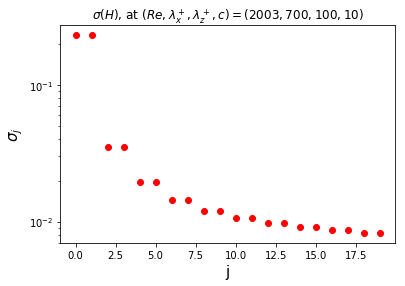

In [316]:
Re = 2003.; alfa = 25.4; kapa = 0.426; N = 251

# Fig 4.a in paper is for lx+ = 700, lz+ = 100, c = 10
# a = 2*pi/lx = 2*pi/(lx+ /ReTau) = ReTau * 2*pi/lx+
a = 2.*np.pi*Re/700.
b = 2.*np.pi*Re/100.
c = 10.; omega = a*c
I2 = np.identity(2*N, dtype=np.complex)
I3 = np.identity(3*N, dtype=np.complex)

statInst = ops.statComp(a=a, b=b, N=N, Re=Re, covMat = I3)
weightDict = pseudo.weightMats(N)
W3s = weightDict['W3Sqrt']
W3si = weightDict['W3SqrtInv']

if False:
    A, C, B = statInst.makeSystem()
    I = np.identity(A.shape[0])
    R = (1.j*omega*I2 + A)
    R = -np.linalg.solve(R2, I)
    H = C @ R @ B
else:
    A = statInst.dynamicsMat(a=a,b=b)
    C = statInst.velVor2primitivesMat(a=a,b=b)
    B = statInst.primitives2velVorMat(a=a,b=b)

    R = (1.j*omega*I2 + A)
    R = -np.linalg.solve(R, I2)
    H = C @ R @ B
    H = W3s @ H @ W3si
    
U,S,V = np.linalg.svd(H)
plt.plot(np.arange(20),S[:20],'ro')

plt.yscale("log")
plt.xlabel("j",fontsize=15); plt.ylabel("$\\sigma_j$",fontsize=15)
plt.title("$\\sigma(H)$, at $(Re,\\lambda^+_x,\\lambda^+_z,c)=(2003,700,100,10)$")
plt.savefig(figureFolder+'svalsRe2003lx700lz100.pdf',format='pdf')
plt.show()

In [325]:
N = 251
meanDict = ops.turbMeanChannel(N=251,Re=2003.)
print(meanDict['U'][:27], 2003.*(1.-statInst.y[:27]))
print(meanDict['U'][50:60],(1.-statInst.y[50:60]))

Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
[  0.15564211   0.62246655   1.39990993   2.48345134   3.84483318
   5.38344828   6.9169732    8.2903547    9.45036078  10.41126526
  11.20842889  11.87694467  12.44565707  12.93681945  13.3672497
  13.74962002  14.09352432  14.40628465  14.69354085  14.95967748
  15.20813363  15.44162926  15.66233223  15.87198308  16.07198919
  16.26349667  16.44744585] [   0.15564816    0.62256845    1.40068831    2.4898868     3.88999464
    5.60079425    7.62201972    9.95335694   12.59444358   15.54486918
   18.80417519   22.37185507   26.24735435   30.43007072   34.91935411
   39.71450684   44.81478365   50.2193919    55.92749162   61.93819568
   68.25056994   74.86363336   81.77635816   88.98767001   96.49644816
  104.30152563  112.40168939]
[ 19.63624179  19.73867336  19.83955579  19.93894739  20.03690267
  20.13347252  20.22870446  20.32264277  20.41532872  20.50680065] [ 0.19540222  0.20286749  0.21045665  0.21816852  0.22600189  0.233955

In [335]:
ypTarget = 15.
yTarget0 = 15./2003.
yTarget = 1. - yTarget0
print(yTarget, pseudo.chebint(meanDict['U'], yTarget))

0.9925112331502746 [ 10.25413828]


In [336]:
N=251; Re = 2003.
lxpArr = 10**np.linspace(1.,5.,61)
lzpArr = 10**np.linspace(1.,5.,30)
svals2norm_state = np.zeros((lxpArr.size, lzpArr.size))

for ind0 in range(lxpArr.size):
    lxp = lxpArr[ind0]; lx = lxp/2003.; a = 2.*np.pi/lx
    for ind1 in range(lzpArr.size):
        lzp = lzpArr[ind1]; lz = lzp/2003.; b = 2.*np.pi/lz
        k2 = a**2 + b**2
        statInst = ops.statComp(a=a, b=b, N=N, Re=Re, covMat = np.identity(3*N))
        c = 10.25; omega = a*c   # U(y^+=15)
        
        A, C, B = statInst.makeSystem()
        I = np.identity(A.shape[0])
        R = (1.j*omega*I + A)
        R = -np.linalg.solve(R, I)
        H = C @ R @ B
        if False:
            A, C, B = statInst.makeSystem()
            I = np.identity(A.shape[0])
            R = (1.j*omega*I2 + A)
            R = -np.linalg.solve(R2, I)
            H = C @ R @ B
        else:
            A = statInst.dynamicsMat(a=a,b=b)
            C = statInst.velVor2primitivesMat(a=a,b=b)
            B = statInst.primitives2velVorMat(a=a,b=b)

            R = (1.j*omega*I2 + A)
            R = -np.linalg.solve(R, I2)
            H = C @ R @ B
            H = W3s @ H @ W3si

        
        
        U,S,V = np.linalg.svd(H)
        s12_sq = S[0]**2 + S[1]**2
        sAll_sq = np.sum(S**2)
        svals2norm_state[ind0,ind1] = s12_sq/sAll_sq


Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 1258.52201703 1258.52201703 2003.0


/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 1258.52201703 1258.52201703 2003.0
Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 1258.52201703 916.072367358 2003.0
a, b, Re: 1258.52201703 916.072367358 2003.0
Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 1258.52201703 666.804847975 2003.0
a, b, Re: 1258.52201703 666.804847975 20

In [330]:
N=251; Re = 2003.
lxpArr = 10**np.linspace(1.,5.,61)
lzpArr = 10**np.linspace(1.,5.,30)
svals2norm_yp100_state = np.zeros((lxpArr.size, lzpArr.size))

for ind0 in range(lxpArr.size):
    lxp = lxpArr[ind0]; lx = lxp/2003.; a = 2.*np.pi/lx
    for ind1 in range(lzpArr.size):
        lzp = lzpArr[ind1]; lz = lzp/2003.; b = 2.*np.pi/lz
        k2 = a**2 + b**2
        statInst = ops.statComp(a=a, b=b, N=N, Re=Re, covMat = np.identity(3*N))
        c = 16.17; omega = a*c
        # 16.17 is U(y^+=100) at Re=2003 for this U
        
        A, C, B = statInst.makeSystem()
        I = np.identity(A.shape[0])
        R = (1.j*omega*I + A)
        R = -np.linalg.solve(R, I)
        H = C @ R @ B
        if False:
            A, C, B = statInst.makeSystem()
            I = np.identity(A.shape[0])
            R = (1.j*omega*I2 + A)
            R = -np.linalg.solve(R2, I)
            H = C @ R @ B
        else:
            A = statInst.dynamicsMat(a=a,b=b)
            C = statInst.velVor2primitivesMat(a=a,b=b)
            B = statInst.primitives2velVorMat(a=a,b=b)

            R = (1.j*omega*I2 + A)
            R = -np.linalg.solve(R, I2)
            H = C @ R @ B
            H = W3s @ H @ W3si

        
        
        U,S,V = np.linalg.svd(H)
        s12_sq = S[0]**2 + S[1]**2
        sAll_sq = np.sum(S**2)
        svals2norm_yp100_state[ind0,ind1] = s12_sq/sAll_sq


Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 1258.52201703 1258.52201703 2003.0


/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 1258.52201703 1258.52201703 2003.0
Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 1258.52201703 916.072367358 2003.0
a, b, Re: 1258.52201703 916.072367358 2003.0
Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 1258.52201703 666.804847975 2003.0
a, b, Re: 1258.52201703 666.804847975 20

In [331]:
N=251; Re = 2003.
lxpArr = 10**np.linspace(1.,5.,61)
lzpArr = 10**np.linspace(1.,5.,30)
svals2norm_y02_state = np.zeros((lxpArr.size, lzpArr.size))

for ind0 in range(lxpArr.size):
    lxp = lxpArr[ind0]; lx = lxp/2003.; a = 2.*np.pi/lx
    for ind1 in range(lzpArr.size):
        lzp = lzpArr[ind1]; lz = lzp/2003.; b = 2.*np.pi/lz
        k2 = a**2 + b**2
        statInst = ops.statComp(a=a, b=b, N=N, Re=Re, covMat = np.identity(3*N))
        c = 19.7; omega = a*c
        # 16.17 is U(y=0.2) at Re=2003 for this U
        
        A, C, B = statInst.makeSystem()
        I = np.identity(A.shape[0])
        R = (1.j*omega*I + A)
        R = -np.linalg.solve(R, I)
        H = C @ R @ B
        if False:
            A, C, B = statInst.makeSystem()
            I = np.identity(A.shape[0])
            R = (1.j*omega*I2 + A)
            R = -np.linalg.solve(R2, I)
            H = C @ R @ B
        else:
            A = statInst.dynamicsMat(a=a,b=b)
            C = statInst.velVor2primitivesMat(a=a,b=b)
            B = statInst.primitives2velVorMat(a=a,b=b)

            R = (1.j*omega*I2 + A)
            R = -np.linalg.solve(R, I2)
            H = C @ R @ B
            H = W3s @ H @ W3si

        
        
        U,S,V = np.linalg.svd(H)
        s12_sq = S[0]**2 + S[1]**2
        sAll_sq = np.sum(S**2)
        svals2norm_y02_state[ind0,ind1] = s12_sq/sAll_sq


Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 1258.52201703 1258.52201703 2003.0


/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 1258.52201703 1258.52201703 2003.0
Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 1258.52201703 916.072367358 2003.0
a, b, Re: 1258.52201703 916.072367358 2003.0
Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 1258.52201703 666.804847975 2003.0
a, b, Re: 1258.52201703 666.804847975 20

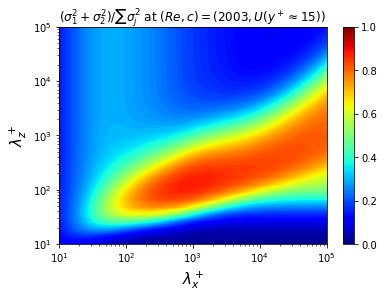

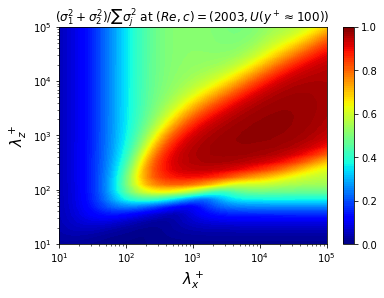

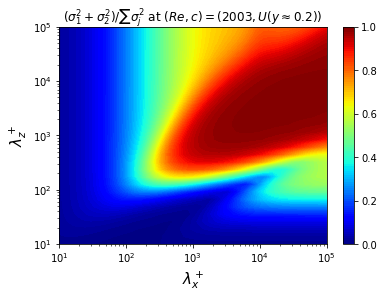

In [337]:
levels = np.linspace(0.,1.0,101)
cticks = np.linspace(0.,1.,6)

plt.contourf(lxpArr, lzpArr, svals2norm_state.T, levels=levels,cmap="jet")
plt.xscale("log"); plt.yscale("log"); plt.colorbar(ticks=cticks)
plt.xlabel("$\\lambda_x^+$",fontsize=15)
plt.ylabel("$\\lambda_z^+$",fontsize=15)
plt.title(
    "$(\\sigma^2_1 + \\sigma^2_2)/\sum \\sigma^2_j$ at $(Re,c)=(2003,U(y^+\\approx 15))$")
plt.savefig(figureFolder+'svals12norm_yp15.pdf',format='pdf')
plt.show()

plt.contourf(lxpArr, lzpArr, svals2norm_yp100_state.T, levels=levels,cmap="jet")
plt.xscale("log"); plt.yscale("log"); plt.colorbar(ticks=cticks)
plt.xlabel("$\\lambda_x^+$",fontsize=15)
plt.ylabel("$\\lambda_z^+$",fontsize=15)
plt.title(
    "$(\\sigma^2_1 + \\sigma^2_2)/\sum \\sigma^2_j$ at $(Re,c)=(2003,U(y^+\\approx 100))$")
plt.savefig(figureFolder+'svals12norm_yp100.pdf',format='pdf')
plt.show()

plt.contourf(lxpArr, lzpArr, svals2norm_y02_state.T, levels=levels,cmap="jet")
plt.xscale("log"); plt.yscale("log"); plt.colorbar(ticks=cticks)
plt.xlabel("$\\lambda_x^+$",fontsize=15)
plt.ylabel("$\\lambda_z^+$",fontsize=15)
plt.title(
    "$(\\sigma^2_1 + \\sigma^2_2)/\sum \\sigma^2_j$ at $(Re,c)=(2003,U(y\\approx 0.2))$")
plt.savefig(figureFolder+'svals12norm_y02.pdf',format='pdf')
plt.show()

# Mean velocity homogenization

I'm looking at two complementary problems.

1) Can the modification to the dynamics matrix from the covariance completion problem be modelled as being due to a change in mean velocity profile?

2) How do the resolvent modes change, considering their localization about critical layers, when the mean velocity profile is locally homogeneous (the staircase profile of UMZs)?

These lead to further questions such as finding similarity laws for this mean flow modification, and expressing eddy viscosity as a mean flow modification. Here, I look into the second problem. 

I need to create ''good'' mean velocity profiles. I've thought of two ways to do this. 

1) Introduce a local sine-like spike in the eddy viscosity. Since the mean velocity profile is computed as $\int\limits_0^y \frac{1-Y}{1+\nu_T(Y)}dY$, a very high value of $\nu_T$ produces a near-constant mean velocity, while a very low value produces a steep increase in the mean velocity. 

2) Assign a near-constant velocity to a few neighbouring wall-normal nodes. Since I use pseudo-spectral, I can obtain an exact set of Chebyshev polynomials that produce that particular profile. I can set the last several polynomials to zero, so that the velocity profile is smooth, but still retains some homogenization. As long as I drop a sufficient number of Cheb polynomials, the first and second derivatives should also be smooth enough. 

I'll start with the second method for now. 

There's also the question of bulk velocity: Should I ensure constant bulk velocity during the homogenization? The hierarchies of MTSM might be important to answering this question. 

Using parameters Re=1e+04, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.


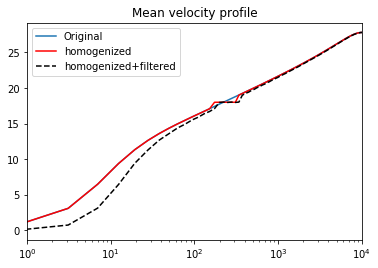

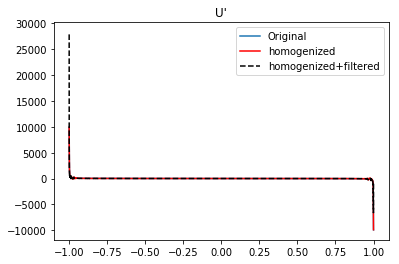

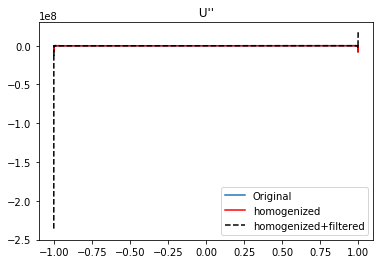

In [427]:
Re = 10000.; N=251; a= 2.5; b=7.; c = 18.
nInd =3; # Set values at 'nInd' nodes on either side to c
I2 = np.identity(2*N,dtype=np.complex); I3 = np.identity(3*N, dtype=np.complex)
statInst = ops.statComp(N=N,Re=Re,a=a,b=b, covMat = I3)

U0 = statInst.U[:-(N//2)].copy()
ind_Uc = np.where(U0<c)[0][-1]     # Suppose U0=c between U0[ind_Uc] and U0[ind_Uc+1]
U0[ind_Uc-nInd+1: ind_Uc+nInd+1] = c     # 'nInd' nodes on either side set to c
U0 = np.concatenate( (U0, U0[:N//2][::-1] ))
#U0 = pseudo.chebFilter(U0,Ndrop=0, symms='even')


U1 = pseudo.chebFilter(U0, Ndrop=5)

plt.plot(Re*(1.-statInst.y), statInst.U)
plt.plot(Re*(1.-statInst.y), U0, 'r-')
plt.plot(Re*(1.-statInst.y), U1, 'k--')
plt.xscale("log")
plt.xlim([1.,Re])
plt.title("Mean velocity profile")
plt.legend(['Original','homogenized','homogenized+filtered'])
plt.show()

D1 = statInst.D1
plt.plot(statInst.y, D1@statInst.U)
plt.plot(statInst.y, D1@U0, 'r-')
plt.plot(statInst.y, D1@U1, 'k--')
plt.title("U'")
plt.legend(['Original','homogenized','homogenized+filtered'])
plt.show()

D2 = statInst.D2
plt.plot(statInst.y, D2@statInst.U)
plt.plot(statInst.y, D2@U0, 'r-')
plt.plot(statInst.y, D2@U1, 'k--')
plt.title(" U'' ")
plt.legend(['Original','homogenized','homogenized+filtered'])
plt.show()



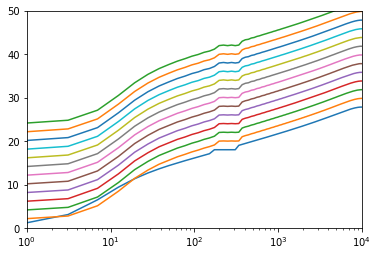

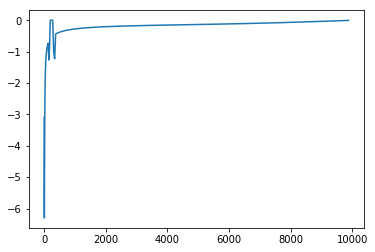

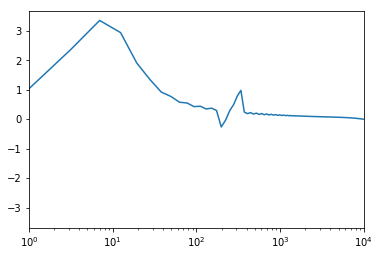

In [421]:
warnings.simplefilter('ignore')
yp = Re*(1.-statInst.y)

plt.figure()
plt.xscale("log"); plt.xlim([1.,Re])
plt.plot(yp, U0, label='homogenized')
for n in range(2,25,2):
    plt.plot(yp, np.abs(n+pseudo.chebFilter(U0, Ndrop=n)),label='Ndrop=%d'%n)
plt.ylim([0.,50.])
#plt.legend(loc=4)
plt.show()


U20 = pseudo.chebFilter(U0, Ndrop=10,symms='even')
plt.plot(yp[:N//2], U20[:N//2] - U20[-(N//2):][::-1])
plt.show()

plt.plot(yp, statInst.U - pseudo.chebFilter(U0, Ndrop=5) )
plt.xlim([1.,Re])
plt.xscale("log")
plt.show()

This way of homogenizing isn't going so well. Let's try the eddy viscosity based one. 

In [500]:
alfa = 25.4
kapa = 0.426
Re = statInst.Re; N = statInst.N; y = 1.-statInst.y
yPlusEq = 500.; 
zoneSize = 50.   # Extent of sine-wave-window
#spikeSize = 1000. # Amplitude of sine wave to introduce to nu_E
print("Using parameters Re=%.4g, alfa=%.4g, kapa=%.4g, N=%d"%(Re,alfa,kapa,N))
# The basic eddy viscosity equation
nuEbase = lambda zt: -0.5 + 0.5*np.sqrt( 1.+
            (kapa*Re/3.* (2.*zt - zt**2) * (3. - 4.*zt + 2.*zt**2) *
                         (1. - np.exp( (np.abs(zt-1.)-1.)*Re/alfa )   )    )**2)

# Choose location around which to homogenize in yPlus units
# I'll start calling this "equalization" instead of "homogenization"
assert yPlusEq < Re
yp = Re*y
eqInd = np.where(yp < yPlusEq)[0][-1] # yPlusEq is between yp[eqInd] and the next
print(eqInd)


def Utmp(zoneSize,spikeSize):
    
    # If the eddy viscosity profile needed for integration is for yp<yp_Eq,
    #    use the basic equation. Otherwise, use the enhanced equation
    def nuE(xi0):
        if isinstance(xi0,np.ndarray): print('xi0 is a numpy array')
        xi = np.array(xi0).flatten()
        if isinstance(xi,np.ndarray): print('xi is a numpy array')
        indDiff = xi.size - (eqInd - zoneSize)
        if indDiff < 0 : return nuEbase(xi)
        elif indDiff <= sineWave.size : 
            nuEenhanced = nuEbase(xi)  
            nuEenhanced[-indDiff:] += sineWave[:indDiff]
        else:
            nuEenhanced = nuEbase(xi)
            nuEenhanced[eqInd-zoneSize:eqInd+zoneSize+1] += sineWave
        return nuEenhanced
    

    intFun = lambda xi: Re * (1.-xi)/(1. + nuE(xi))
    U = np.zeros(statInst.N)

    for ind in range(np.int(np.ceil(N/2))):
        U[ind] = quad( intFun, 0., y[ind])[0]
    U[-(N//2):] = U[:N//2][::-1] 
    
    return U

U1 = Utmp(20,10.)
U2 = Utmp(10,1000.)

Using parameters Re=1e+04, alfa=25.4, kapa=0.426, N=251
24
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
xi is a numpy array
x

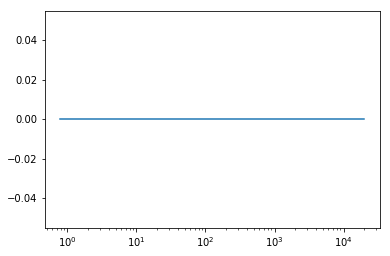

In [501]:
plt.plot(yp, U10_10 - U10_100)
plt.xscale("log")

In [484]:
Re = 2003.; alfa = 25.4; kapa=0.426; N=251
y = 1.- pseudo.chebdif(N,1)[0]
yp = Re*y
eqInd = 24; zoneSize = 4; spikeSize = 50.
sineWave = -spikeSize * np.sin(np.arange(-zoneSize,zoneSize+1)*np.pi/zoneSize)
# The basic eddy viscosity equation
nuEbase = lambda zt: -0.5 + 0.5*np.sqrt( 1.+
            (kapa*Re/3.* (2.*zt - zt**2) * (3. - 4.*zt + 2.*zt**2) *
                         (1. - np.exp( (np.abs(zt-1.)-1.)*Re/alfa )   )    )**2)

def nuE(xi0):
    print(xi0.size)
    xi = np.array(xi0).flatten()
    print(xi.size)
    indDiff = xi.size - (eqInd - zoneSize)
    if indDiff < 0 : return nuEbase(xi)
    elif indDiff <= sineWave.size : 
        nuEenhanced = nuEbase(xi)  
        nuEenhanced[-indDiff:] += sineWave[:indDiff]
    else:
        nuEenhanced = nuEbase(xi)
        nuEenhanced[eqInd-zoneSize:eqInd+zoneSize+1] += sineWave
    return nuEenhanced



50
50


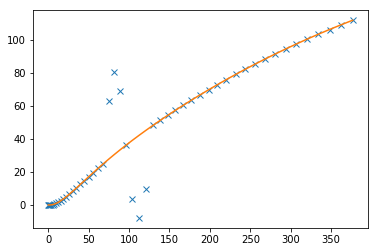

In [486]:
plt.plot(yp[:50], nuE(y[:50]),'x')
plt.plot(yp[:50], nuEbase(y[:50]))
#plt.xscale("log")


In [3]:
Re = 10000.; N=251; a= 2.5; b=7.
I2 = np.identity(2*N,dtype=np.complex); I3 = np.identity(3*N, dtype=np.complex)
statInst = ops.statComp(N=N,Re=Re,a=a,b=b, covMat = I3)


alfa = 25.4
kapa = 0.426
Re = statInst.Re; N = statInst.N; y = 1.-statInst.y; yp = Re*y
negFactor0 = -1.
posFactor0 = 40.
def nuDiffSine(yScal, ypMin, ypMax, sineAmp,
              negFactor=negFactor0, posFactor=posFactor0,
              switchLoc=0.5):
    ypScal = Re*yScal
    if ypMin <= ypScal <= ypMin+switchLoc*(ypMax-ypMin):
        sineCoord = ypScal - ypMin
        sineSize = ypMax - ypMin
        nuAdd = negFactor* sineAmp* np.sin( (sineCoord/sineSize - 0.5)*2.*np.pi )
        #nuAdd = 0.1* (ypScal**0.5) * nuAdd
    elif ypMin+switchLoc*(ypMax-ypMin)< ypScal < ypMax:
        sineCoord = ypScal - ypMin
        sineSize = ypMax - ypMin
        nuAdd = posFactor* sineAmp* np.sin( (sineCoord/sineSize - 0.5)*2.*np.pi )
        #nuAdd = 0.1* (ypScal**0.5) * nuAdd
    else: nuAdd = 0.
    return nuAdd

def nuDiffHat(yScal, ypMin, ypMax, hatAmp,
              negFactor=negFactor0, posFactor=posFactor0,
              switchLoc=0.5):
    ypScal = Re*yScal
    if ypMin <= ypScal <= ypMin+switchLoc*(ypMax-ypMin):
        nuAdd = negFactor* hatAmp
    elif ypMin+switchLoc*(ypMax-ypMin)< ypScal < ypMax:
        nuAdd =  posFactor* hatAmp
    else: nuAdd = 0.
    return nuAdd


print("Using parameters Re=%.4g, alfa=%.4g, kapa=%.4g, N=%d"%(Re,alfa,kapa,N))
# The basic eddy viscosity equation
nuEbase = lambda zt: -0.5 + 0.5*np.sqrt( 1.+
            (kapa*Re/3.* (2.*zt - zt**2) * (3. - 4.*zt + 2.*zt**2) *
                         (1. - np.exp( (np.abs(zt-1.)-1.)*Re/alfa )   )    )**2)

def Utmp(ypMin,ypMax, sineAmp,**kwargs):
    nuDiffLoc = lambda xi: nuDiffHat(xi, ypMin,ypMax,sineAmp,**kwargs)
    nuE = lambda xi: nuEbase(xi) + nuDiffLoc(xi)

    intFun = lambda xi: Re * (1.-xi)/(1. + nuE(xi))
    U = np.zeros(statInst.N)

    for ind in range(np.int(np.ceil(N/2))):
        U[ind] = quad( intFun, 0., y[ind])[0]
    U[-(N//2):] = U[:N//2][::-1] 
    
    return U



Using parameters Re=1e+04, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
Using parameters Re=1e+04, alfa=25.4, kapa=0.426, N=251


/home/svadarevu/linenv/lib/python3.5/site-packages/scipy/integrate/quadpack.py:356: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  warnings.warn(msg, IntegrationWarning)


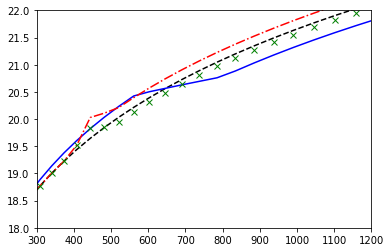

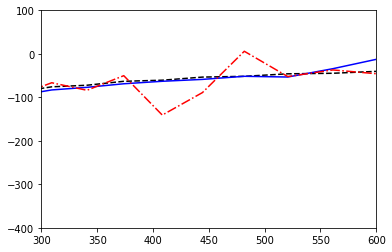

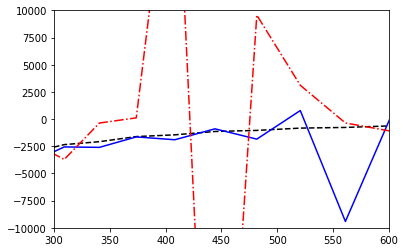

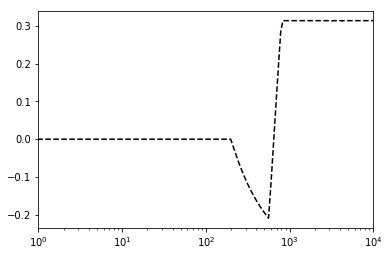

In [36]:
U0 = Utmp(400., 600., 0.)
U1 = Utmp(200., 800., 10., switchLoc=0.61)
U2 = Utmp(400., 500., 10.)
U3 = Utmp(400., 500., 10., switchLoc=0.3)


plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, U0,'k--')
plt.plot(yp, U1,'b')
plt.plot(yp, U2,'r-.')
plt.plot(yp, U3,'gx')
plt.xlim([300.,1200.])
plt.ylim([18.,22.])
#plt.xscale("log")
plt.show()


DM = pseudo.chebdif(U0.size,2)[1]
D1 = DM[:,:,0]
D2 = DM[:,:,1]

plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, D1@U0,'k--')
plt.plot(yp, D1@U1,'b')
plt.plot(yp, D1@U2,'r-.')
plt.xlim([300.,600.])
#plt.autoscale()
plt.xlim([300.,600.])
plt.ylim([-400.,100.])
#plt.xscale("log")
plt.show()


plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, D2@U0,'k--')
plt.plot(yp, D2@U1,'b')
plt.plot(yp, D2@U2,'r-.')
plt.xlim([300.,600.])
plt.ylim([-1.e04,1.e04])
#plt.xscale("log")
plt.show()

plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, U0-U1,'k--')
plt.xscale("log")
plt.show()



# Response to stochastic forcing for a homogenized profile

## Base flow without homogenization, and homogenization scheme

In [163]:
Re = 10000.; N=251; a= 2.5; b=7.
I2 = np.identity(2*N,dtype=np.complex); I3 = np.identity(3*N, dtype=np.complex)
statInst = ops.statComp(N=N,Re=Re,a=a,b=b, covMat = I3)


alfa = 25.4
kapa = 0.426
Re = statInst.Re; N = statInst.N; y = 1.-statInst.y; yp = Re*y
negFactor0 = -1.
posFactor0 = 40.
def nuDiffSine(yScal, ypMin, ypMax, sineAmp,
              negFactor=negFactor0, posFactor=posFactor0,
              switchLoc=0.5):
    ypScal = Re*yScal
    if ypMin <= ypScal <= ypMin+switchLoc*(ypMax-ypMin):
        sineCoord = ypScal - ypMin
        sineSize = ypMax - ypMin
        nuAdd = negFactor* sineAmp* np.sin( (sineCoord/sineSize - 0.5)*2.*np.pi )
        #nuAdd = 0.1* (ypScal**0.5) * nuAdd
    elif ypMin+switchLoc*(ypMax-ypMin)< ypScal < ypMax:
        sineCoord = ypScal - ypMin
        sineSize = ypMax - ypMin
        nuAdd = posFactor* sineAmp* np.sin( (sineCoord/sineSize - 0.5)*2.*np.pi )
        #nuAdd = 0.1* (ypScal**0.5) * nuAdd
    else: nuAdd = 0.
    return nuAdd

def nuDiffHat(yScal, ypMin, ypMax, hatAmp,
              negFactor=negFactor0, posFactor=posFactor0,
              switchLoc=0.5):
    ypScal = Re*yScal
    if ypMin <= ypScal <= ypMin+switchLoc*(ypMax-ypMin):
        nuAdd = negFactor* hatAmp
    elif ypMin+switchLoc*(ypMax-ypMin)< ypScal < ypMax:
        nuAdd =  posFactor* hatAmp
    else: nuAdd = 0.
    return nuAdd


print("Using parameters Re=%.4g, alfa=%.4g, kapa=%.4g, N=%d"%(Re,alfa,kapa,N))
# The basic eddy viscosity equation
nuEbase = lambda zt: -0.5 + 0.5*np.sqrt( 1.+
            (kapa*Re/3.* (2.*zt - zt**2) * (3. - 4.*zt + 2.*zt**2) *
                         (1. - np.exp( (np.abs(zt-1.)-1.)*Re/alfa )   )    )**2)

def Utmp(ypMin,ypMax, sineAmp,**kwargs):
    N = kwargs.get('N',N); Re = kwargs.get('Re',Re)
    nuDiffLoc = lambda xi: nuDiffHat(xi, ypMin,ypMax,sineAmp,**kwargs)
    nuE = lambda xi: nuEbase(xi) + nuDiffLoc(xi)

    intFun = lambda xi: Re * (1.-xi)/(1. + nuE(xi))
    U = np.zeros(N)

    for ind in range(np.int(np.ceil(N/2))):
        U[ind] = quad( intFun, 0., y[ind])[0]
    U[-(N//2):] = U[:N//2][::-1] 
    
    return U



Using parameters Re=1e+04, alfa=25.4, kapa=0.426, N=251
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
Using parameters Re=1e+04, alfa=25.4, kapa=0.426, N=251


## Case 1
### Homogenization in the early log layer

/home/svadarevu/linenv/lib/python3.5/site-packages/scipy/integrate/quadpack.py:356: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  warnings.warn(msg, IntegrationWarning)
/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy vis

a, b, Re: 2.5 7.0 10000.0
a, b, Re: 2.5 7.0 10000.0
a, b, Re: 2.5 7.0 10000.0


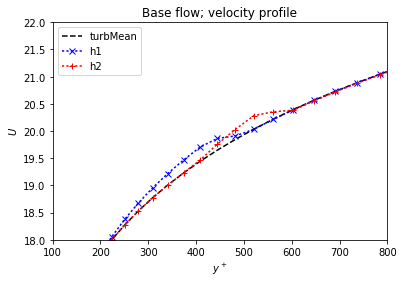

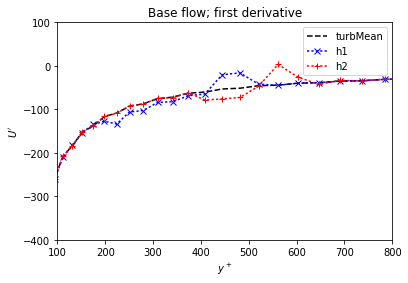

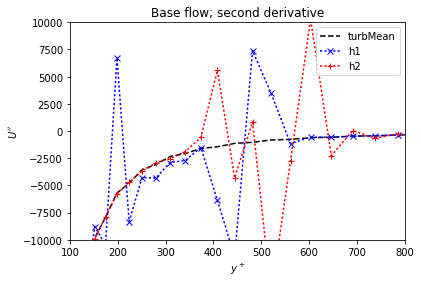

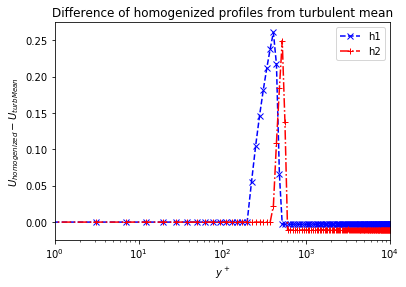

In [151]:
statInst1 = copy.deepcopy(statInst)
statInst2 = copy.deepcopy(statInst)
U1 = Utmp(200., 500., 15., switchLoc=0.77)
U2 = Utmp(400., 600., 50., switchLoc=0.65)

statInst1.U = U1
statInst1.dU = D1 @ U1
statInst1.d2U = D2 @ U1

statInst2.U = U2
statInst2.dU = D1 @ U2
statInst2.d2U = D2 @ U2


A,C,B = statInst.makeSystemNew()
A1,C1,B1 = statInst1.makeSystemNew()
A2,C2,B2 = statInst2.makeSystemNew()

U0 = statInst.U; U1 = statInst1.U; U2 = statInst2.U
plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, U0,'k--')
plt.plot(yp, U1,'bx:')
plt.plot(yp, U2,'r+:')
plt.xlim([100.,800.])
plt.ylim([18.,22.])
plt.title("Base flow; velocity profile")
plt.xlabel('$y^+$')
plt.ylabel('$U$')
plt.legend(['turbMean','h1', 'h2'])
#plt.xscale("log")
plt.show()

dU0 = statInst.dU; dU1 = statInst1.dU; dU2 = statInst2.dU
plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, dU0,'k--')
plt.plot(yp, dU1,'bx:')
plt.plot(yp, dU2,'r+:')
#plt.autoscale()
plt.xlim([100.,800.])
plt.ylim([-400.,100.])
#plt.xscale("log")
plt.title("Base flow; first derivative")
plt.xlabel('$y^+$')
plt.ylabel("$U'$")
plt.legend(['turbMean','h1', 'h2'])
plt.show()

d2U0 = statInst.d2U; d2U1 = statInst1.d2U; d2U2 = statInst2.d2U
plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, d2U0,'k--')
plt.plot(yp, d2U1,'bx:')
plt.plot(yp, d2U2,'r+:')
plt.xlim([100.,800.])
plt.ylim([-1.e04,1.e04])
plt.title("Base flow; second derivative")
plt.xlabel('$y^+$')
plt.ylabel("$U''$")
#plt.xscale("log")
plt.legend(['turbMean','h1', 'h2'])
plt.show()

plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, U1-U0,'bx--')
plt.plot(yp, U2-U0,'r+-.')
plt.xscale("log")
plt.ylabel("$U_{homogenized}-U_{turbMean}$")
plt.xlabel("$y^+$")
plt.legend(['h1','h2'])
plt.title("Difference of homogenized profiles from turbulent mean")
plt.show()


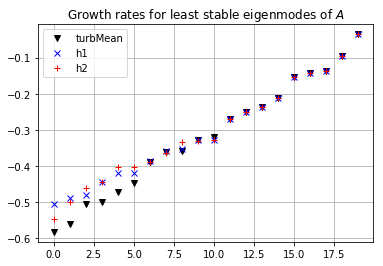

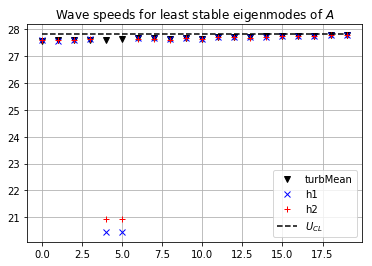

In [155]:
evals = np.linalg.eigvals(A);  sortInd = np.argsort(evals.real)
evalsRe = evals[sortInd].real; evalsIm = evals[sortInd].imag

evals1 = np.linalg.eigvals(A1);  sortInd1 = np.argsort(evals1.real)
evals1Re = evals1[sortInd1].real; evals1Im = evals1[sortInd1].imag

evals2 = np.linalg.eigvals(A2);  sortInd2 = np.argsort(evals2.real)
evals2Re = evals2[sortInd2].real; evals2Im = evals2[sortInd2].imag

plt.plot(evalsRe[-20:],'kv')
plt.plot(evals1Re[-20:],'bx')
plt.plot(evals2Re[-20:],'r+')
#plt.ylim([-1.,0.])
plt.grid('on')
plt.title("Growth rates for least stable eigenmodes of $A$")
plt.legend(['turbMean','h1', 'h2'], loc=2)
plt.show()

plt.plot(-evalsIm[-20:]/a,'kv')
plt.plot(-evals1Im[-20:]/a,'bx')
plt.plot(-evals2Im[-20:]/a,'r+')
plt.plot(np.max(U0)*np.ones(20),'k--')
#plt.ylim([-1.,0.])
plt.grid('on')
plt.title("Wave speeds for least stable eigenmodes of $A$")
plt.legend(['turbMean','h1', 'h2', '$U_{CL}$'], loc=4)
plt.show()




In [156]:
X = solve_lyapunov(A, -1.e-5*I2)
X1= solve_lyapunov(A1,-1.e-5*I2)
X2= solve_lyapunov(A2,-1.e-5*I2)
Phi = C @ X @ C.conj().T
Phi1= C1@ X1@ C1.conj().T
Phi2= C2@ X2@ C2.conj().T
N = statInst.N
yp = statInst.Re*(1.-statInst.y)

weightDict = pseudo.weightMats(N=N)
W3si = weightDict['W3SqrtInv']
Phi = W3si @ Phi  @ W3si
Phi1= W3si @ Phi1 @ W3si
Phi2= W3si @ Phi2 @ W3si


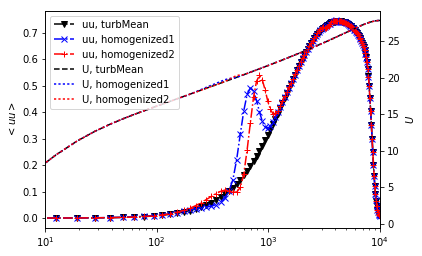

In [157]:
fig,ax1 = plt.subplots()

ax1.plot(yp,  np.real(np.diag( Phi[:N,:N])), 'kv-.',label='uu, turbMean')
ax1.plot(yp,  np.real(np.diag(Phi1[:N,:N])), 'bx-.',label='uu, homogenized1')
ax1.plot(yp,  np.real(np.diag(Phi2[:N,:N])), 'r+-.',label='uu, homogenized2')
ax1.set_xlim([100.,10000.])
ax1.set_xscale("log")
ax1.set_ylabel("$<uu>$")
ax1.set_xlim([10.,Re])

ax2 = ax1.twinx()
ax2.plot(yp, U0, 'k--',label='U, turbMean')
ax2.plot(yp, U1, 'b:',label='U, homogenized1')
ax2.plot(yp, U2, 'r:',label='U, homogenized2')
ax2.set_ylabel("$U$")
ax2.set_xlim([10.,Re])
plt.legend()
plt.title("")
plt.xlabel("$y^+$")

line1,label1 = ax1.get_legend_handles_labels()
line2,label2 = ax2.get_legend_handles_labels()
ax2.legend(line1+line2, label1+label2,loc=2)

plt.title("Base flow and streamwise kinetic energy")

plt.show()

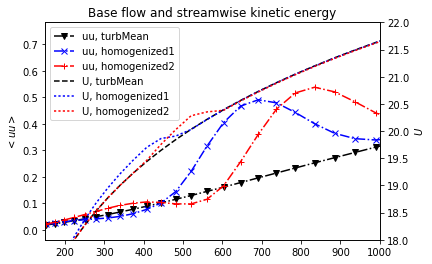

In [159]:
fig,ax1 = plt.subplots()

ax1.plot(yp,  np.real(np.diag( Phi[:N,:N])), 'kv-.',label='uu, turbMean')
ax1.plot(yp,  np.real(np.diag(Phi1[:N,:N])), 'bx-.',label='uu, homogenized1')
ax1.plot(yp,  np.real(np.diag(Phi2[:N,:N])), 'r+-.',label='uu, homogenized2')
ax1.set_xlim([150.,1000.])
#ax1.set_xscale("log")
ax1.set_ylabel("$<uu>$")
ax1.set_xlim([10.,Re])


ax2 = ax1.twinx()
ax2.plot(yp, U0, 'k--',label='U, turbMean')
ax2.plot(yp, U1, 'b:',label='U, homogenized1')
ax2.plot(yp, U2, 'r:',label='U, homogenized2')
ax2.set_ylabel("$U$")
ax2.set_xlim([150.,1000.])
ax2.set_ylim([18.,22.])
plt.legend()
plt.title("")
plt.xlabel("$y^+$")

line1,label1 = ax1.get_legend_handles_labels()
line2,label2 = ax2.get_legend_handles_labels()
ax2.legend(line1+line2, label1+label2,loc=2)

plt.title("Base flow and streamwise kinetic energy")

plt.show()

## Case 2
### Homogenization in the buffer layer

/home/svadarevu/linenv/lib/python3.5/site-packages/scipy/integrate/quadpack.py:356: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  warnings.warn(msg, IntegrationWarning)
/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy vis

a, b, Re: 2.5 7.0 10000.0
a, b, Re: 2.5 7.0 10000.0
a, b, Re: 2.5 7.0 10000.0


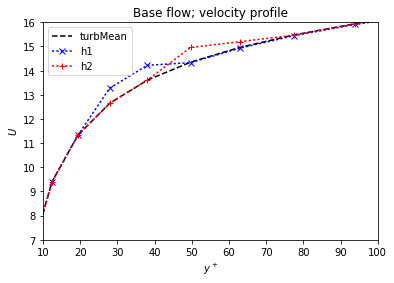

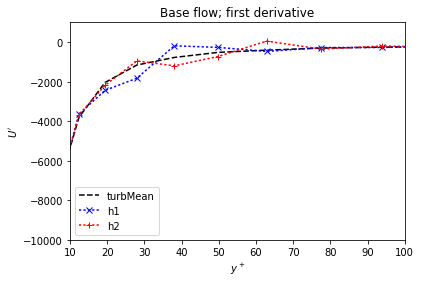

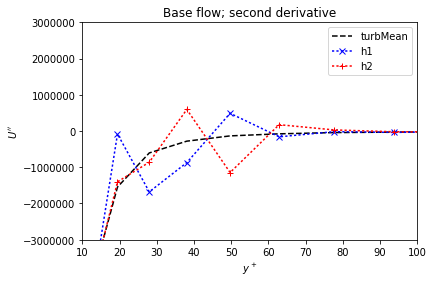

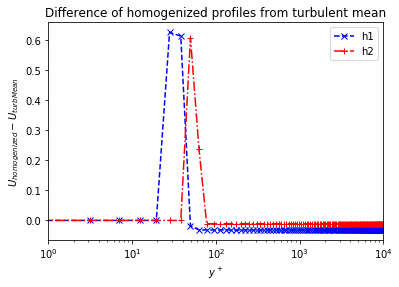

In [178]:
statInst1 = copy.deepcopy(statInst)
statInst2 = copy.deepcopy(statInst)
U1 = Utmp(20., 50., 2.2, switchLoc=0.5)
U2 = Utmp(40., 70., 8., switchLoc=0.4)

statInst1.U = U1
statInst1.dU = D1 @ U1
statInst1.d2U = D2 @ U1

statInst2.U = U2
statInst2.dU = D1 @ U2
statInst2.d2U = D2 @ U2


A,C,B = statInst.makeSystemNew()
A1,C1,B1 = statInst1.makeSystemNew()
A2,C2,B2 = statInst2.makeSystemNew()

U0 = statInst.U; U1 = statInst1.U; U2 = statInst2.U
plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, U0,'k--')
plt.plot(yp, U1,'bx:')
plt.plot(yp, U2,'r+:')
plt.xlim([10.,100.])
plt.ylim([7.,16.])
plt.title("Base flow; velocity profile")
plt.xlabel('$y^+$')
plt.ylabel('$U$')
plt.legend(['turbMean','h1', 'h2'])
#plt.xscale("log")
plt.show()

dU0 = statInst.dU; dU1 = statInst1.dU; dU2 = statInst2.dU
plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, dU0,'k--')
plt.plot(yp, dU1,'bx:')
plt.plot(yp, dU2,'r+:')
#plt.autoscale()
plt.xlim([10.,100.])
plt.ylim([-10000.,1000.])
#plt.xscale("log")
plt.title("Base flow; first derivative")
plt.xlabel('$y^+$')
plt.ylabel("$U'$")
plt.legend(['turbMean','h1', 'h2'])
plt.show()

d2U0 = statInst.d2U; d2U1 = statInst1.d2U; d2U2 = statInst2.d2U
plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, d2U0,'k--')
plt.plot(yp, d2U1,'bx:')
plt.plot(yp, d2U2,'r+:')
plt.xlim([10.,100.])
plt.ylim([-3.e06,3.e06])
plt.title("Base flow; second derivative")
plt.xlabel('$y^+$')
plt.ylabel("$U''$")
#plt.xscale("log")
plt.legend(['turbMean','h1', 'h2'])
plt.show()

plt.figure()
plt.xlim([1.,Re])
plt.plot(yp, U1-U0,'bx--')
plt.plot(yp, U2-U0,'r+-.')
plt.xscale("log")
plt.ylabel("$U_{homogenized}-U_{turbMean}$")
plt.xlabel("$y^+$")
plt.legend(['h1','h2'])
plt.title("Difference of homogenized profiles from turbulent mean")
plt.show()


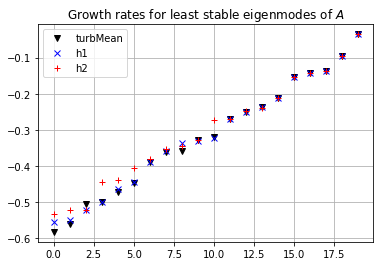

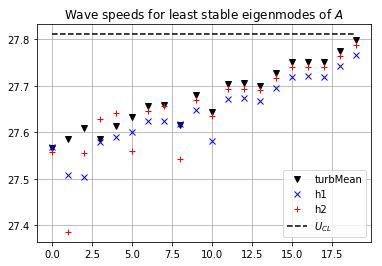

In [179]:
evals = np.linalg.eigvals(A);  sortInd = np.argsort(evals.real)
evalsRe = evals[sortInd].real; evalsIm = evals[sortInd].imag

evals1 = np.linalg.eigvals(A1);  sortInd1 = np.argsort(evals1.real)
evals1Re = evals1[sortInd1].real; evals1Im = evals1[sortInd1].imag

evals2 = np.linalg.eigvals(A2);  sortInd2 = np.argsort(evals2.real)
evals2Re = evals2[sortInd2].real; evals2Im = evals2[sortInd2].imag

plt.plot(evalsRe[-20:],'kv')
plt.plot(evals1Re[-20:],'bx')
plt.plot(evals2Re[-20:],'r+')
#plt.ylim([-1.,0.])
plt.grid('on')
plt.title("Growth rates for least stable eigenmodes of $A$")
plt.legend(['turbMean','h1', 'h2'], loc=2)
plt.show()

plt.plot(-evalsIm[-20:]/a,'kv')
plt.plot(-evals1Im[-20:]/a,'bx')
plt.plot(-evals2Im[-20:]/a,'r+')
plt.plot(np.max(U0)*np.ones(20),'k--')
#plt.ylim([-1.,0.])
plt.grid('on')
plt.title("Wave speeds for least stable eigenmodes of $A$")
plt.legend(['turbMean','h1', 'h2', '$U_{CL}$'], loc=4)
plt.show()




In [180]:
X = solve_lyapunov(A, -1.e-5*I2)
X1= solve_lyapunov(A1,-1.e-5*I2)
X2= solve_lyapunov(A2,-1.e-5*I2)
Phi = C @ X @ C.conj().T
Phi1= C1@ X1@ C1.conj().T
Phi2= C2@ X2@ C2.conj().T
N = statInst.N
yp = statInst.Re*(1.-statInst.y)

weightDict = pseudo.weightMats(N=N)
W3si = weightDict['W3SqrtInv']
Phi = W3si @ Phi  @ W3si
Phi1= W3si @ Phi1 @ W3si
Phi2= W3si @ Phi2 @ W3si


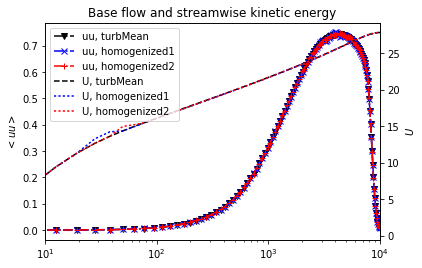

In [181]:
fig,ax1 = plt.subplots()

ax1.plot(yp,  np.real(np.diag( Phi[:N,:N])), 'kv-.',label='uu, turbMean')
ax1.plot(yp,  np.real(np.diag(Phi1[:N,:N])), 'bx-.',label='uu, homogenized1')
ax1.plot(yp,  np.real(np.diag(Phi2[:N,:N])), 'r+-.',label='uu, homogenized2')
ax1.set_xlim([100.,10000.])
ax1.set_xscale("log")
ax1.set_ylabel("$<uu>$")
ax1.set_xlim([10.,Re])

ax2 = ax1.twinx()
ax2.plot(yp, U0, 'k--',label='U, turbMean')
ax2.plot(yp, U1, 'b:',label='U, homogenized1')
ax2.plot(yp, U2, 'r:',label='U, homogenized2')
ax2.set_ylabel("$U$")
ax2.set_xlim([10.,Re])
plt.legend()
plt.title("")
plt.xlabel("$y^+$")

line1,label1 = ax1.get_legend_handles_labels()
line2,label2 = ax2.get_legend_handles_labels()
ax2.legend(line1+line2, label1+label2,loc=2)

plt.title("Base flow and streamwise kinetic energy")

plt.show()

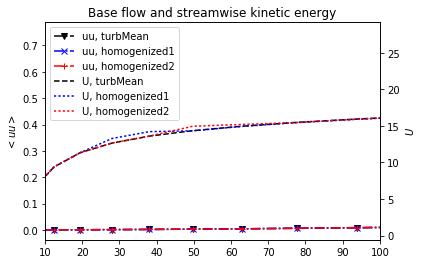

In [184]:
fig,ax1 = plt.subplots()

ax1.plot(yp,  np.real(np.diag( Phi[:N,:N])), 'kv-.',label='uu, turbMean')
ax1.plot(yp,  np.real(np.diag(Phi1[:N,:N])), 'bx-.',label='uu, homogenized1')
ax1.plot(yp,  np.real(np.diag(Phi2[:N,:N])), 'r+-.',label='uu, homogenized2')
ax1.set_xlim([10.,100.])
#ax1.set_xscale("log")
ax1.set_ylabel("$<uu>$")


ax2 = ax1.twinx()
ax2.plot(yp, U0, 'k--',label='U, turbMean')
ax2.plot(yp, U1, 'b:',label='U, homogenized1')
ax2.plot(yp, U2, 'r:',label='U, homogenized2')
ax2.set_ylabel("$U$")
ax2.set_xlim([10.,100.])
#ax2.set_ylim([18.,22.])
plt.legend()
plt.title("")
plt.xlabel("$y^+$")

line1,label1 = ax1.get_legend_handles_labels()
line2,label2 = ax2.get_legend_handles_labels()
ax2.legend(line1+line2, label1+label2,loc=2)

plt.title("Base flow and streamwise kinetic energy")

plt.show()

# Constraining homogenized velocity profiles

I'm pursuing two constraints. 

1) ** Ensure that the velocity profile isn't affected at some reference location that is sufficiently far from the region of homogenization. I'll use the geometric mean of the end of homogenization and the edge of the log layer as this reference location.**

2) ** Drive the least stable eigenmode towards marginal stability. **

For the first constraint, I'll use 'switchLoc', the location where the eddy viscosity modification is switched from negative to positive. For the second, I'll use the amplitude of the negative modification.

This still leaves me with three parameters: ypMin, ypMax, and posFactor (fixing negFactor at -1). And these are for any chosen functional form for the eddy viscosity modification. I'll also have to see how the form of the modification changes the energy profile, as well as the behaviour of the derivatives of the velocity profile. 

## Constraint 1: matching base velocity

So, given ypMin, ypMax, posFactor, and hatAmp (or amplitude of whatever functional form), choose a switchLoc so that
$$ U_0(y^+=\sqrt{y^+_{max} Re_\tau}) = U_1(y^+=\sqrt{y^+_{max} Re_\tau}) $$
where $U_0$ is the turbulent mean, and $U_1$ is the modified base. Here, I'm using the geometric mean of the edge of homogenization and the centerline, instead of edge of homogenization and edge of log-layer; because I don't want to get into the details of where the log layer ends right now. 

I can do a simple binary search for switchLoc between 0 and 1. I am a bit worried about the resolution used by Scipy's quad; how fine can the changes to switchLoc be? I suppose if I keep my tolerance high enough, this should not be an issue. 

Let's do the binary search first, since I'll use this quite extensively later on. 

In [432]:
Re = 10000.; N=501; a= 2.5; b=20./3.
I2 = np.identity(2*N,dtype=np.complex); I3 = np.identity(3*N, dtype=np.complex)
statInst = ops.statComp(N=N,Re=Re,a=a,b=b, covMat = I3)

alfa = 25.4
kapa = 0.426
Re = statInst.Re; N = statInst.N; y = 1.-statInst.y; yp = Re*y

def nuDiffSine(yScal, ypMin, ypMax, sineAmp,
              posFactor=posFactor0, switchLoc=0.5):
    ypScal = Re*yScal
    negFactor = -1.
    ypSwitch = ypMin+switchLoc*(ypMax-ypMin)
    if ypMin <= ypScal <= ypSwitch:
        phase = np.pi*(ypScal - ypMin)/(ypSwitch-ypMin)
        nuAdd = negFactor* sineAmp* np.sqrt(np.sin(phase))
        
    elif ypSwitch< ypScal < ypMax:
        phase = np.pi*(ypScal - ypSwitch)/(ypMax-ypSwitch)
        nuAdd = posFactor* sineAmp* np.sqrt(np.sin(phase))
        
    else: nuAdd = 0.
    return np.real(nuAdd)

def nuDiffHat(yScal, ypMin, ypMax, hatAmp,
              posFactor=posFactor0, switchLoc=0.5):
    ypScal = Re*yScal
    negFactor = -1.
    ypSwitch = ypMin+switchLoc*(ypMax-ypMin)
    if ypMin <= ypScal <= ypSwitch:
        nuAdd = negFactor* hatAmp
    elif ypSwitch< ypScal < ypMax:
        nuAdd =  posFactor* hatAmp
    else: nuAdd = 0.
    return nuAdd


print("Using parameters Re=%.4g, alfa=%.4g, kapa=%.4g, N=%d"%(Re,alfa,kapa,N))
# The basic eddy viscosity equation
nuEbase = lambda zt: -0.5 + 0.5*np.sqrt( 1.+
            (kapa*Re/3.* (2.*zt - zt**2) * (3. - 4.*zt + 2.*zt**2) *
                         (1. - np.exp( (np.abs(zt-1.)-1.)*Re/alfa )   )    )**2)

def Utmp(ypMin,ypMax, modAmp,sine=False,**kwargs):
    
    if sine:
        nuDiffLoc = lambda xi: nuDiffSine(xi, ypMin,ypMax,modAmp,**kwargs)
    else:
        nuDiffLoc = lambda xi: nuDiffHat(xi, ypMin,ypMax,modAmp,**kwargs)
    nuE = lambda xi: nuEbase(xi) + nuDiffLoc(xi)
    
    #intFun = lambda xi: Re * (1.-xi)/(1. + nuE(xi))
    # I'll hold eddy viscosity to be non-negative
    def intFun(xi):
        nuEscalar = nuE(xi)
        return Re * (1.-xi)/(1. + 0.5*(nuEscalar+abs(nuEscalar))   )
    
    U = np.zeros(statInst.N)
    U[0] = quad(intFun, 0., y[0])[0]
    
    for ind in range(1,np.int(np.ceil(N/2))):
        U[ind] = U[ind-1] + quad( intFun, y[ind-1], y[ind], limit=200)[0]
    U[-(N//2):] = U[:N//2][::-1] 
    
    return U




markers0= ['v','+','x','^','*', 'o','s','d']

def plotBase(*Uprofiles, Ulabels=None, ypLim=[100.,Re/10.], Ulim=[16., 22.], markers=None):
    if markers is None: markers = markers0
    for ind in range(len(Uprofiles)):
        U = Uprofiles[ind]
        plt.plot(yp, U, '-.', marker=markers[ind%len(markers)])
    plt.xlim(ypLim)
    plt.ylim(Ulim)
    plt.title("Base velocity profile")
    plt.xlabel("$y^+$"); plt.ylabel("$U$")
    if Ulabels is not None:
        plt.legend(Ulabels, loc=2)
    plt.show()


def plotEvals(*Uprofiles, Ulabels=None, markers=None,nEvals=20):
    if markers is None: markers = markers0
    if Ulabels is None: Ulabels = ['U'+str(n) for n in np.arange(len(Uprofiles))]
    for ind in range(len(Uprofiles)):
        U = Uprofiles[ind]

        statInst1 = copy.deepcopy(statInst)
        statInst1.U = U
        statInst1.dU = statInst.D1 @ U
        statInst1.d2U = statInst.D2 @ U

        [A,C,Qs] = statInst1.makeSystemNew()

        evals = np.linalg.eigvals(A);  sortInd = np.argsort(evals.real)
        evalsRe = evals[sortInd].real; evalsIm = evals[sortInd].imag
        
        plt.scatter(-evalsIm[-nEvals:]/statInst.a, evalsRe[-nEvals:],marker=markers[ind%len(markers)], label=Ulabels[ind])
        
        print("Largest growth rate for %s is %.3g"%(Ulabels[ind], evalsRe[-1]))
        
    plt.grid('on')
    plt.title("Eigenspectrum of $A$")
    plt.xlabel("Phase-speed")
    plt.ylabel("Growth rate")
    plt.plot(np.max(U0)*np.ones(10), np.linspace(-0.8, 0., 10), 'k-', label='U_CL')
    plt.legend(loc=4)
    plt.show()



U0 = Utmp(400., 500., 0.)
# This is the function that needs to be minimized (absolute value) to impose the first constraint
# I will fix ypMin, ypMax, modAmp, and posFactor, and find the optimal value for switchLoc
def Uconstr1Fun(**kwargs):
    U1 = Utmp(**kwargs)
    ypMax = kwargs['ypMax']
    ypRef = np.sqrt( ypMax * Re)
    yRefInd = np.where( yp < ypRef)[0][-1] + 1
    
    return U1[yRefInd] - U0[yRefInd]

statInst1 = copy.deepcopy(statInst)
def Uconstr2Fun(**kwargs):
    U1 = Utmp(**kwargs)
    statInst1.U = U1
    statInst1.dU = statInst.D1 @ U1
    statInst1.d2U = statInst.D2 @ U1

    [A,C,Qs] = statInst1.makeSystemNew()

    evals = np.linalg.eigvals(A);  sortInd = np.argsort(evals.real)
    evalsRe = evals[sortInd].real;
    return evalsRe[-1]


def marginalWave(ypMin, ypMax, posFactor= 30., ampMax=200., nSteps=10,**kwargs):
    amp0 = 1.e-3; amp1 = ampMax
    def UconstrCompFun(modAmp):
        # First, find optimal switch location. Return the largest growth rate for this switchLoc
        genFun = lambda var: Uconstr1Fun(switchLoc = var,
                                    ypMin=ypMin, ypMax=ypMax, modAmp=modAmp, posFactor=posFactor,**kwargs)
        optSwitchLoc = miscUtil.binarySearch(genFun, 0., 1., nSteps = 20, tol = 0.01)

        return Uconstr2Fun(switchLoc = optSwitchLoc,
                           ypMin=ypMin, ypMax=ypMax, modAmp =modAmp, posFactor=posFactor,**kwargs)

    compFun = lambda var: UconstrCompFun(var)

    optModAmp = miscUtil.binarySearch(compFun, amp0, amp1, nSteps=nSteps, tol=0.0001)
    genFun = lambda var: Uconstr1Fun(switchLoc = var,
                                    ypMin=ypMin, ypMax=ypMax, modAmp=optModAmp, posFactor=posFactor,**kwargs)
    optSwitchLoc = miscUtil.binarySearch(genFun, 0., 1., nSteps = 20, tol = 0.01)
        
    return optModAmp, optSwitchLoc

Using parameters Re=1e+04, alfa=25.4, kapa=0.426, N=501
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
Using parameters Re=1e+04, alfa=25.4, kapa=0.426, N=501


## Constraint 1, with switchLoc as the parameter

In [389]:
ypMin = 400.; ypMax = 600.; modAmp = 100.; posFactor = 30. 
genFun = lambda var: Uconstr1Fun(switchLoc = var,
                                ypMin=ypMin, ypMax=ypMax, modAmp=modAmp, posFactor=posFactor)

optSwitchLoc = miscUtil.binarySearch(genFun, 0., 1., nSteps = 20, tol = 0.01)
print("Switch location to impose contraint 1 is", optSwitchLoc)
print("Error in contraint 1 is", genFun(optSwitchLoc))

Switch location to impose contraint 1 is 0.3515625
Error in contraint 1 is 0.000167075042167


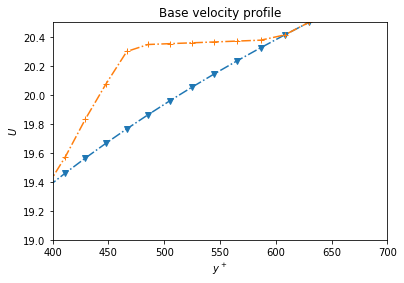

/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 2.5 6.666666666666667 10000.0
Largest growth rate for U0 is -0.0347
a, b, Re: 2.5 6.666666666666667 10000.0
Largest growth rate for U1 is 0.00438


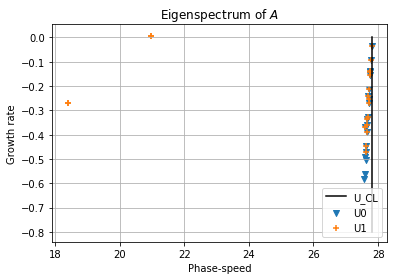

In [390]:
Uopt = Utmp(ypMin, ypMax, modAmp, posFactor=posFactor, switchLoc=optSwitchLoc)
plotBase(U0, Uopt, ypLim = [ypMin,ypMax+100.], Ulim=[19., 20.5])
plotEvals(U0, Uopt)

## Constraint 2, with posFactor as the variable

Amplitude is  5.0
Switch location to impose contraint 1 is 0.9375
Error in contraint 1 is 0.0230984401592


/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 2.5 6.666666666666667 10000.0
Amplitude is  10.0
Switch location to impose contraint 1 is 0.875
Error in contraint 1 is -0.00970425757617
a, b, Re: 2.5 6.666666666666667 10000.0
Amplitude is  15.0
Switch location to impose contraint 1 is 0.875
Error in contraint 1 is -0.00970425757617
a, b, Re: 2.5 6.666666666666667 10000.0
Amplitude is  20.0
Switch location to impose contraint 1 is 0.84375
Error in contraint 1 is -0.0264746076883
a, b, Re: 2.5 6.666666666666667 10000.0
Amplitude is  25.0
Switch location to impose contraint 1 is 0.8125
Error in contraint 1 is -0.0434994024945
a, b, Re: 2.5 6.666666666666667 10000.0
Amplitude is  30.0
Switch location to impose contraint 1 is 0.78125
Error in contraint 1 is -0.0607852597506
a, b, Re: 2.5 6.666666666666667 10000.0
Amplitude is  35.0
Switch location to impose contraint 1 is 0.75
Error in contraint 1 is -0.0783390439317
a, b, Re: 2.5 6.666666666666667 10000.0
Amplitude is  40.0
Switch location to impose contraint 1 is 0.71875
Erro

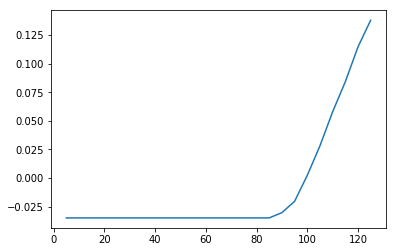

In [283]:
ypMin = 400.; ypMax = 600.; posFactor = 30. 
modAmpArr = np.arange(5., 126., 5.)
growthRateArr = np.zeros(modAmpArr.size)
for ind in range(modAmpArr.size):
    modAmp = modAmpArr[ind]
    print("Amplitude is ", modAmp)
    genFun = lambda var: Uconstr1Fun(switchLoc = var,
                                ypMin=ypMin, ypMax=ypMax, modAmp=modAmp, posFactor=posFactor)
    optSwitchLoc = miscUtil.binarySearch(genFun, 0., 1., nSteps = 20, tol = 0.01)
    print("Switch location to impose contraint 1 is", optSwitchLoc)
    print("Error in contraint 1 is", Uconstr1Fun(switchLoc=optSwitchLoc))
    growthRateArr[ind] = Uconstr2Fun(switchLoc=optSwitchLoc,
        ypMin=ypMin, ypMax=ypMax, modAmp = modAmp, posFactor=posFactor)

plt.plot(modAmpArr, growthRateArr)
plt.show()
    

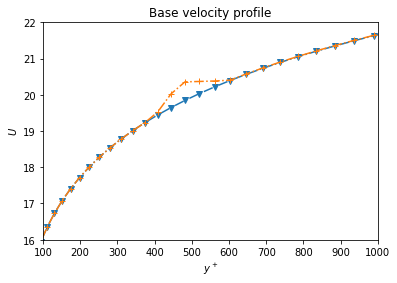

/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 2.5 6.666666666666667 10000.0
Largest growth rate for U0 is -0.0347
a, b, Re: 2.5 6.666666666666667 10000.0
Largest growth rate for U1 is -0.00702


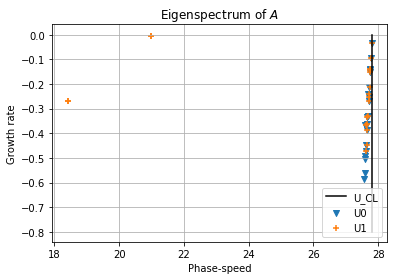

In [285]:
Uopt12 = Utmp(ypMin,ypMax, modAmp =optModAmp, posFactor=posFactor, switchLoc=optSwitchLoc)
plotBase(U0,Uopt12)
plotEvals(U0,Uopt12)

## Marginally stable modifications
### For the top-hat eddy viscosity mod, for given ypMin, ypMax, posFactor

In [424]:
pfArr = np.array([0.05, 1., 10., 25., 50., 100.])
optAmpArr = np.zeros(pfArr.size)
optLocArr = np.zeros(pfArr.size)
for ind in range(pfArr.size):
    posFactor = pfArr[ind]
    print("posFactor=",posFactor)
    optAmp, optLoc = marginalWave(ypMin=400.,ypMax=600., posFactor=posFactor, nSteps=10)
    optAmpArr[ind] = optAmp
    optLocArr[ind] = optLoc
    print("Optimal amplitude and switch location are", optAmp, optLoc)


posFactor= 0.05
tolerance 0.01 met at minVar=0. Returning...


/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 2.5 6.666666666666667 10000.0


/home/svadarevu/linenv/lib/python3.5/site-packages/ipykernel/__main__.py:53: RuntimeWarning: divide by zero encountered in double_scalars


KeyboardInterrupt: 

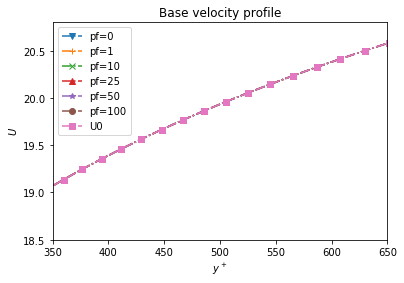

In [392]:
Ulabels = ['pf=%d'%pf for pf in pfArr]
Uprofiles=[Utmp(400.,600.,
                modAmp=optAmpArr[ind], posFactor=pfArr[ind], switchLoc=optLocArr[ind]) for ind in np.arange(pfArr.size) ]
Uprofiles.append(U0)
Ulabels.append('U0')
plotBase(*Uprofiles,Ulabels=Ulabels, ypLim=[350.,650.], Ulim=[18.5,20.8])


In [ ]:
plotEvals(*Uprofiles,Ulabels=Ulabels)

Same as before, but
### For the sinusoidal eddy viscosity mod, for given ypMin, ypMax, posFactor

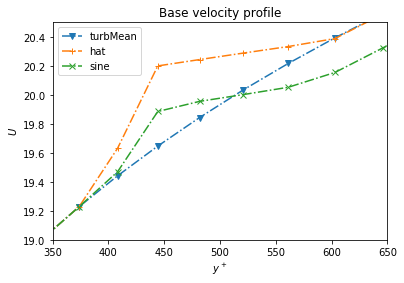

In [314]:
# First, seeing if there's any significant difference between the two:
Usine = Utmp(400., 600., posFactor= 5., switchLoc=0.15235, modAmp=127.124, sine=True)
Uhat  = Utmp(400., 600., posFactor= 5., switchLoc=0.15235, modAmp=127.124, sine=False)

plotBase(U0,Uhat,Usine,Ulabels=['turbMean','hat','sine'], ypLim=[350.,650.], Ulim=[19., 20.5])

In [336]:
pfArr = 10.**np.arange(-3, 4,1)
optAmpArr = np.zeros(pfArr.size)
optLocArr = np.zeros(pfArr.size)
for ind in range(pfArr.size):
    posFactor = pfArr[ind]
    print("posFactor=",posFactor)
    try:
        optAmp, optLoc = marginalWave(ypMin=100.,ypMax=500., ampMax=1000.,posFactor=posFactor, nSteps=13,sine=True)
    except:
        optAmp = 0.; optLoc = 0.
    optAmpArr[ind] = optAmp
    optLocArr[ind] = optLoc
    print("Optimal amplitude and switch location are", optAmp, optLoc)


posFactor= 0.001
tolerance 0.01 met at minVar=0. Returning...


/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 2.5 6.666666666666667 10000.0


/home/svadarevu/linenv/lib/python3.5/site-packages/scipy/integrate/quadpack.py:356: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  warnings.warn(msg, IntegrationWarning)


Optimal amplitude and switch location are 0.0 0.0
posFactor= 0.01
tolerance 0.01 met at minVar=0. Returning...
a, b, Re: 2.5 6.666666666666667 10000.0
Optimal amplitude and switch location are 0.0 0.0
posFactor= 0.1
tolerance 0.01 met at minVar=0. Returning...
a, b, Re: 2.5 6.666666666666667 10000.0
Optimal amplitude and switch location are 0.0 0.0
posFactor= 1.0
a, b, Re: 2.5 6.666666666666667 10000.0
Optimal amplitude and switch location are 0.0 0.0
posFactor= 10.0
a, b, Re: 2.5 6.666666666666667 10000.0
Optimal amplitude and switch location are 0.0 0.0
posFactor= 100.0
a, b, Re: 2.5 6.666666666666667 10000.0
Optimal amplitude and switch location are 0.0 0.0
posFactor= 1000.0
a, b, Re: 2.5 6.666666666666667 10000.0
Optimal amplitude and switch location are 0.0 0.0


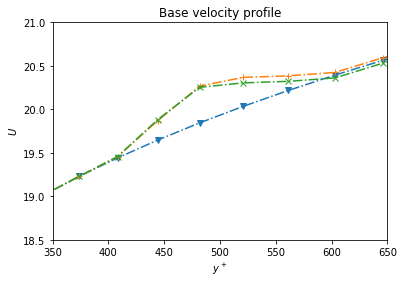

In [342]:
U1 = Utmp(400.,600.,100., switchLoc=0.47,sine=True)
U2 = Utmp(400.,600.,100., switchLoc=0.43,sine=True)
plotBase(U0,U1,U2, ypLim=[350., 650.], Ulim = [18.5,21.])

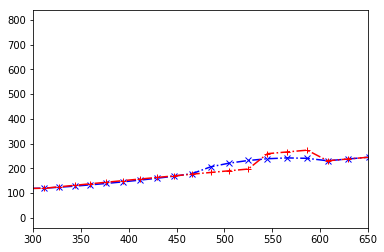

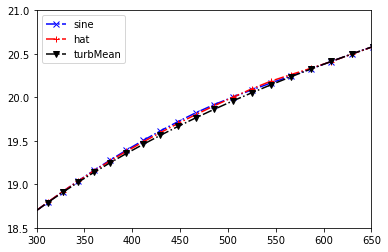

Uconstr1 for sine and hat mods is -0.000335602365478 -0.00152265752293


In [419]:
ypMin = 300.; ypMax= 600.; modAmp = 5.
ph = 10.; ps = 3.; sLocs=0.57; sLoch=0.8;
nuSine = lambda xi: nuEbase(xi) +  nuDiffSine(xi, ypMin,ypMax,2.*modAmp, posFactor= ps, switchLoc=sLocs)
nuHat  = lambda xi: nuEbase(xi)+ nuDiffHat(xi, ypMin,ypMax,modAmp, posFactor=ph, switchLoc=sLoch)

sineProfile = np.array([nuSine(yVal) for yVal in list(y)])
hatProfile = np.array([nuHat(yVal) for yVal in list(y)])

plt.plot(yp, sineProfile, 'bx-.')
plt.plot(yp, hatProfile, 'r+-.')
plt.xlim([300., 650.])
plt.show()

Us = Utmp(ypMin, ypMax, 2.*modAmp, posFactor=ps, sine=True, switchLoc=sLocs)
Uh = Utmp(ypMin, ypMax, modAmp, posFactor=ph, sine=False, switchLoc=sLoch)
plt.plot(yp, Us, 'bx-.')
plt.plot(yp, Uh, 'r+-.')
plt.plot(yp, U0, 'kv-.')
plt.xlim([300., 650.])
plt.ylim([18.5, 21.])
#plt.autoscale()
plt.legend(['sine','hat','turbMean'])
plt.show()

print("Uconstr1 for sine and hat mods is", 
     Uconstr1Fun(ypMin=ypMin, ypMax=ypMax, modAmp = 2.*modAmp, posFactor=ps, switchLoc=sLocs, sine=True),
     Uconstr1Fun(ypMin=ypMin, ypMax=ypMax, modAmp = modAmp, posFactor=ph, switchLoc=sLoch))

/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 2.5 6.666666666666667 10000.0
Largest growth rate for sine is -0.0347
a, b, Re: 2.5 6.666666666666667 10000.0
Largest growth rate for hat is -0.0347
a, b, Re: 2.5 6.666666666666667 10000.0
Largest growth rate for turb is -0.0347


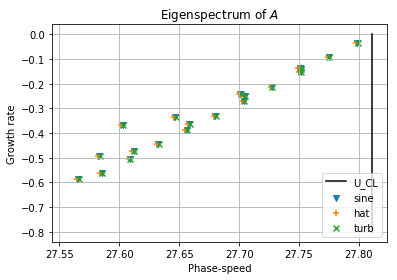

In [420]:
plotEvals(Us,Uh,U0,Ulabels=['sine','hat','turb'],Evals=40)

In [433]:
optAmp,optLoc = marginalWave(300., 600., posFactor= 10., ampMax=500., nSteps=30,sine=False)

tolerance 0.01 met at minVar=0. Returning...


/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 2.5 6.666666666666667 10000.0


AssertionError: 

# Verifying weight matrices

I'll use $(u,v,w) = (1-y^{10}, 1-y^{10}, 1-y^{10})$ and see if the weight matrices give the right energy.

$$ 0.5 \int\limits_{y=-1}^{1} (|u|^2 + |v|^2 + |w|^2 )dy  $$
$$=1.5 \int\limits_{y=-1}^{1} (1+y^{20} - 2y^{10}) dy$$
$$= 1.5\bigg[ y + y^{21}/21 - 2y^{11}/11 \bigg]_{-1}^{1} = (3/2)(2+2/21-4/11) =  2.5974$$

In [87]:
N = 12
weightDict = pseudo.weightMats(N)
W3s = weightDict['W3Sqrt']
W3si = weightDict['W3SqrtInv']
y = pseudo.chebdif(N,1)[0]
u3 = np.concatenate((1.-y**10, 1.-y**10, 1.-y**10))
u3w = W3s @ u3

print("Norm of the 1-y^2 field is",u3w @ u3w, )
print("Norm of difference:", pseudo.chebnorm(u3 - W3si@u3w,N) )

Norm of the 1-y^2 field is 2.59738210347
Norm of difference: 8.57806066843e-17


Looks alright. 

# Spectrum of modified A from CC

The primary justification for using the colored-in-time forcing is to ensure that $AX + XA^*$ (for $X$ from DNS) becomes negative semi-definite. So, the low rank modification, $BC_f$ to $A$ makes $A_fX+XA_f^*$ negative semi-definite. 

That's the first thing I need to verify. 

The second thing on the list is to see if the spectrum of this modified matrix can be accounted for by the homogenization of the velocity profile. If yes, then we have something to go by. 

In [2]:
matDict = loadmat('data_figure9_jfm17.mat') # Data set from Zare
Nm = matDict['N'].flatten()[0]
Am = matDict['A']; Cm = matDict['L']
Xm = matDict['X']; Zm = matDict['Z']
Bm, Hm, Sm = ops.decomposeZ(Zm)
Xminv = np.linalg.solve(Xm, np.identity(2*Nm, dtype=np.complex))

Cfm = (Hm.conj().T - 0.5* Bm.conj().T) @ Xminv
Afm = Am + Bm @ Cfm

/home/svadarevu/linenv/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


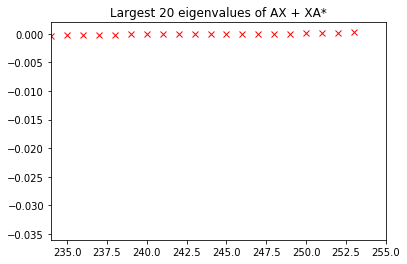

Largest eigenvalue is  (0.000289281105637+5.22837003079e-20j)
Error in AX + XA*+BB* is 0.00354052360423


In [35]:
# Spectrum of AX + XA*
evals = np.linalg.eigvals( Afm @ Xm + Xm @ Afm.conj().T)
evals = np.sort(evals)
plt.plot(evals, 'rx')
plt.title("Largest 20 eigenvalues of AX + XA*")
plt.xlim([234,255])
plt.show()
print("Largest eigenvalue is ", evals[-1])

errMat = Afm @ Xm + Xm @ Afm.conj().T + Bm @ Bm.conj().T
print("Error in AX + XA*+BB* is", np.linalg.norm(errMat,ord='fro'))

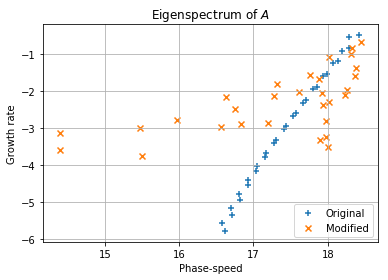

In [4]:
# Spectrum of A 
nEvals = 30
evals = np.linalg.eigvals(Am);  sortInd = np.argsort(evals.real)
evalsRe = evals[sortInd].real; evalsIm = evals[sortInd].imag
plt.scatter(-evalsIm[-nEvals:]/2.5, evalsRe[-nEvals:],marker='+',label='Original')

evals = np.linalg.eigvals(Afm);  sortInd = np.argsort(evals.real)
evalsRe = evals[sortInd].real; evalsIm = evals[sortInd].imag
plt.scatter(-evalsIm[-nEvals:]/2.5, evalsRe[-nEvals:],marker='x',label='Modified')


plt.grid('on')
plt.title("Eigenspectrum of $A$")
plt.xlabel("Phase-speed")
plt.ylabel("Growth rate")
#plt.plot(np.max(U0)*np.ones(10), np.linspace(-0.8, 0., 10), 'k-', label='U_CL')
plt.legend(loc=4)
plt.show()

Using parameters Re=186, alfa=46.5, kapa=0.61, N=127


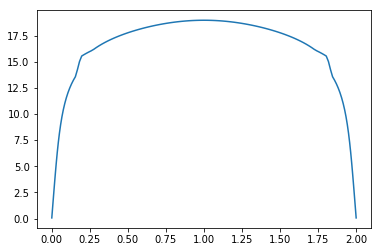

In [48]:
alfa = 46.5
kapa = 0.61
Re = 186.; N = 127; 
y = 1.-pseudo.chebdif(N,1)[0]; yp = Re*y
posFactor0 = 2.

def nuDiffSine(yScal, ypMin, ypMax, sineAmp,
              posFactor=posFactor0, switchLoc=0.5):
    ypScal = Re*yScal
    negFactor = -1.
    ypSwitch = ypMin+switchLoc*(ypMax-ypMin)
    if ypMin <= ypScal <= ypSwitch:
        phase = np.pi*(ypScal - ypMin)/(ypSwitch-ypMin)
        nuAdd = negFactor* sineAmp* np.sqrt(np.sin(phase))
        
    elif ypSwitch< ypScal < ypMax:
        phase = np.pi*(ypScal - ypSwitch)/(ypMax-ypSwitch)
        nuAdd = posFactor* sineAmp* np.sqrt(np.sin(phase))
        
    else: nuAdd = 0.
    return np.real(nuAdd)

def nuDiffHat(yScal, ypMin, ypMax, hatAmp,
              posFactor=posFactor0, switchLoc=0.5):
    ypScal = Re*yScal
    negFactor = -1.
    ypSwitch = ypMin+switchLoc*(ypMax-ypMin)
    if ypMin <= ypScal <= ypSwitch:
        nuAdd = negFactor* hatAmp
    elif ypSwitch< ypScal < ypMax:
        nuAdd =  posFactor* hatAmp
    else: nuAdd = 0.
    return nuAdd


print("Using parameters Re=%.4g, alfa=%.4g, kapa=%.4g, N=%d"%(Re,alfa,kapa,N))
# The basic eddy viscosity equation
nuEbase = lambda zt: -0.5 + 0.5*np.sqrt( 1.+
            (kapa*Re/3.* (2.*zt - zt**2) * (3. - 4.*zt + 2.*zt**2) *
                         (1. - np.exp( (np.abs(zt-1.)-1.)*Re/alfa )   )    )**2)


def Utmp(ypMin,ypMax, modAmp,**kwargs):
    nuDiffLoc = lambda xi: nuDiffHat(xi, ypMin,ypMax,modAmp,**kwargs)
    nuE = lambda xi: nuEbase(xi) + nuDiffLoc(xi)

    intFun = lambda xi: Re * (1.-xi)/(1. + nuE(xi))
    U = np.zeros(N)
    U[0] = quad( intFun, 0., y[0])[0]
    for ind in range(1,np.int(np.ceil(N/2))):
        U[ind] = U[ind-1] + quad( intFun, y[ind-1], y[ind], limit=100)[0]
    U[-(N//2):] = U[:N//2][::-1] 
    
    return U

U3 = Utmp(30.,50., modAmp =5., posFactor=1.5, switchLoc=0.3)
plt.plot(y, U3)

Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Initialized instance of 'linearize', version 8.1.1.
New in this version: Eddy viscosity fixed
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Initialized instance of 'linearize', version 8.1.1.
New in this version: Eddy viscosity fixed
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Initialized instance of 'linearize', version 8.1.1.
New in this version: Eddy viscosity fixed
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Initialized instan

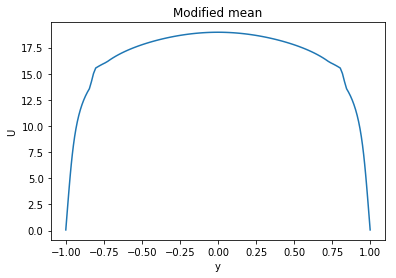

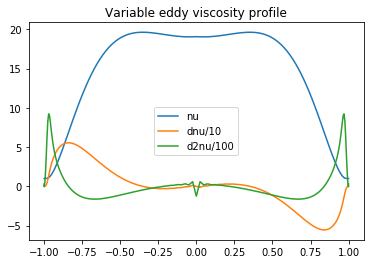

/home/svadarevu/gitwork/linear/library/ops.py:190: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:230: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 2.5 7.0 186.0
a, b, Re: 2.5 7.0 186.0
a, b, Re: 2.5 7.0 186.0
a, b, Re: 2.5 7.0 186.0


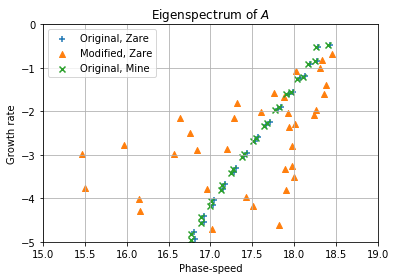

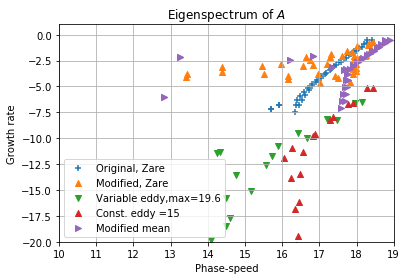

0.03304461401090731

In [51]:
# Compare the above spectrum (for original) with eigenspectrum 
# from my system matrices with and without eddy viscosity.
N= 127; Re = 186.; a=2.5; b=7.
statInst0 = ops.statComp(N=N,Re=Re,a=a,b=b, covMat=np.identity(3*N))
statInst0.U = (18.25/18.)* statInst0.U;
statInst0.dU = (18.25/18.)* statInst0.dU;
statInst0.d2U = (18.25/18.)* statInst0.d2U;
statInst0.nu = np.ones(N)

yWalled,DMwalled = pseudo.chebdif(N,2,walls=True)
statInst1 = ops.statComp(N=N,Re=Re,a=a,b=b, covMat=np.identity(3*N))
statInst1.U = (18.25/18.)* statInst1.U;
statInst1.dU = (18.25/18.)* statInst1.dU;
statInst1.d2U = (18.25/18.)* statInst1.d2U;
turbDict = ops.turbMeanChannel(N=N,Re=Re,walls=True)
statInst1.nu = turbDict['nu'][1:-1]
statInst1.dnu = (DMwalled[:,:,0] @ turbDict['nu'])[1:-1]
statInst1.d2nu = (DMwalled[:,:,1] @ turbDict['nu'])[1:-1]


statInst2 = ops.statComp(N=N,Re=Re,a=a,b=b, covMat=np.identity(3*N))
statInst2.U = (18.25/18.)* statInst0.U;
statInst2.dU = (18.25/18.)* statInst0.dU;
statInst2.d2U = (18.25/18.)* statInst0.d2U;
statInst2.nu =  (statInst1.w @ statInst1.nu) * np.ones(N)

U3 = Utmp(30.,50., modAmp =5., posFactor=1.5, switchLoc=0.3)
statInst3 = ops.statComp(N=N,Re=Re,a=a,b=b, covMat=np.identity(3*N))
statInst3.U = U3;
statInst3.dU = statInst3.D1 @ U3;
statInst3.d2U = statInst3.D2 @ U3;
statInst3.nu =  np.ones(N)

plt.figure()
plt.plot(statInst3.y, statInst3.U)
plt.title("Modified mean")
plt.xlabel("y"); plt.ylabel("U")
plt.show()


plt.figure()
plt.plot(statInst1.y, statInst1.nu)
plt.plot(statInst1.y, statInst1.dnu/10.)
plt.plot(statInst1.y, statInst1.d2nu/100.)
plt.legend(['nu','dnu/10','d2nu/100'])
plt.title("Variable eddy viscosity profile")
plt.show()

A0, C0, B0 = statInst0.makeSystemNew()
A1, C1, B1 = statInst1.makeSystemNew()
A2, C2, B2 = statInst2.makeSystemNew()
A3, C3, B3 = statInst3.makeSystemNew()

nEvals = 40
evals = np.linalg.eigvals(Am);  sortInd = np.argsort(evals.real)
evalsRem = evals[sortInd].real; evalsImm = evals[sortInd].imag

evals = np.linalg.eigvals(Afm);  sortInd = np.argsort(evals.real)
evalsRef = evals[sortInd].real; evalsImf = evals[sortInd].imag



evals = np.linalg.eigvals(A0);  sortInd = np.argsort(evals.real)
evalsRe0 = evals[sortInd].real; evalsIm0 = evals[sortInd].imag

evals = np.linalg.eigvals(A1);  sortInd = np.argsort(evals.real)
evalsRe1 = evals[sortInd].real; evalsIm1 = evals[sortInd].imag

evals = np.linalg.eigvals(A2);  sortInd = np.argsort(evals.real)
evalsRe2 = evals[sortInd].real; evalsIm2 = evals[sortInd].imag

evals = np.linalg.eigvals(A3);  sortInd = np.argsort(evals.real)
evalsRe3 = evals[sortInd].real; evalsIm3 = evals[sortInd].imag

plt.figure()
plt.scatter(-evalsImm[-nEvals:]/2.5, evalsRem[-nEvals:],marker='+',label='Original, Zare')
plt.scatter(-evalsImf[-nEvals:]/2.5, evalsRef[-nEvals:],marker='^',label='Modified, Zare')
plt.scatter(-evalsIm0[-nEvals:]/2.5, evalsRe0[-nEvals:],marker='x',label='Original, Mine')
plt.grid('on')
plt.title("Eigenspectrum of $A$")
plt.xlabel("Phase-speed")
plt.ylabel("Growth rate")
plt.ylim([-5.,0.]); plt.xlim([15., 19.])
#plt.plot(np.max(U0)*np.ones(10), np.linspace(-0.8, 0., 10), 'k-', label='U_CL')
plt.legend(loc=2)
plt.show()



plt.figure()
plt.scatter(-evalsImm[-nEvals:]/2.5, evalsRem[-nEvals:],marker='+',label='Original, Zare')
plt.scatter(-evalsImf[-nEvals:]/2.5, evalsRef[-nEvals:],marker='^',label='Modified, Zare')
plt.scatter(-evalsIm1[-nEvals:]/2.5, evalsRe1[-nEvals:],marker='v',
            label='Variable eddy,max=%.3g'%(np.max(statInst1.nu)))
plt.scatter(-evalsIm2[-nEvals:]/2.5, evalsRe2[-nEvals:],marker='^',
            label='Const. eddy =%.3g'%(statInst2.nu[0]))
plt.scatter(-evalsIm3[-nEvals:]/2.5, evalsRe3[-nEvals:],marker='>',
            label='Modified mean')
plt.grid('on')
plt.title("Eigenspectrum of $A$")
plt.xlabel("Phase-speed")
plt.ylabel("Growth rate")
plt.ylim([-20.,1.]); plt.xlim([10., 19.])
#plt.plot(np.max(U0)*np.ones(10), np.linspace(-0.8, 0., 10), 'k-', label='U_CL')
plt.legend(loc=3)
plt.show()


np.linalg.norm(A0-A1,ord='fro')/np.linalg.norm(A0,ord='fro')

Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Initialized instance of 'linearize', version 8.1.1.
New in this version: Eddy viscosity fixed
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Initialized instance of 'linearize', version 8.1.1.
New in this version: Eddy viscosity fixed
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Initialized instance of 'linearize', version 8.1.1.
New in this version: Eddy viscosity fixed
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Initialized instance of 'linearize', version 8.1.1.
New in this version

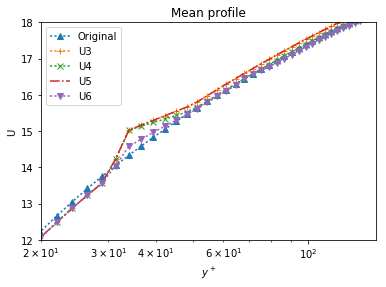

/home/svadarevu/gitwork/linear/library/ops.py:190: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:230: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 2.5 7.0 186.0
a, b, Re: 2.5 7.0 186.0
a, b, Re: 2.5 7.0 186.0
a, b, Re: 2.5 7.0 186.0


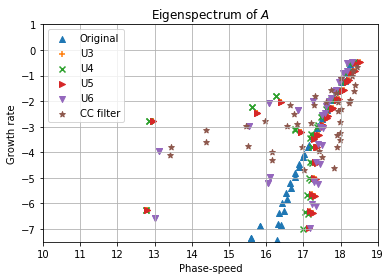

In [73]:
# Compare the above spectrum (for original) with eigenspectrum 
# from my system matrices with and without eddy viscosity.
N= 127; Re = 186.; a=2.5; b=7.

U3 = Utmp(30.,50., modAmp =5., posFactor=1.5, switchLoc=0.2)
statInst3 = ops.statComp(N=N,Re=Re,a=a,b=b, covMat=np.identity(3*N))
statInst3.U = U3;
statInst3.dU = statInst3.D1 @ U3;
statInst3.d2U = statInst3.D2 @ U3;
statInst3.nu =  np.ones(N)

U4 = Utmp(30.,50., modAmp =5., posFactor=2.5, switchLoc=0.2)
statInst4 = ops.statComp(N=N,Re=Re,a=a,b=b, covMat=np.identity(3*N))
statInst4.U = U4;
statInst4.dU = statInst4.D1 @ U4;
statInst4.d2U = statInst4.D2 @ U4;
statInst4.nu =  np.ones(N)


U5 = Utmp(30.,50., modAmp =5., posFactor=1.5, switchLoc=0.2)
statInst5 = ops.statComp(N=N,Re=Re,a=a,b=b, covMat=np.identity(3*N))
statInst5.U = U5;
statInst5.dU = statInst5.D1 @ U5;
statInst5.d2U = statInst5.D2 @ U5;
statInst5.nu =  np.ones(N)


U61 = Utmp(30.,50., modAmp =5., posFactor=1.5, switchLoc=0.2)
U62 = Utmp(65.,80., modAmp =8., posFactor=1.5, switchLoc=0.2)
U6 = 0.5*(U61+U62)
statInst6 = ops.statComp(N=N,Re=Re,a=a,b=b, covMat=np.identity(3*N))
statInst6.U = U6;
statInst6.dU = statInst5.D1 @ U6;
statInst6.d2U = statInst5.D2 @ U6;
statInst6.nu =  np.ones(N)


plt.figure()
plt.plot(yp, statInst0.U, ':^')
plt.plot(yp, statInst3.U, ':+')
plt.plot(yp, statInst4.U, ':x')
plt.plot(yp, statInst5.U, '-.')
plt.plot(yp, statInst6.U, ':v')
plt.title("Mean profile")
plt.legend(['Original','U3','U4','U5', 'U6'])
plt.xlabel("$y^+$"); plt.ylabel("U")
plt.xlim([20., 150.])
plt.ylim([12., 18.])
plt.xscale("log")
plt.show()


A3, C3, B3 = statInst3.makeSystemNew()
A4, C4, B4 = statInst4.makeSystemNew()
A5, C5, B5 = statInst5.makeSystemNew()
A6, C6, B6 = statInst6.makeSystemNew()


nEvals = 40
evals = np.linalg.eigvals(A3);  sortInd = np.argsort(evals.real)
evalsRe3 = evals[sortInd].real; evalsIm3 = evals[sortInd].imag

evals = np.linalg.eigvals(A4);  sortInd = np.argsort(evals.real)
evalsRe4 = evals[sortInd].real; evalsIm4 = evals[sortInd].imag

evals = np.linalg.eigvals(A5);  sortInd = np.argsort(evals.real)
evalsRe5 = evals[sortInd].real; evalsIm5 = evals[sortInd].imag

evals = np.linalg.eigvals(A6);  sortInd = np.argsort(evals.real)
evalsRe6 = evals[sortInd].real; evalsIm6 = evals[sortInd].imag

plt.figure()
plt.scatter(-evalsIm0[-nEvals:]/2.5, evalsRe0[-nEvals:],marker='^',
            label='Original')
plt.scatter(-evalsIm3[-nEvals:]/2.5, evalsRe3[-nEvals:],marker='+',
            label='U3')
plt.scatter(-evalsIm4[-nEvals:]/2.5, evalsRe4[-nEvals:],marker='x',
            label='U4')
plt.scatter(-evalsIm5[-nEvals:]/2.5, evalsRe5[-nEvals:],marker='>',
            label='U5')
plt.scatter(-evalsIm6[-nEvals:]/2.5, evalsRe6[-nEvals:],marker='v',
            label='U6')
plt.scatter(-evalsImf[-nEvals:]/2.5, evalsRef[-nEvals:],marker='*',
            label='CC filter')
plt.grid('on')
plt.title("Eigenspectrum of $A$")
plt.xlabel("Phase-speed")
plt.ylabel("Growth rate")
plt.ylim([-7.5,1.0]); plt.xlim([10., 19.])
#plt.plot(np.max(U0)*np.ones(10), np.linspace(-0.8, 0., 10), 'k-', label='U_CL')
plt.legend(loc=2)
plt.show()




Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Initialized instance of 'linearize', version 8.1.1.
New in this version: Eddy viscosity fixed
covMat was not supplied. Loading matrix from /mnt/kepler/sabarish/data/R186/covN127/covR186N127l10m10.npy ...
covMat from DNS data has y as spanwise. Reordering to have y as wall-normal......
Reordering complete... Remember to verify the ordering.
Remember that the covariance matrix is defined on clencurt-weighted velocity fields.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Initialized instance of 'linearize', version 8.1.1.
New in this version: Eddy viscosity fixed
covMat was not supplied. Loading matrix from /mnt/kepler/sabarish/data/R186/covN127/covR186N127l10m10.npy ...
covMat from DNS data has y as spanwise. Reordering to have y as wall-normal......
Reordering complete... Remember to v

/home/svadarevu/gitwork/linear/library/ops.py:190: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:230: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 2.5 6.666666666666667 186.0
a, b, Re: 2.5 6.666666666666667 186.0
a, b, Re: 2.5 6.666666666666667 186.0


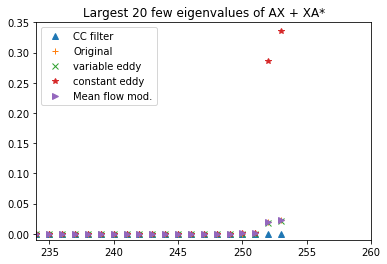

Largest eigenvalues are  0.0228682988854 0.0219260328778 0.336514046061


In [56]:
N= 127; Re = 186.; a=2.5; b=20./3.
statInst0 = ops.statComp(N=N,Re=Re,a=a,b=b)
statInst0.U = (18.25/18.)* statInst0.U;
statInst0.dU = (18.25/18.)* statInst0.dU;
statInst0.d2U = (18.25/18.)* statInst0.d2U;
statInst0.nu = np.ones(N)

yWalled,DMwalled = pseudo.chebdif(N,2,walls=True)
statInst1 = ops.statComp(N=N,Re=Re,a=a,b=b)
statInst1.U = (18.25/18.)* statInst1.U;
statInst1.dU = (18.25/18.)* statInst1.dU;
statInst1.d2U = (18.25/18.)* statInst1.d2U;
turbDict = ops.turbMeanChannel(N=N,Re=Re,walls=True)
statInst1.nu = turbDict['nu'][1:-1]
statInst1.dnu = (DMwalled[:,:,0] @ turbDict['nu'])[1:-1]
statInst1.d2nu = (DMwalled[:,:,1] @ turbDict['nu'])[1:-1]


statInst2 = ops.statComp(N=N,Re=Re,a=a,b=b)
statInst2.U = (18.25/18.)* statInst0.U;
statInst2.dU = (18.25/18.)* statInst0.dU;
statInst2.d2U = (18.25/18.)* statInst0.d2U;
statInst2.nu =  (statInst1.w @ statInst1.nu) * np.ones(N)
statInst2.dnu =  np.zeros(N)
statInst2.d2nu =  np.zeros(N)

U3 = Utmp(30.,50., modAmp =5., posFactor=1.5, switchLoc=0.3)
statInst3 = ops.statComp(N=N,Re=Re,a=a,b=b, covMat=np.identity(3*N))
statInst3.U = U3;
statInst3.dU = statInst3.D1 @ U3;
statInst3.d2U = statInst3.D2 @ U3;
statInst3.nu =  np.ones(N)


A0, C0, B0 = statInst0.makeSystemNew()
A1, C1, B1 = statInst1.makeSystemNew()
A2, C2, B2 = statInst2.makeSystemNew()
A3, C3, B3 = statInst3.makeSystemNew()

Phi = statInst0.covMat
X = B0 @ Phi @ C0
X = 0.5*(X + X.conj().T)

evalsm = np.sort(np.linalg.eigvals( Afm@Xm + Xm@Afm.conj().T).real)
evals0 = np.sort(np.linalg.eigvals( A0 @ X + X @ A0.conj().T).real)
evals1 = np.sort(np.linalg.eigvals( A1 @ X + X @ A1.conj().T).real)
evals2 = np.sort(np.linalg.eigvals( A2 @ X + X @ A2.conj().T).real)
evals3 = np.sort(np.linalg.eigvals( A3 @ X + X @ A3.conj().T).real)
plt.plot(evalsm, '^', label='CC filter')
plt.plot(evals0, '+', label='Original')
plt.plot(evals1, 'x', label='variable eddy')
plt.plot(evals2, '*', label='constant eddy')
plt.plot(evals3, '>', label='Mean flow mod.')
plt.title("Largest 20 few eigenvalues of AX + XA*")
plt.legend()
plt.xlim([234,260])
plt.ylim([-0.01,0.35])
plt.show()
print("Largest eigenvalues are ", evals0[-1], evals1[-1], evals2[-1])




If I zoom in, or ignore the eddy viscosity plot, I'll see that the spectral for the unmodified dynamics matrices from my and Zare's formulations agree quite well. 

The modified matrices, either from CC or eddy viscosity, act to kick low velocity structures to be less stable. Eddy viscosity enhancement does this rather drastically, by significantly reducing the growth rate for all modes, while the CC modification is more gentle. 

This change to eigenvalues from either modifications can be interpreted to be thickening the critical layer-ish thing where maximal amplifications are seen. 


Next, I look at three things:
1) Singular values of A, Af, and Aeddy
2) Eigenmodes of A, Af, and Aeddy: I expect the eigenmodes to not be significantly changed: they must maintain the critical-layer-like behaviour.
3) Change in the spectrum as I change the mean velocity profile using just the Cess profile. As I make the core region 'flatter', I expect the spectrum to become less stable. 


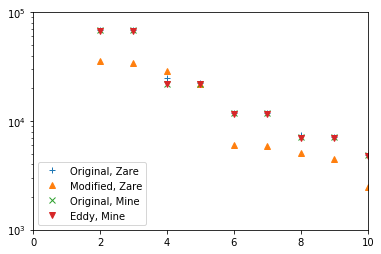

In [45]:
# Naming's a bit messed up. Am is Zare's original, Afm is Zare's filtered
# A0 is my original, A1 is my eddy viscosity enhanced
U,S,V = np.linalg.svd(A0); Uz,Sz,Vz = np.linalg.svd(Am)
Uf,Sf,Vf = np.linalg.svd(Afm); Ue,Se,Ve = np.linalg.svd(A1)


plt.figure()
plt.plot(Sz,'+', label='Original, Zare')
plt.plot(Sf,'^', label='Modified, Zare')
plt.plot(S,'x',  label='Original, Mine')
plt.plot(Se,'v', label='Eddy, Mine')
plt.yscale("log")
plt.xlim([0,10])
plt.ylim([1.e3,1.e5])
plt.legend()
plt.show()


This makes no sense. It gives neither the response to stochastic forcing nor the response to harmonic forcing. Maybe it has other interpretations; I'll return to this later. 

# Spectrum of Aeddy for different $\beta$ at $\alpha=2.5$

Using parameters Re=186, alfa=46.5, kapa=0.61, N=127
Initialized instance of 'linearize', version 8.1.1.
New in this version: Eddy viscosity fixed
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
Using parameters Re=186, alfa=46.5, kapa=0.61, N=127


/home/svadarevu/gitwork/linear/library/ops.py:190: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:230: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


a, b, Re: 2.5 7.0 186.0
a, b, Re: 2.5 1.0 186.0
a, b, Re: 2.5 0.1 186.0


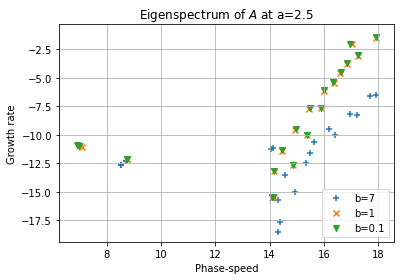

a, b, Re: 1.0 7.0 186.0
a, b, Re: 1.0 1.0 186.0
a, b, Re: 1.0 0.1 186.0


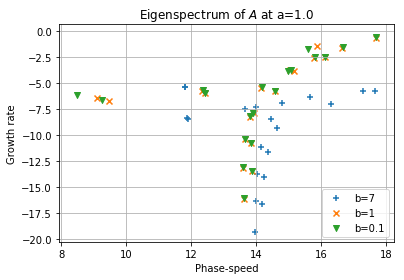

In [54]:
N= 127; Re = 186.; a=2.5; b=7.
statInst1 = ops.statComp(N=N,Re=Re,a=a,b=b, covMat=np.identity(3*N))
statInst1.U = statInst1.U;
statInst1.dU = statInst1.dU;
statInst1.d2U = statInst1.d2U;
statInst1.nu = ops.turbMeanChannel(N=N,Re=Re)['nu']

nEvals = 20

A1, C1, Qs1 = statInst1.makeSystemNew()
evals = np.linalg.eigvals(A1);  sortInd = np.argsort(evals.real)
evalsRe = evals[sortInd].real; evalsIm = evals[sortInd].imag
plt.scatter(-evalsIm[-nEvals:]/2.5, evalsRe[-nEvals:],marker='+',label='b=7')

statInst1.b= 1.
A1, C1, Qs1 = statInst1.makeSystemNew()
evals = np.linalg.eigvals(A1);  sortInd = np.argsort(evals.real)
evalsRe = evals[sortInd].real; evalsIm = evals[sortInd].imag
plt.scatter(-evalsIm[-nEvals:]/2.5, evalsRe[-nEvals:],marker='x',label='b=1')


statInst1.b= 0.1
A1, C1, Qs1 = statInst1.makeSystemNew()
evals = np.linalg.eigvals(A1);  sortInd = np.argsort(evals.real)
evalsRe = evals[sortInd].real; evalsIm = evals[sortInd].imag
plt.scatter(-evalsIm[-nEvals:]/2.5, evalsRe[-nEvals:],marker='v',label='b=0.1')

plt.grid('on')
plt.title("Eigenspectrum of $A$ at a=2.5")
plt.xlabel("Phase-speed")
plt.ylabel("Growth rate")
#plt.plot(np.max(U0)*np.ones(10), np.linspace(-0.8, 0., 10), 'k-', label='U_CL')
plt.legend(loc=4)
plt.show()





statInst1.a = 1.0
statInst1.b = 7.
A1, C1, Qs1 = statInst1.makeSystemNew()
evals = np.linalg.eigvals(A1);  sortInd = np.argsort(evals.real)
evalsRe = evals[sortInd].real; evalsIm = evals[sortInd].imag
plt.scatter(-evalsIm[-nEvals:]/1., evalsRe[-nEvals:],marker='+',label='b=7')

statInst1.b= 1.
A1, C1, Qs1 = statInst1.makeSystemNew()
evals = np.linalg.eigvals(A1);  sortInd = np.argsort(evals.real)
evalsRe = evals[sortInd].real; evalsIm = evals[sortInd].imag
plt.scatter(-evalsIm[-nEvals:]/1., evalsRe[-nEvals:],marker='x',label='b=1')


statInst1.b= 0.1
A1, C1, Qs1 = statInst1.makeSystemNew()
evals = np.linalg.eigvals(A1);  sortInd = np.argsort(evals.real)
evalsRe = evals[sortInd].real; evalsIm = evals[sortInd].imag
plt.scatter(-evalsIm[-nEvals:]/1., evalsRe[-nEvals:],marker='v',label='b=0.1')

plt.grid('on')
plt.title("Eigenspectrum of $A$ at a=1.0")
plt.xlabel("Phase-speed")
plt.ylabel("Growth rate")
#plt.plot(np.max(U0)*np.ones(10), np.linspace(-0.8, 0., 10), 'k-', label='U_CL')
plt.legend(loc=4)
plt.show()




# Eigenspectrum of turbulent mean

The eigenvalue spectrum for Poiseuille flow has a 'Y' shape. The eigenvalues at the intersection are sensitive to perturbations to the dynamics matrix, because the eigenmodes corresponding to these eigenvalues are very non-normal. 



I can understand this in terms of having different modes with similar phase-speeds, i.e., similar wall-normal profiles, having similar growth rates. Perturbations to the mean velocity, say in terms of homogenization, at the critical layers corresponding to these eigenvalues (at the intersection of the 'Y') has a strong effect. 

I ask two questions. 

1) Is the maximal amplification, for each spatial wavenumber pair, indeed at the intersection of the 'Y' (phase speed and location for harmonic forcing, just the location for stochastic forcing, H2 norm for impulse response)?

2) What is the trend of the intersection of the 'Y' (location of critical layer) with $k_x$ and $k_z$? Can we recover Woutijn's linear coherence from this? Of course, what I'm talking about has little to do with the wall itself, but let's see. 

Wait, the 'Y' only appears for the laminar flow. For the turbulent mean, it doesn't appear. That's strange (is it?). The turbulent eigenspectrum doesn't have the 3 branches (or does it? I'm basing this on my ReTau=186 spectrum. Let's wait and see what 2000 gives us). 

## Harmonic forcing

In [14]:
# We're using turbulent mean.
# The Re is ReTau
Re = 2000.  
N  = 200
aArr = 2.*np.pi/( (10.** np.linspace(1., 5., 17))/Re )
bArr = 2.*np.pi/( (10.** np.linspace(1., 4., 13))/Re )
cArr = np.linspace(12., 22., 21)
turbDict = ops.turbMeanChannel(N=N,Re=Re)
U = turbDict['U']; dU = turbDict['dU']; d2U = turbDict['d2U']
y, DM = pseudo.chebdif(N,2)
D4 = pseudo.cheb4c(N)
D1 = DM[:,:,0]; D2 = DM[:,:,1]

Umat   = np.diag(U)
dUmat  = np.diag(dU)
d2Umat  = np.diag(d2U)
I1 = np.identity(N); I2 = np.identity(2*N)
ZZ = np.zeros((N,N))
weightDict = pseudo.weightMats(N)
W3s = weightDict['W3Sqrt']
W3si= weightDict['W3SqrtInv']
W2s = weightDict['W2Sqrt']
W2si= weightDict['W2SqrtInv']
W2  = weightDict['W2']


def makeSystemTemp(a,b):
    # This time, we don't need the resolvent, but just the system matrices and their adjoints.
    Delta = D2 - (a**2 + b**2) * I1
    DeltaSq = D4 + ((a**2 + b**2)**2) * I1 - 2.*(a**2+b**2)*D2
    DeltaInv = np.linalg.solve(Delta, I1)

    LOS = -1.j*a* Umat @ Delta + 1.j*a* d2Umat + DeltaSq/Re
    LSQ = -1.j*a*Umat + Delta/Re
    Lco = -1.j*b*dUmat
    k2 = a**2 + b**2
    A = np.vstack(( 
            np.hstack(( DeltaInv @ LOS, ZZ )),
            np.hstack(( Lco           , LSQ)) ))
    LOSadj = 1.j*a*Umat - 1.j*a*DeltaInv @ d2Umat + (DeltaInv @ DeltaSq)/Re
    Lcoadj = -1.j*b*DeltaInv @ dUmat
    LSQadj = 1.j*a*Umat + Delta/Re
    Aadj = np.vstack((
            np.hstack(( LOSadj, Lcoadj)),
            np.hstack(( ZZ    , LSQadj))  ))
    B = np.vstack((
            DeltaInv@ np.hstack(( -1.j*a*D1, -k2*I1, -1.j*b*D1 )),
            np.hstack((1.j*b*I1, ZZ, -1.j*a*I1))  ))
    C = (1./k2) * np.vstack((
            np.hstack((1.j*a*D1, -1.j*b*I1)),
            np.hstack((k2 * I1 , ZZ       )),
            np.hstack((1.j*b*D1,  1.j*a*I1)) ))
    Badj = C; Cadj = B
    return A, B, C
    



Using parameters Re=2000, alfa=25.4, kapa=0.426, N=200


In [ ]:
H = makeSystemTemp(2.5, 7., 18.)


%timeit svals = svds(H,k=2)
%timeit HinfNorm = np.linalg.norm(H,ord=2)
%timeit HSnorm = np.linalg.norm(H, ord='fro')
%timeit HSnorm2 = np.trace( H.conj().T @ H  )

In [15]:
# We'll look at maximum amplification (Hinf norm) and power spectral density (HS norm)
svalsMaxArr = np.zeros((aArr.size, bArr.size, cArr.size))
HSnormArr   = np.zeros((aArr.size, bArr.size, cArr.size))  

for i0 in range(aArr.size):
    a = aArr[i0]
    print("kx=",a)
    for i1 in range(bArr.size):
        b = bArr[i1]
        print("kz=",b)
        for i2 in range(cArr.size):
            c = cArr[i2]
            A,B,C = makeSystemTemp(a,b)
            res = ( 1.j*a*c*I2 - A); resInv = np.linalg.solve(res,I2)
            H = W3s @ C @ resInv @ B @ W3si
    
            svals = svds(H,k=2)[1]
            svalsMaxArr[i0,i1,i2] = svals[0]
            HSnormArr[i0,i1,i2]   = np.linalg.norm(H,ord='fro')


kx= 1256.63706144
kz= 1256.63706144
kz= 706.658950411
kz= 397.383530632
kz= 223.465181224
kz= 125.663706144
kz= 70.6658950411
kz= 39.7383530632
kz= 22.3465181224
kz= 12.5663706144
kz= 7.06658950411
kz= 3.97383530632
kz= 2.23465181224
kz= 1.25663706144
kx= 706.658950411
kz= 1256.63706144
kz= 706.658950411
kz= 397.383530632
kz= 223.465181224
kz= 125.663706144
kz= 70.6658950411
kz= 39.7383530632
kz= 22.3465181224
kz= 12.5663706144
kz= 7.06658950411
kz= 3.97383530632
kz= 2.23465181224
kz= 1.25663706144
kx= 397.383530632
kz= 1256.63706144
kz= 706.658950411
kz= 397.383530632
kz= 223.465181224
kz= 125.663706144
kz= 70.6658950411
kz= 39.7383530632
kz= 22.3465181224
kz= 12.5663706144
kz= 7.06658950411
kz= 3.97383530632
kz= 2.23465181224
kz= 1.25663706144
kx= 223.465181224
kz= 1256.63706144
kz= 706.658950411
kz= 397.383530632
kz= 223.465181224
kz= 125.663706144
kz= 70.6658950411
kz= 39.7383530632
kz= 22.3465181224
kz= 12.5663706144
kz= 7.06658950411
kz= 3.97383530632
kz= 2.23465181224
kz= 1.2566

In [16]:
cOptHinfArr = np.zeros((aArr.size, bArr.size))
cOptHSArr = np.zeros((aArr.size, bArr.size))
for i0 in range(aArr.size):
    for i1 in range(bArr.size):
        cOptHinfArr[i0,i1] = cArr[ np.argmax(svalsMaxArr[i0,i1])   ]
        cOptHSArr[i0,i1] = cArr[ np.argmax(HSnormArr[i0,i1])   ]

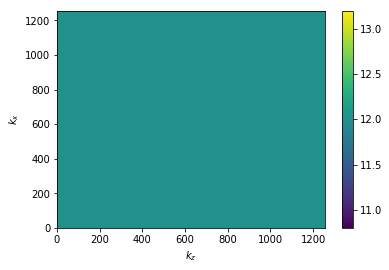

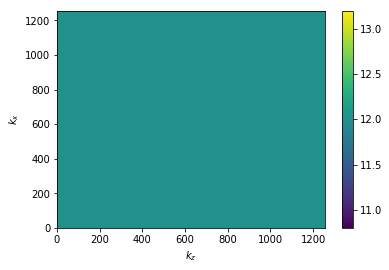

In [26]:
plt.pcolor(bArr, aArr, cOptHinfArr)
plt.xlabel("$k_z$"); plt.ylabel("$k_x$")
plt.colorbar()
plt.show()

plt.pcolor(bArr, aArr, cOptHSArr)
plt.xlabel("$k_z$"); plt.ylabel("$k_x$")
plt.colorbar()
plt.show()



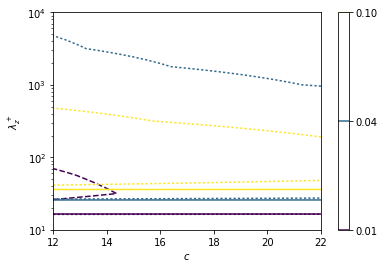

In [46]:
plt.contour(cArr, Re*2.*np.pi/bArr, svalsMaxArr[4], levels=np.array([0.01, 0.04, 0.1]),linestyles=':')
plt.contour(cArr, Re*2.*np.pi/bArr, svalsMaxArr[8], levels=np.array([0.01, 0.04, 0.1]),linestyles='--')
plt.contour(cArr, Re*2.*np.pi/bArr, svalsMaxArr[12], levels=np.array([0.01, 0.04, 0.1]),linestyles=':')
plt.contour(cArr, Re*2.*np.pi/bArr, svalsMaxArr[16], levels=np.array([0.01, 0.04, 0.1]),linestyles='-')
plt.xlabel("$c$"); plt.ylabel("$\lambda_z^+$")
plt.yscale("log")
plt.colorbar()
plt.show()


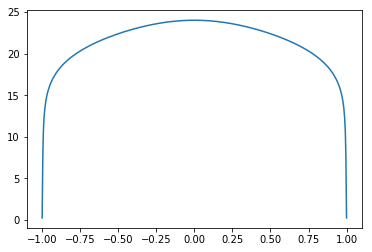

In [32]:
plt.plot(y,U)

# Eigenspectra of laminar and turbulent OSS

## And the Worst-case amplification and PSD of laminar and turbulent OSS

The argument I'm making here is that the resolvent operator sees the greatest amplification at $c=2/3$ for cases with an intersection of the A,P,S branches, and $c \approx U_{CL}$ for cases without. 

The laminar OSS, when its stable, has the intersection of the A,P,S branches at $c \approx 2/3$, and Reddy et. al. (1993) showed that near linear dependence of the eigenfunctions here produces a lot of non-normal growth. For the turbulent OSS, this intersection is close to the bulk velocity for the specified $Re_\tau$ at low $\alpha$; but the intersection disappears for large $\alpha$. At large $\alpha$, the growth rates for eigenfunctions decrease monotonically with wavespeed, so the amplification is dominated by the least stable mode, which is the one propogating with the centerline velocity. I'll plot a bunch of eigenspectra for different energy containing scales and see if this holds up. 

In [116]:
turbDict5000 = ops.turbMeanChannel(N=301,Re=5000.)
turbDict2003 = ops.turbMeanChannel(N=301,Re=2003.)
w = pseudo.clencurt(301)
print("Ubulk for ReTau=5000, ReTau=2003:",w @ turbDict5000['U'], w @ turbDict2003['U'])

Using parameters Re=5000, alfa=25.4, kapa=0.426, N=301
Using parameters Re=2003, alfa=25.4, kapa=0.426, N=301
Ubulk for ReTau=5000, ReTau=2003: 23.6741493894 21.4992933071


## Laminar

In [118]:
# Laminar
Re = 5000.; N = 201
bArr = np.array([0.2, 2.0, 5.0])
aArr = np.array([0.05,  0.1, 1.0, 5.0])
cArr = np.linspace(-1.,0., 25)

y, DM = pseudo.chebdif(N,2)
# Spectrum for each Fourier mode
evalsArr = np.zeros((aArr.size, bArr.size, 2*N), dtype=np.complex)
svalsMaxArr = np.zeros((aArr.size, bArr.size, cArr.size))
HSnormArr = np.zeros((aArr.size, bArr.size, cArr.size))

D4 = pseudo.cheb4c(N)
D1 = DM[:,:,0]; D2 = DM[:,:,1]

#turbDict = ops.turbMeanChannel(N=N, Re=Re)
#Umat   = np.diag(turbDict['U'])
#dUmat  = np.diag(turbDict['dU'])
#d2Umat  = np.diag(turbDict['d2U'])
I1 = np.identity(N); I2 = np.identity(2*N)
Z1 = np.zeros((N,N))
Umat   = np.diag(1. - y**2)
dUmat  = np.diag( -2.*y)
d2Umat = -2.*I1

weightDict = pseudo.weightMats(N)
W3s = weightDict['W3Sqrt']
W3si= weightDict['W3SqrtInv']
W2s = weightDict['W2Sqrt']
W2si= weightDict['W2SqrtInv']
W2  = weightDict['W2']


def makeSystemTemp(a,b):
    # This time, we don't need the resolvent, but just the system matrices and their adjoints.
    Delta = D2 - (a**2 + b**2) * I1
    DeltaSq = D4 + ((a**2 + b**2)**2) * I1 - 2.*(a**2+b**2)*D2
    DeltaInv = np.linalg.solve(Delta, I1)

    LOS = -1.j*a* Umat @ Delta + 1.j*a* d2Umat + DeltaSq/Re
    LSQ = -1.j*a*Umat + Delta/Re
    Lco = -1.j*b*dUmat
    k2 = a**2 + b**2
    A = np.vstack(( 
            np.hstack(( DeltaInv @ LOS, Z1 )),
            np.hstack(( Lco           , LSQ)) ))
    B = np.vstack((
            DeltaInv@ np.hstack(( -1.j*a*D1, -k2*I1, -1.j*b*D1 )),
            np.hstack((1.j*b*I1, Z1, -1.j*a*I1))  ))
    C = (1./k2) * np.vstack((
            np.hstack((1.j*a*D1, -1.j*b*I1)),
            np.hstack((k2 * I1 , Z1       )),
            np.hstack((1.j*b*D1,  1.j*a*I1)) ))

    return A, B, C


for i0 in range(aArr.size):
    a = aArr[i0]
    print("a=",a)
    for i1 in range(bArr.size):
        b = bArr[i1]
        print("b=",b)
        A, B, C = makeSystemTemp(a,b)

        evalsArr[i0,i1] = np.linalg.eigvals(A)
        if True:
            for i2 in range(cArr.size):
                c = cArr[i2]
                res = ( 1.j*a*c*I2 - A); resInv = np.linalg.solve(res,I2)
                H = W3s @ C @ resInv @ B @ W3si

                svals = svds(H,k=2)[1]
                svalsMaxArr[i0,i1,i2] = svals[0]
                HSnormArr[i0,i1,i2]   = np.linalg.norm(H,ord='fro')
            
      
svalsMaxArrLam = svalsMaxArr.copy()
HSnormArrLam = HSnormArr.copy()
evalsArrLam  = evalsArr.copy()       


a= 0.05
b= 0.2
b= 2.0
b= 5.0
a= 0.1
b= 0.2
b= 2.0
b= 5.0
a= 1.0
b= 0.2
b= 2.0
b= 5.0
a= 5.0
b= 0.2
b= 2.0
b= 5.0


UCL, Uinter: 1.0 0.6666666666666666



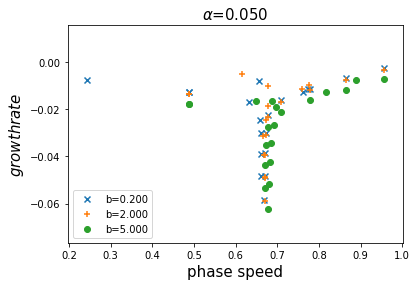

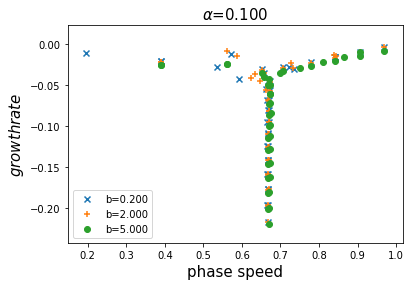

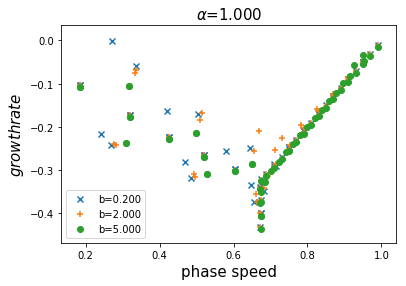

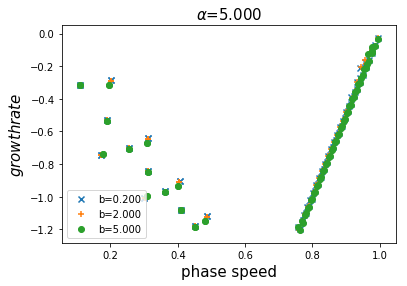

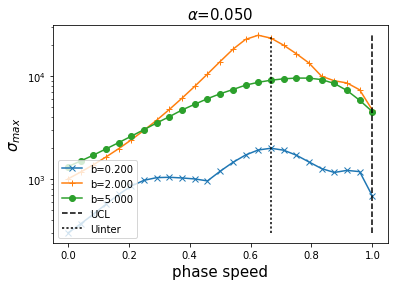

...

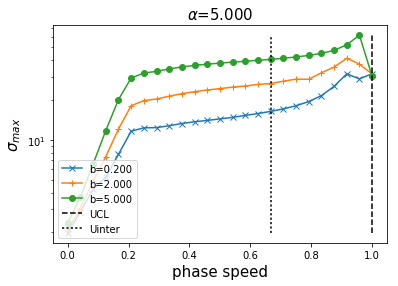

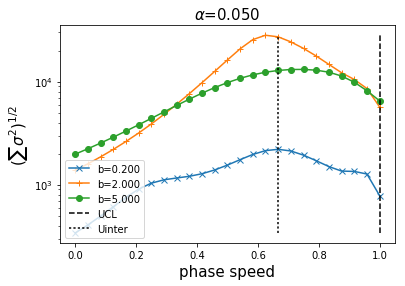

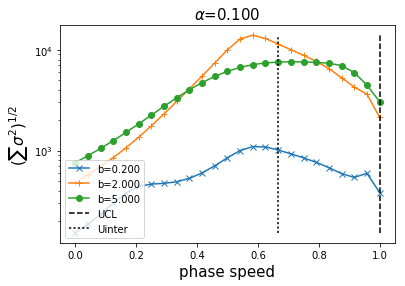

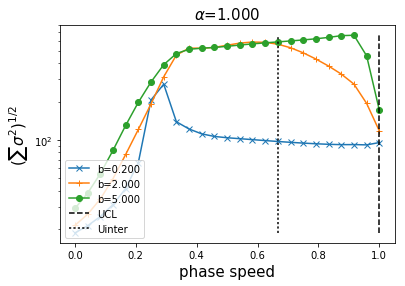

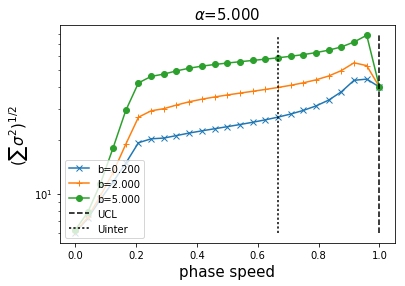

In [123]:
phaseSpeed = -evalsArrLam.imag.copy()/aArr.reshape((aArr.size,1,1))
growthRate =  evalsArrLam.real.copy()

UCL = 1.
Uinter = 2./3.
print("UCL, Uinter:",UCL, Uinter)

nEvals = 20
symArr = ['x','+','o','s','v','^','d']
print("")
for i0 in range(aArr.size):
    plt.figure()
    #plt.xlim([0.,1.])
    #plt.ylim([-1., 0.1])
    plt.xlabel("phase speed",fontsize=15)
    plt.ylabel("$growth rate$",fontsize=15)
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    for i1 in range(bArr.size):
        sortInd = np.argsort(growthRate[i0,i1])
        growthRate[i0,i1] = growthRate[i0,i1,sortInd]
        phaseSpeed[i0,i1] = phaseSpeed[i0,i1,sortInd]
        plt.scatter(phaseSpeed[i0,i1,-nEvals:],growthRate[i0,i1,-nEvals:],
                    marker=symArr[i1],label='b=%.3f'%bArr[i1])
    plt.legend(loc=3)
    plt.show()
    nEvals += 20


svalsMaxArr = svalsMaxArrLam.copy()    
for i0 in range(aArr.size):
    plt.figure()
    plt.xlabel("phase speed",fontsize=15)
    plt.ylabel("$\\sigma_{max}$",fontsize=15)
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    for i1 in range(bArr.size):
        plt.plot(-cArr, svalsMaxArr[i0,i1], marker=symArr[i1],label='b=%.3f'%bArr[i1])
    plotRangeMin = np.amin(svalsMaxArr[i0].flatten())
    plotRangeMax = np.amax(svalsMaxArr[i0].flatten())
    plt.plot(UCL*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k--',label="UCL")
    plt.plot(Uinter*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k:',label="Uinter")
    plt.yscale("log")
    plt.legend(loc=3)
    plt.show()
    
HSnormArr = HSnormArrLam.copy()
for i0 in range(aArr.size):
    plt.figure()
    plt.xlabel("phase speed",fontsize=15)
    plt.ylabel("$(\\sum\\sigma^2)^{1/2}$",fontsize=15)
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    for i1 in range(bArr.size):
        plt.plot(-cArr, HSnormArr[i0,i1], marker=symArr[i1],label='b=%.3f'%bArr[i1])
    plotRangeMin = np.amin(HSnormArr[i0].flatten())
    plotRangeMax = np.amax(HSnormArr[i0].flatten())
    plt.plot(UCL*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k--',label="UCL")
    plt.plot(Uinter*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k:',label="Uinter")
    plt.yscale("log")
    plt.legend(loc=3)
    plt.show()
    
    
    
    

## Turbulent, $Re_\tau=5000$

In [185]:
# Turbulent
Re = 5000.; N = 301
bArr = np.array([0.2, 2.0, 10.0])
aArr = np.array([0.05,  0.1, 1.0, 5.0, 20.])
cArr = np.concatenate(( np.linspace(-35.,-28.,8), np.linspace(-27, -22., 20), np.linspace(-21., 0., 22)))
cArrReTau5000 = cArr.copy()
# We use the same Fourier modes for turbulent as we did for laminar.
# For justification, see fig. 8.15 and 8.16 of Jovanovic's thesis.

y, DM = pseudo.chebdif(N,2)
# Spectrum for each Fourier mode
evalsArr = np.zeros((aArr.size, bArr.size, 2*N), dtype=np.complex)
svalsMaxArr = np.zeros((aArr.size, bArr.size, cArr.size))
HSnormArr = np.zeros((aArr.size, bArr.size, cArr.size))

D4 = pseudo.cheb4c(N)
D1 = DM[:,:,0]; D2 = DM[:,:,1]

turbDict = ops.turbMeanChannel(N=N, Re=Re)
turbDict5000 = turbDict.copy()
Umat   = np.diag(turbDict['U'])
dUmat  = np.diag(turbDict['dU'])
d2Umat  = np.diag(turbDict['d2U'])
I1 = np.identity(N); I2 = np.identity(2*N)
Z1 = np.zeros((N,N))

weightDict = pseudo.weightMats(N)
W3s = weightDict['W3Sqrt']
W3si= weightDict['W3SqrtInv']
W2s = weightDict['W2Sqrt']
W2si= weightDict['W2SqrtInv']
W2  = weightDict['W2']


def makeSystemTemp(a,b):
    # This time, we don't need the resolvent, but just the system matrices and their adjoints.
    Delta = D2 - (a**2 + b**2) * I1
    DeltaSq = D4 + ((a**2 + b**2)**2) * I1 - 2.*(a**2+b**2)*D2
    DeltaInv = np.linalg.solve(Delta, I1)

    LOS = -1.j*a* Umat @ Delta + 1.j*a* d2Umat + DeltaSq/Re
    LSQ = -1.j*a*Umat + Delta/Re
    Lco = -1.j*b*dUmat
    k2 = a**2 + b**2
    A = np.vstack(( 
            np.hstack(( DeltaInv @ LOS, Z1 )),
            np.hstack(( Lco           , LSQ)) ))
    B = np.vstack((
            DeltaInv@ np.hstack(( -1.j*a*D1, -k2*I1, -1.j*b*D1 )),
            np.hstack((1.j*b*I1, Z1, -1.j*a*I1))  ))
    C = (1./k2) * np.vstack((
            np.hstack((1.j*a*D1, -1.j*b*I1)),
            np.hstack((k2 * I1 , Z1       )),
            np.hstack((1.j*b*D1,  1.j*a*I1)) ))

    return A, B, C


for i0 in range(aArr.size):
    a = aArr[i0]
    print("a=",a)
    for i1 in range(bArr.size):
        b = bArr[i1]
        print("b=",b)
        A, B, C = makeSystemTemp(a,b)

        evalsArr[i0,i1] = np.linalg.eigvals(A)
        if True:
            for i2 in range(cArr.size):
                c = cArr[i2]
                res = ( 1.j*a*c*I2 - A); resInv = np.linalg.solve(res,I2)
                H = W3s @ C @ resInv @ B @ W3si

                svals = svds(H,k=2)[1]
                svalsMaxArr[i0,i1,i2] = svals[0]
                HSnormArr[i0,i1,i2]   = np.linalg.norm(H,ord='fro')

svalsMaxArrReTau5000 = svalsMaxArr.copy()
HSnormArrReTau5000 = HSnormArr.copy()
evalsArrReTau5000  = evalsArr.copy()       


Using parameters Re=5000, alfa=25.4, kapa=0.426, N=301
a= 0.05
b= 0.2
b= 2.0
b= 10.0
a= 0.1
b= 0.2
b= 2.0
b= 10.0
a= 1.0
b= 0.2
b= 2.0
b= 10.0
a= 5.0
b= 0.2
b= 2.0
b= 10.0
a= 20.0
b= 0.2
b= 2.0
b= 10.0


UCL, Ubulk: 26.1787044308 23.6741493894



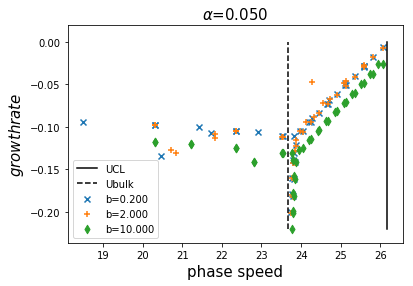

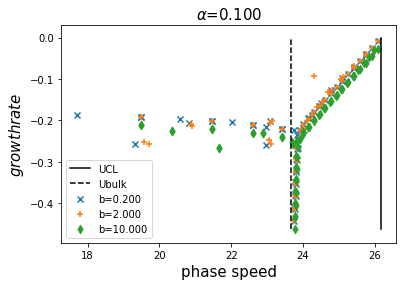

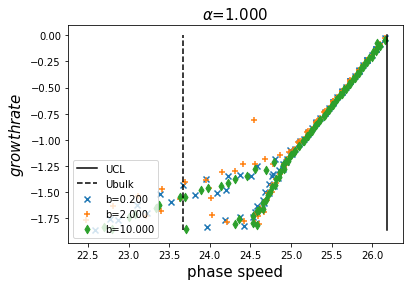

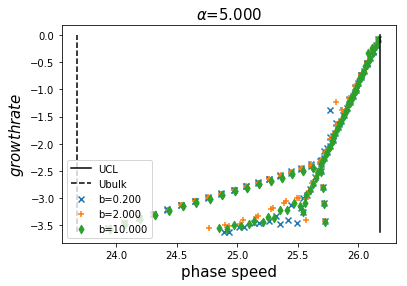

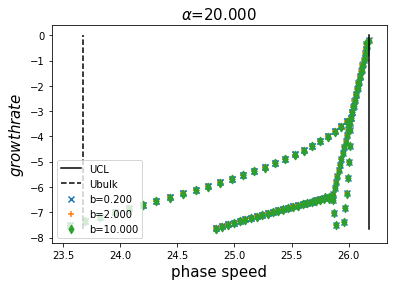

...

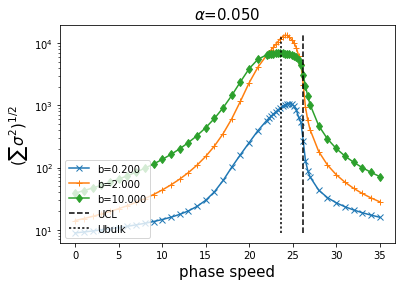

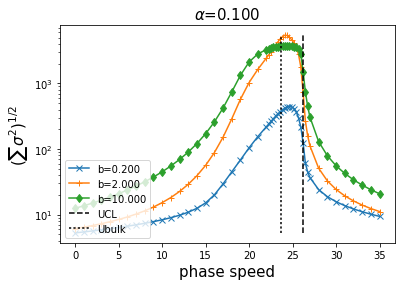

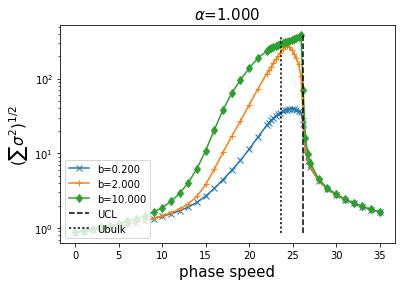

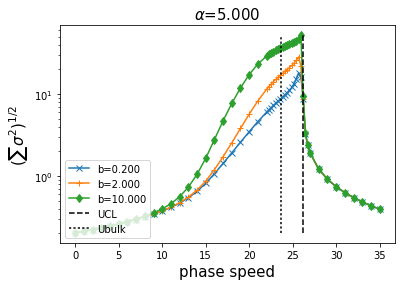

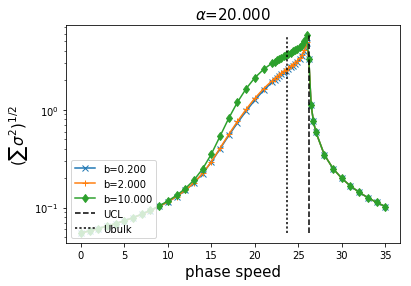

In [196]:
phaseSpeed = -evalsArrReTau5000.imag.copy()/aArr.reshape((aArr.size,1,1))
growthRate =  evalsArrReTau5000.real.copy()
cArr = cArrReTau5000.copy()
svalsMaxArr = svalsMaxArrReTau5000.copy()    
HSnormArr = HSnormArrReTau5000.copy()
U = turbDict5000['U']
UCL = np.max(U)
w = pseudo.clencurt(U.size); Ubulk = w @ U
print("UCL, Ubulk:",UCL, Ubulk)


nEvalsArr = np.array([40,60,85,100,150])
symArr = ['x','+','d','v','^','s']
print("")
for i0 in range(aArr.size):
    plt.figure()
    #plt.xlim([0.,1.])
    #plt.ylim([-1., 0.1])
    plt.xlabel("phase speed",fontsize=15)
    plt.ylabel("$growth rate$",fontsize=15)
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    for i1 in range(bArr.size):
        sortInd = np.argsort(growthRate[i0,i1])
        growthRate[i0,i1] = growthRate[i0,i1,sortInd]
        phaseSpeed[i0,i1] = phaseSpeed[i0,i1,sortInd]
        plt.scatter(phaseSpeed[i0,i1,-nEvalsArr[i0]:],growthRate[i0,i1,-nEvalsArr[i0]:],
                    marker=symArr[i1],label='b=%.3f'%bArr[i1])
    
    plt.plot(UCL*np.ones(20), np.linspace(np.amin(growthRate[i0,:,-nEvalsArr[i0]:]), 0., 20), 'k-',label="UCL" )
    plt.plot(Ubulk*np.ones(20), np.linspace(np.amin(growthRate[i0,:,-nEvalsArr[i0]:]), 0., 20), 'k--', label="Ubulk" )
    plt.legend(loc=3)
    plt.show()


for i0 in range(aArr.size):
    plt.figure()
    plt.xlabel("phase speed",fontsize=15)
    plt.ylabel("$\\sigma_{max}$",fontsize=15)
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    for i1 in range(bArr.size):
        plt.plot(-cArr, svalsMaxArr[i0,i1], marker=symArr[i1],label='b=%.3f'%bArr[i1])
    plotRangeMin = np.amin(svalsMaxArr[i0].flatten())
    plotRangeMax = np.amax(svalsMaxArr[i0].flatten())
    plt.plot(UCL*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k--',label="UCL")
    plt.plot(Ubulk*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k:',label="Ubulk")
    plt.yscale("log")
    plt.legend(loc=3)
    plt.show()
    
for i0 in range(aArr.size):
    plt.figure()
    plt.xlabel("phase speed",fontsize=15)
    plt.ylabel("$(\\sum\\sigma^2)^{1/2}$",fontsize=15)
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    for i1 in range(bArr.size):
        plt.plot(-cArr, HSnormArr[i0,i1], marker=symArr[i1],label='b=%.3f'%bArr[i1])
    plotRangeMin = np.amin(HSnormArr[i0].flatten())
    plotRangeMax = np.amax(HSnormArr[i0].flatten())
    plt.plot(UCL*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k--',label="UCL")
    plt.plot(Ubulk*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k:',label="Ubulk")
    plt.yscale("log")
    plt.legend(loc=3)
    plt.show()
    
    
    
    

## Turbulent, $Re_\tau = 2003.$
To reconcile with Moarreff et. al. (2013)

In [189]:
# Turbulent
Re = 2003.; N = 251
bArr = np.array([0.2, 2.0, 10.0])
aArr = np.array([0.05,  0.1, 1.0, 5.0, 20.])
cArr = np.concatenate(( np.linspace(-35.,-26.,10), np.linspace(-25, -20., 21), np.linspace(-19., 0., 20)))
cArrReTau2003 = cArr.copy()
# We use the same Fourier modes for turbulent as we did for laminar.
# For justification, see fig. 8.15 and 8.16 of Jovanovic's thesis.

y, DM = pseudo.chebdif(N,2)
# Spectrum for each Fourier mode
evalsArr = np.zeros((aArr.size, bArr.size, 2*N), dtype=np.complex)
svalsMaxArr = np.zeros((aArr.size, bArr.size, cArr.size))
HSnormArr = np.zeros((aArr.size, bArr.size, cArr.size))

D4 = pseudo.cheb4c(N)
D1 = DM[:,:,0]; D2 = DM[:,:,1]

turbDict = ops.turbMeanChannel(N=N, Re=Re)
turbDict2003 = turbDict.copy()
Umat   = np.diag(turbDict['U'])
dUmat  = np.diag(turbDict['dU'])
d2Umat  = np.diag(turbDict['d2U'])
I1 = np.identity(N); I2 = np.identity(2*N)
Z1 = np.zeros((N,N))

weightDict = pseudo.weightMats(N)
W3s = weightDict['W3Sqrt']
W3si= weightDict['W3SqrtInv']
W2s = weightDict['W2Sqrt']
W2si= weightDict['W2SqrtInv']
W2  = weightDict['W2']


def makeSystemTemp(a,b):
    # This time, we don't need the resolvent, but just the system matrices and their adjoints.
    Delta = D2 - (a**2 + b**2) * I1
    DeltaSq = D4 + ((a**2 + b**2)**2) * I1 - 2.*(a**2+b**2)*D2
    DeltaInv = np.linalg.solve(Delta, I1)

    LOS = -1.j*a* Umat @ Delta + 1.j*a* d2Umat + DeltaSq/Re
    LSQ = -1.j*a*Umat + Delta/Re
    Lco = -1.j*b*dUmat
    k2 = a**2 + b**2
    A = np.vstack(( 
            np.hstack(( DeltaInv @ LOS, Z1 )),
            np.hstack(( Lco           , LSQ)) ))
    B = np.vstack((
            DeltaInv@ np.hstack(( -1.j*a*D1, -k2*I1, -1.j*b*D1 )),
            np.hstack((1.j*b*I1, Z1, -1.j*a*I1))  ))
    C = (1./k2) * np.vstack((
            np.hstack((1.j*a*D1, -1.j*b*I1)),
            np.hstack((k2 * I1 , Z1       )),
            np.hstack((1.j*b*D1,  1.j*a*I1)) ))

    return A, B, C

startTime = time.time()
for i0 in range(aArr.size):
    a = aArr[i0]
    print("a=",a)
    print("time elapsed:%d min"%((time.time()-startTime)/60.))
    for i1 in range(bArr.size):
        b = bArr[i1]
        print("b=",b)
        A, B, C = makeSystemTemp(a,b)

        evalsArr[i0,i1] = np.linalg.eigvals(A)
        if True:
            for i2 in range(cArr.size):
                c = cArr[i2]
                res = ( 1.j*a*c*I2 - A); resInv = np.linalg.solve(res,I2)
                H = W3s @ C @ resInv @ B @ W3si

                svals = svds(H,k=2)[1]
                svalsMaxArr[i0,i1,i2] = svals[0]
                HSnormArr[i0,i1,i2]   = np.linalg.norm(H,ord='fro')

       
svalsMaxArrReTau2003 = svalsMaxArr.copy()
HSnormArrReTau2003 = HSnormArr.copy()
evalsArrReTau2003  = evalsArr.copy()

Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
a= 0.05
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 0.1
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 1.0
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 5.0
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 20.0
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0


UCL, Ubulk: 24.017917525 21.4992933072



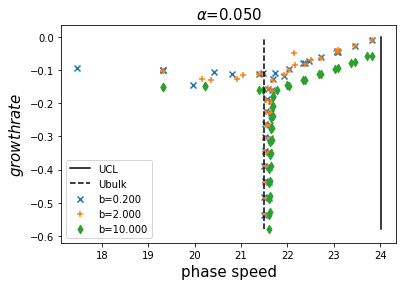

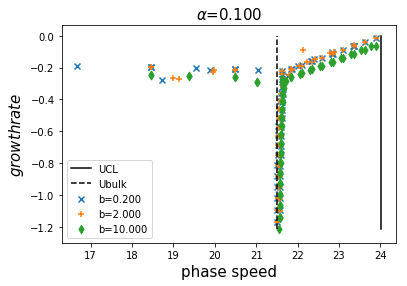

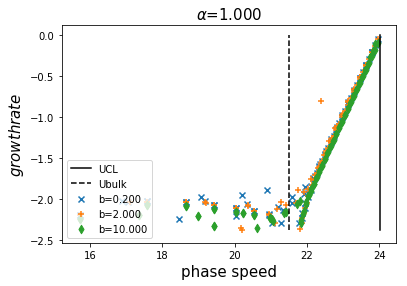

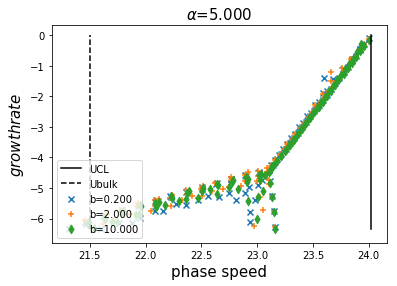

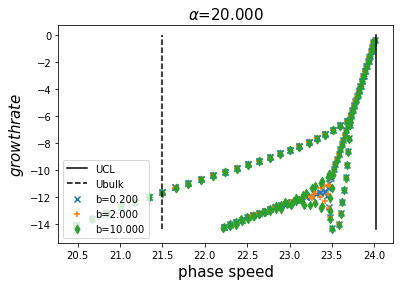

...

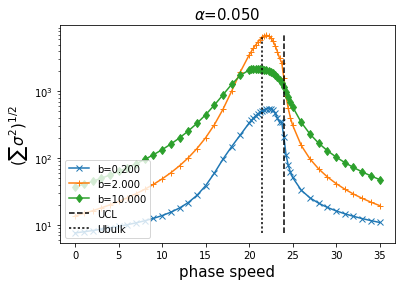

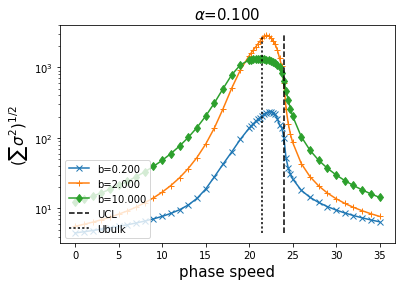

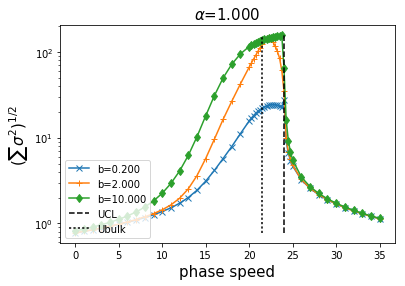

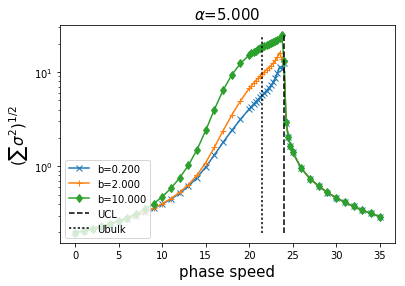

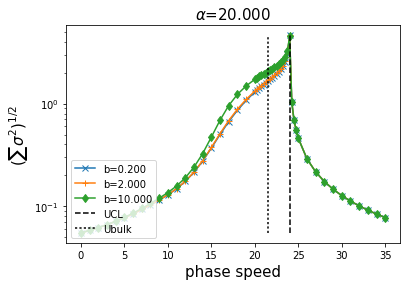

In [195]:
phaseSpeed = -evalsArrReTau2003.imag.copy()/aArr.reshape((aArr.size,1,1))
growthRate =  evalsArrReTau2003.real.copy()
cArr = cArrReTau2003.copy()
svalsMaxArr = svalsMaxArrReTau2003.copy()    
HSnormArr = HSnormArrReTau2003.copy()

U = turbDict2003['U']
UCL = np.max(U)
w = pseudo.clencurt(U.size); Ubulk = w @ U
print("UCL, Ubulk:",UCL, Ubulk)


nEvalsArr = np.array([40,60,85,100,150])
symArr = ['x','+','d','v','^','s']
print("")
for i0 in range(aArr.size):
    plt.figure()
    #plt.xlim([0.,1.])
    #plt.ylim([-1., 0.1])
    plt.xlabel("phase speed",fontsize=15)
    plt.ylabel("$growth rate$",fontsize=15)
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    for i1 in range(bArr.size):
        sortInd = np.argsort(growthRate[i0,i1])
        growthRate[i0,i1] = growthRate[i0,i1,sortInd]
        phaseSpeed[i0,i1] = phaseSpeed[i0,i1,sortInd]
        plt.scatter(phaseSpeed[i0,i1,-nEvalsArr[i0]:],growthRate[i0,i1,-nEvalsArr[i0]:],
                    marker=symArr[i1],label='b=%.3f'%bArr[i1])
    
    plt.plot(UCL*np.ones(20), np.linspace(np.amin(growthRate[i0,:,-nEvalsArr[i0]:]), 0., 20), 'k-',label="UCL" )
    plt.plot(Ubulk*np.ones(20), np.linspace(np.amin(growthRate[i0,:,-nEvalsArr[i0]:]), 0., 20), 'k--', label="Ubulk" )
    plt.legend(loc=3)
    plt.show()


for i0 in range(aArr.size):
    plt.figure()
    plt.xlabel("phase speed",fontsize=15)
    plt.ylabel("$\\sigma_{max}$",fontsize=15)
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    for i1 in range(bArr.size):
        plt.plot(-cArr, svalsMaxArr[i0,i1], marker=symArr[i1],label='b=%.3f'%bArr[i1])
    plotRangeMin = np.amin(svalsMaxArr[i0].flatten())
    plotRangeMax = np.amax(svalsMaxArr[i0].flatten())
    plt.plot(UCL*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k--',label="UCL")
    plt.plot(Ubulk*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k:',label="Ubulk")
    plt.yscale("log")
    plt.legend(loc=3)
    plt.show()
    
for i0 in range(aArr.size):
    plt.figure()
    plt.xlabel("phase speed",fontsize=15)
    plt.ylabel("$(\\sum\\sigma^2)^{1/2}$",fontsize=15)
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    for i1 in range(bArr.size):
        plt.plot(-cArr, HSnormArr[i0,i1], marker=symArr[i1],label='b=%.3f'%bArr[i1])
    plotRangeMin = np.amin(HSnormArr[i0].flatten())
    plotRangeMax = np.amax(HSnormArr[i0].flatten())
    plt.plot(UCL*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k--',label="UCL")
    plt.plot(Ubulk*np.ones(20), np.linspace(plotRangeMin,plotRangeMax,20),'k:',label="Ubulk")
    plt.yscale("log")
    plt.legend(loc=3)
    plt.show()
    
    
    
    

## Energy from stochastic forcing vs amplification of harmonic forcing
We know now that the most amplification for harmonic forcing happens somewhere between the intersection of the A,P,S branches (which is close to the bulk velocity), and the centerline velocity (which tends to have the largest growth rate). Under the critical-layer based amplification, we expect that when the system is stochastically forced, the energy in $u$ gets concentrated between these locations (where the local velocity lies between the bulk and centerline velocities). 

Let's see what happens. 

## $Re_\tau = 2003$

In [197]:
# Turbulent
Re = 2003.; N = 251
bArr = np.array([0.2, 2.0, 10.0])
aArr = np.array([0.05,  0.1, 1.0, 5.0, 20.])
cArr = np.linspace(-35., 0., 36)
# We use the same Fourier modes for turbulent as we did for laminar.
# For justification, see fig. 8.15 and 8.16 of Jovanovic's thesis.

y, DM = pseudo.chebdif(N,2)
# Spectrum for each Fourier mode
uuArr = np.zeros((aArr.size, bArr.size, N))
uvArr = np.zeros((aArr.size, bArr.size, N), dtype=np.complex)


D4 = pseudo.cheb4c(N)
D1 = DM[:,:,0]; D2 = DM[:,:,1]

turbDict = ops.turbMeanChannel(N=N, Re=Re)
Umat   = np.diag(turbDict['U'])
dUmat  = np.diag(turbDict['dU'])
d2Umat  = np.diag(turbDict['d2U'])
I1 = np.identity(N); I2 = np.identity(2*N)
Z1 = np.zeros((N,N))

weightDict = pseudo.weightMats(N)
W3s = weightDict['W3Sqrt']
W3si= weightDict['W3SqrtInv']
W2s = weightDict['W2Sqrt']
W2si= weightDict['W2SqrtInv']
W2  = weightDict['W2']


def makeSystemTemp(a,b):
    # This time, we don't need the resolvent, but just the system matrices and their adjoints.
    Delta = D2 - (a**2 + b**2) * I1
    DeltaSq = D4 + ((a**2 + b**2)**2) * I1 - 2.*(a**2+b**2)*D2
    DeltaInv = np.linalg.solve(Delta, I1)

    LOS = -1.j*a* Umat @ Delta + 1.j*a* d2Umat + DeltaSq/Re
    LSQ = -1.j*a*Umat + Delta/Re
    Lco = -1.j*b*dUmat
    k2 = a**2 + b**2
    A = np.vstack(( 
            np.hstack(( DeltaInv @ LOS, Z1 )),
            np.hstack(( Lco           , LSQ)) ))
    LOSadj = 1.j*a*Umat - 1.j*a*DeltaInv @ d2Umat + (DeltaInv @ DeltaSq)/Re
    Lcoadj = -1.j*b*DeltaInv @ dUmat
    LSQadj = 1.j*a*Umat + Delta/Re
    Aadj = np.vstack((
            np.hstack(( LOSadj, Lcoadj)),
            np.hstack(( Z1    , LSQadj))  ))
    B = np.vstack((
            DeltaInv@ np.hstack(( -1.j*a*D1, -k2*I1, -1.j*b*D1 )),
            np.hstack((1.j*b*I1, Z1, -1.j*a*I1))  ))
    C = (1./k2) * np.vstack((
            np.hstack((1.j*a*D1, -1.j*b*I1)),
            np.hstack((k2 * I1 , Z1       )),
            np.hstack((1.j*b*D1,  1.j*a*I1)) ))

    Badj = C; Cadj = B
    return A, Aadj, B, Badj, C, Cadj

startTime = time.time()
for i0 in range(aArr.size):
    a = aArr[i0]
    print("a=",a)
    print("time elapsed:%d min"%((time.time()-startTime)/60.))
    for i1 in range(bArr.size):
        b = bArr[i1]
        print("b=",b)
        A, Aadj, B, Badj, C, Cadj = makeSystemTemp(a,b)
        X = solve_sylvester( A, Aadj, -B @ Badj )
        Phi = C @ X @ Cadj
            
        uuArr[i0,i1]  = np.diag(Phi[:N   ,:N   ].real)
        uvArr[i0,i1]  = np.diag(Phi[:N   ,N:2*N])


       
uuArrReTau2003 = uuArr.copy()
uvArrReTau2003 = uvArr.copy()



Using parameters Re=2003, alfa=25.4, kapa=0.426, N=251
a= 0.05
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 0.1
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 1.0
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 5.0
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 20.0
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0


UCL, Ubulk: 24.017917525 21.4992933072


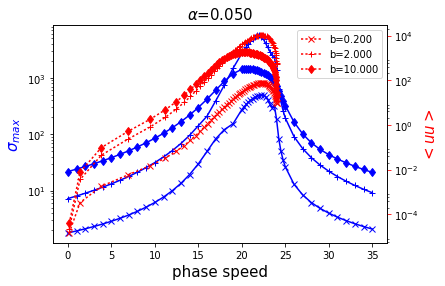

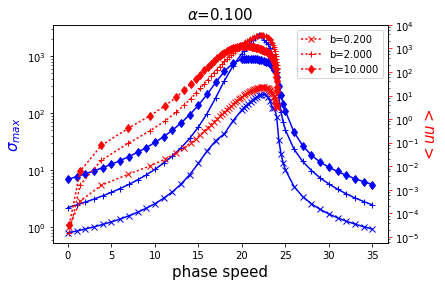

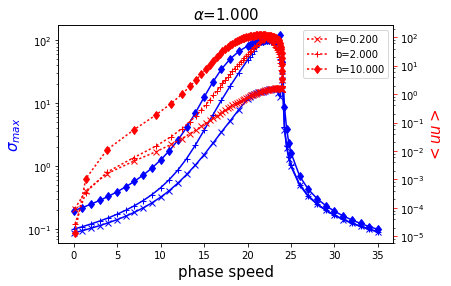

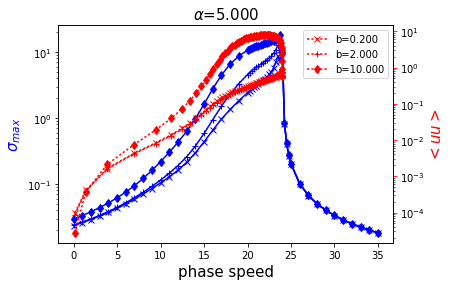

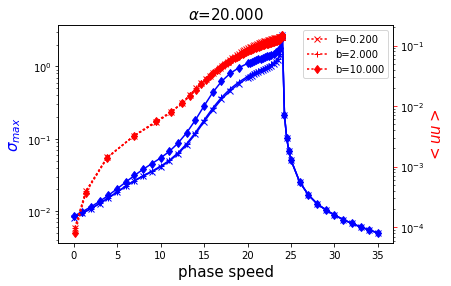

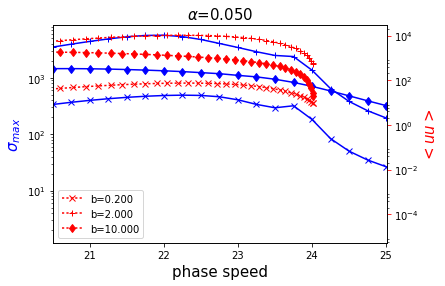

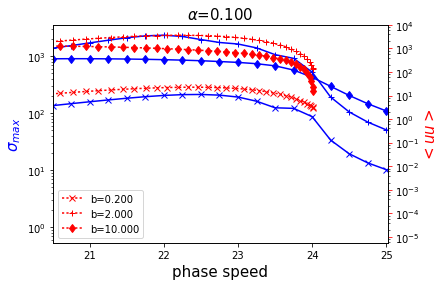

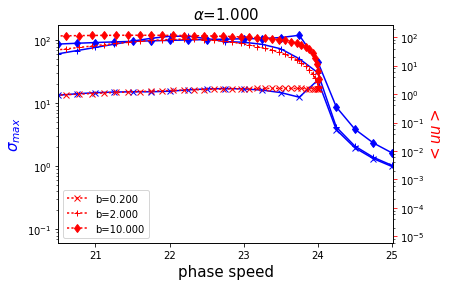

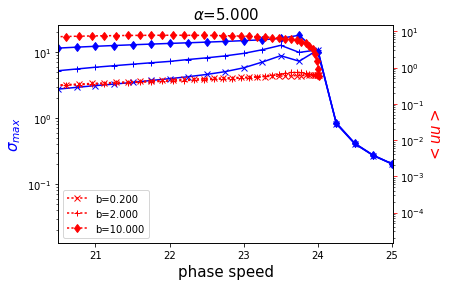

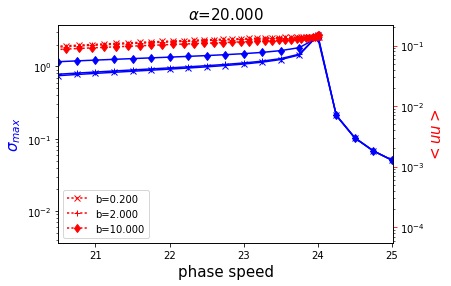

In [198]:
svalsMaxArr = svalsMaxArrReTau2003
uuArr = uuArrReTau2003.copy()
cArr = cArrReTau2003.copy()
U = turbDict2003['U']
UCL = np.max(U)
w = pseudo.clencurt(U.size); Ubulk = w @ U
print("UCL, Ubulk:",UCL, Ubulk)

for i0 in range(aArr.size):
    fig,ax1 = plt.subplots()
    ax1.set_xlabel("phase speed",fontsize=15)
    ax1.set_ylabel("$\\sigma_{max}$",fontsize=15,color='b')
    ax2 = ax1.twinx()
    ax2.set_ylabel("$<uu>$", fontsize=15, color='r')
    ax2.tick_params('y',color='r')
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    for i1 in range(bArr.size):
        ax1.plot(-cArr, svalsMaxArr[i0,i1], 'b-%s'%symArr[i1],label='b=%.3f'%bArr[i1])
        ax2.plot(turbDict['U'][:N//2:2], uuArr[i0,i1,:N//2:2], 'r:%s'%symArr[i1],label='b=%.3f'%bArr[i1])
    ax1.set_yscale("log"); ax2.set_yscale("log")
    plt.legend(loc=1)
    plt.show()

for i0 in range(aArr.size):
    fig,ax1 = plt.subplots()
    ax1.set_xlabel("phase speed",fontsize=15)
    ax1.set_ylabel("$\\sigma_{max}$",fontsize=15,color='b')
    ax2 = ax1.twinx()
    ax2.set_ylabel("$<uu>$", fontsize=15, color='r')
    ax2.tick_params('y',color='r')
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    ax1.set_xlim([Ubulk-1,UCL+1]); ax2.set_xlim([Ubulk-1, UCL+1])
    for i1 in range(bArr.size):
        ax1.plot(-cArr, svalsMaxArr[i0,i1], 'b-%s'%symArr[i1],label='b=%.3f'%bArr[i1])
        ax2.plot(turbDict['U'][:N//2:2], uuArr[i0,i1,:N//2:2], 'r:%s'%symArr[i1],label='b=%.3f'%bArr[i1])
    ax1.set_yscale("log"); ax2.set_yscale("log")
    plt.legend(loc=3)
    plt.show()    

## $Re_\tau = 5000$

In [199]:
# Turbulent
Re = 5000.; N = 301
bArr = np.array([0.2, 2.0, 10.0])
aArr = np.array([0.05,  0.1, 1.0, 5.0, 20.])
#cArr = np.linspace(-35., 0., 36)
cArr = np.concatenate(( np.linspace(-35.,-28.,8), np.linspace(-27, -22., 20), np.linspace(-21., 0., 22)))
# We use the same Fourier modes for turbulent as we did for laminar.
# For justification, see fig. 8.15 and 8.16 of Jovanovic's thesis.

y, DM = pseudo.chebdif(N,2)
# Spectrum for each Fourier mode
uuArr = np.zeros((aArr.size, bArr.size, N))
uvArr = np.zeros((aArr.size, bArr.size, N), dtype=np.complex)


D4 = pseudo.cheb4c(N)
D1 = DM[:,:,0]; D2 = DM[:,:,1]

turbDict = ops.turbMeanChannel(N=N, Re=Re)
Umat   = np.diag(turbDict['U'])
dUmat  = np.diag(turbDict['dU'])
d2Umat  = np.diag(turbDict['d2U'])
I1 = np.identity(N); I2 = np.identity(2*N)
Z1 = np.zeros((N,N))

weightDict = pseudo.weightMats(N)
W3s = weightDict['W3Sqrt']
W3si= weightDict['W3SqrtInv']
W2s = weightDict['W2Sqrt']
W2si= weightDict['W2SqrtInv']
W2  = weightDict['W2']


def makeSystemTemp(a,b):
    # This time, we don't need the resolvent, but just the system matrices and their adjoints.
    Delta = D2 - (a**2 + b**2) * I1
    DeltaSq = D4 + ((a**2 + b**2)**2) * I1 - 2.*(a**2+b**2)*D2
    DeltaInv = np.linalg.solve(Delta, I1)

    LOS = -1.j*a* Umat @ Delta + 1.j*a* d2Umat + DeltaSq/Re
    LSQ = -1.j*a*Umat + Delta/Re
    Lco = -1.j*b*dUmat
    k2 = a**2 + b**2
    A = np.vstack(( 
            np.hstack(( DeltaInv @ LOS, Z1 )),
            np.hstack(( Lco           , LSQ)) ))
    LOSadj = 1.j*a*Umat - 1.j*a*DeltaInv @ d2Umat + (DeltaInv @ DeltaSq)/Re
    Lcoadj = -1.j*b*DeltaInv @ dUmat
    LSQadj = 1.j*a*Umat + Delta/Re
    Aadj = np.vstack((
            np.hstack(( LOSadj, Lcoadj)),
            np.hstack(( Z1    , LSQadj))  ))
    B = np.vstack((
            DeltaInv@ np.hstack(( -1.j*a*D1, -k2*I1, -1.j*b*D1 )),
            np.hstack((1.j*b*I1, Z1, -1.j*a*I1))  ))
    C = (1./k2) * np.vstack((
            np.hstack((1.j*a*D1, -1.j*b*I1)),
            np.hstack((k2 * I1 , Z1       )),
            np.hstack((1.j*b*D1,  1.j*a*I1)) ))

    Badj = C; Cadj = B
    return A, Aadj, B, Badj, C, Cadj

startTime = time.time()
for i0 in range(aArr.size):
    a = aArr[i0]
    print("a=",a)
    print("time elapsed:%d min"%((time.time()-startTime)/60.))
    for i1 in range(bArr.size):
        b = bArr[i1]
        print("b=",b)
        A, Aadj, B, Badj, C, Cadj = makeSystemTemp(a,b)
        X = solve_sylvester( A, Aadj, -B @ Badj )
        Phi = C @ X @ Cadj
            
        uuArr[i0,i1]  = np.diag(Phi[:N   ,:N   ].real)
        uvArr[i0,i1]  = np.diag(Phi[:N   ,N:2*N])


       
uuArrReTau5000 = uuArr.copy()
uvArrReTau5000 = uvArr.copy()



Using parameters Re=5000, alfa=25.4, kapa=0.426, N=301
a= 0.05
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 0.1
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 1.0
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 5.0
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0
a= 20.0
time elapsed:0 min
b= 0.2
b= 2.0
b= 10.0


UCL, Ubulk: 26.1787044308 23.6741493894


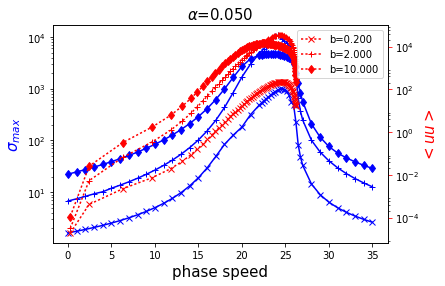

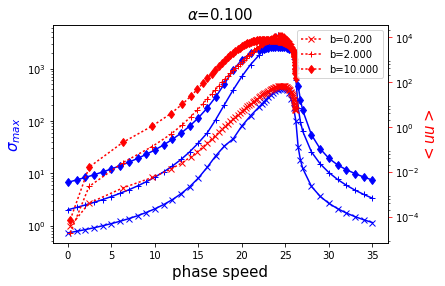

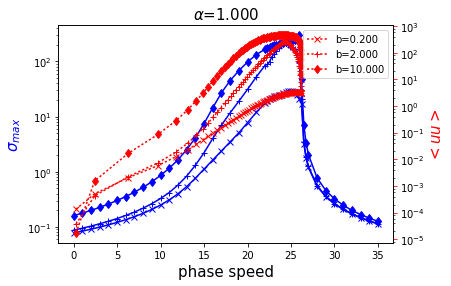

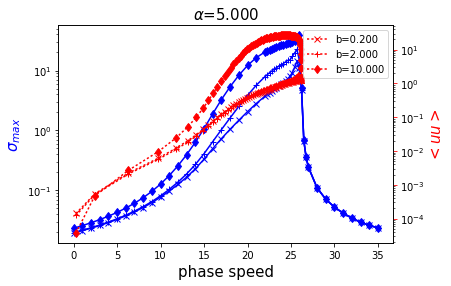

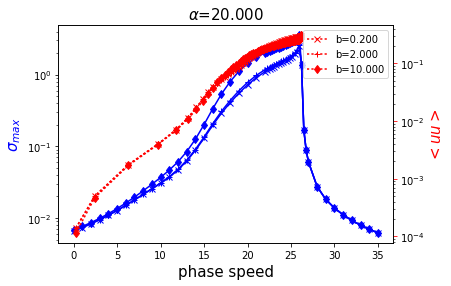

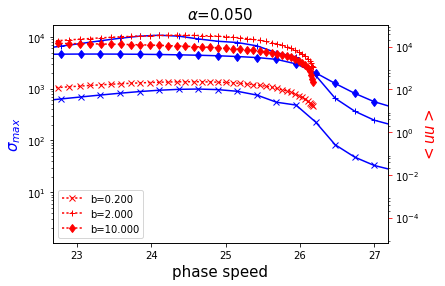

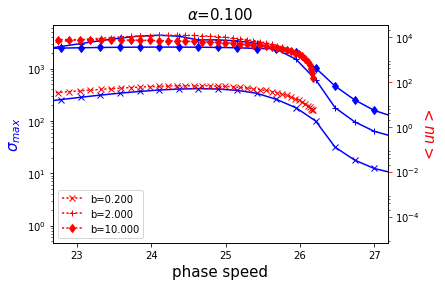

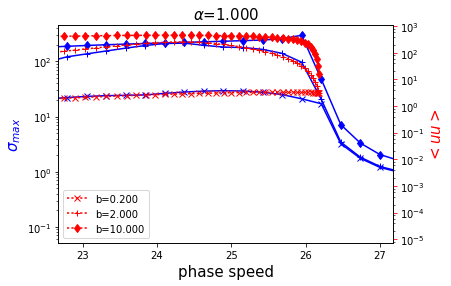

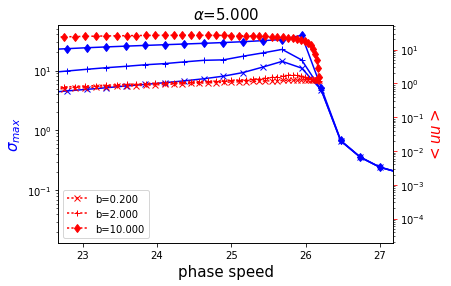

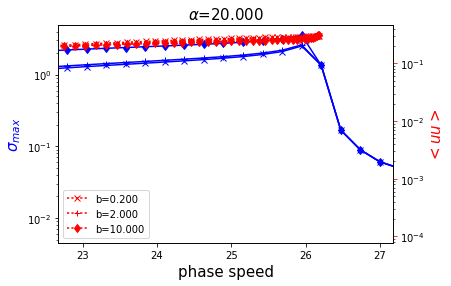

In [200]:
svalsMaxArr = svalsMaxArrReTau5000
uuArr = uuArrReTau5000.copy()
cArr = cArrReTau5000.copy()
U = turbDict5000['U']
UCL = np.max(U)
w = pseudo.clencurt(U.size); Ubulk = w @ U
print("UCL, Ubulk:",UCL, Ubulk)

for i0 in range(aArr.size):
    fig,ax1 = plt.subplots()
    ax1.set_xlabel("phase speed",fontsize=15)
    ax1.set_ylabel("$\\sigma_{max}$",fontsize=15,color='b')
    ax2 = ax1.twinx()
    ax2.set_ylabel("$<uu>$", fontsize=15, color='r')
    ax2.tick_params('y',color='r')
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    for i1 in range(bArr.size):
        ax1.plot(-cArr, svalsMaxArr[i0,i1], 'b-%s'%symArr[i1],label='b=%.3f'%bArr[i1])
        ax2.plot(turbDict['U'][:N//2:2], uuArr[i0,i1,:N//2:2], 'r:%s'%symArr[i1],label='b=%.3f'%bArr[i1])
    ax1.set_yscale("log"); ax2.set_yscale("log")
    plt.legend(loc=1)
    plt.show()

for i0 in range(aArr.size):
    fig,ax1 = plt.subplots()
    ax1.set_xlabel("phase speed",fontsize=15)
    ax1.set_ylabel("$\\sigma_{max}$",fontsize=15,color='b')
    ax2 = ax1.twinx()
    ax2.set_ylabel("$<uu>$", fontsize=15, color='r')
    ax2.tick_params('y',color='r')
    plt.title('$\\alpha$=%.3f'%aArr[i0],fontsize=15)
    ax1.set_xlim([Ubulk-1,UCL+1]); ax2.set_xlim([Ubulk-1, UCL+1])
    for i1 in range(bArr.size):
        ax1.plot(-cArr, svalsMaxArr[i0,i1], 'b-%s'%symArr[i1],label='b=%.3f'%bArr[i1])
        ax2.plot(turbDict['U'][:N//2:2], uuArr[i0,i1,:N//2:2], 'r:%s'%symArr[i1],label='b=%.3f'%bArr[i1])
    ax1.set_yscale("log"); ax2.set_yscale("log")
    plt.legend(loc=3)
    plt.show()    

# Pseudospectra of turbulent OSS

We should reproduce what Reddy, Schmid, and Henningson (1993) did, but with the turbulent OSS. The motivation comes from different things. 

1) The VWI interaction looks at a streaky perturbation to the mean flow, and the instability of this perturbed flow. It's not too much of a stretch to consider this streaky perturbation as a perturbation to the OSS operator. The question then is, do the pseudospectra reliably represent streaky perturbations?

2) The colored-in-time forcing is different to white-in-time forcing in terms of phase relations between forcing at different harmonics. Is this phase relation a consequence of non-normal interactions between eigenmodes? After all, the low-rank modification do some dispersion of the eigenvalues, and having multiple eigenvalues with similar growth-rates can produce non-normal growth. The eddy viscosity has a similar action. Again, we get to perturbations to the OSS operator producing non-normal growth. The difference is, VWI is about marginally stable modes, while now we're looking at non-normal growth of stable modes. 

3) Ultimately, we want to see if the pseudospectra produce clustering of eigenmodes which have a wall-attached characteristic. This also makes sense in terms of VWI arrays: the VWI in each array doesn't extend to the wall, and yet, these arrays can produce a log layer just from their scaling; but ultimately, they must interact and coalesce to form the large scale structures we see. Of course, we're now talking about intermodal interaction. But we'll see. 

In [201]:
from pseudopy import NonnormalAuto
N = 96; Re= 10000.; a= 1.; b= 0.
statInst = ops.statComp(N=N,Re=Re,a=a,b=b,covMat = np.identity(3*N))
statInst.U = 1. - statInst.y**2
statInst.dU = -2.*statInst.y
statInst.d2U = -2.*np.ones(statInst.N)
A = statInst.dynamicsMat()

Using parameters Re=1e+04, alfa=25.4, kapa=0.426, N=96
Initialized instance of 'linearize', version 6.2.3.
New in this version: pseudo module is defined for internal nodes 
To fix: Eddy viscosity, resolvent, and svd are currently not supported.
structMat has not been supplied or is not a numpy array. Using one-point covariances for uu, vv, and ww, as well as the Reynolds shear stresses.
a, b, Re: 1.0 0.0 10000.0


/home/svadarevu/gitwork/linear/library/ops.py:191: UserWarning: To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS
  warn("To use eddy viscosity, pass kwarg 'nu'=self.nu to either makeSystem/makeAdjSystem, dynamicsMat, or OSS")
/home/svadarevu/gitwork/linear/library/ops.py:227: UserWarning: dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.
  warn("dnu and d2nu are currently set to zero. Revisit this to implement eddy viscosity.")


(-1.0, 0.1)

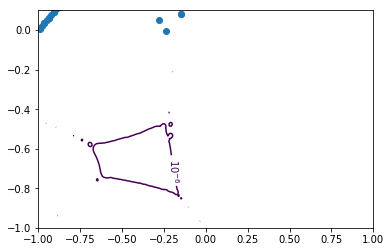

In [209]:
# compute pseudospectrum for the levels of interest between [1e-5, 1]
pseudoInst = NonnormalAuto(A, 1e-6, 1e-5)

# plot
pseudoInst.plot([10**k for k in range(-6, -5)], spectrum=-1.j*np.linalg.eigvals(A))
#plt.show()
plt.xlim([-1.,1.])
plt.ylim([-1.,0.1])

### Pseudospectrum using resolvent norm

$z$ is said to be an $\epsilon$-eigenvalue if it satisfies 
$$|| (zI-A)^{-1}|| \geq \epsilon^{-1} $$
I can discretize the region of complex plane of interest and compute the norm of the resolvent at each point, and then plot contours. This is what pseudopy does as well. I'll have a lot more control if I do it myself though.

In [226]:
# First, the laminar case. 
Re = 10000.  
N  = 201

a = 1.; b= 0.
speedArr = np.linspace(0., 1., 40)    # Phase speed
growthArr = np.linspace(-1., 0., 40)   # Growth rate
HinfNormArr = np.zeros((growthArr.size, speedArr.size))
#aArr = 2.*np.pi/( (10.** np.linspace(1., 5., 17))/Re )
#bArr = 2.*np.pi/( (10.** np.linspace(1., 4., 13))/Re )
#cArr = np.linspace(12., 22., 21)
#turbDict = ops.turbMeanChannel(N=N,Re=Re)
#U = turbDict['U']; dU = turbDict['dU']; d2U = turbDict['d2U']
y, DM = pseudo.chebdif(N,2)
D4 = pseudo.cheb4c(N)
D1 = DM[:,:,0]; D2 = DM[:,:,1]
U = 1. - y**2; dU = -2.*y; d2U = -2.*np.ones(N)
Umat   = np.diag(U)
dUmat  = np.diag(dU)
d2Umat  = np.diag(d2U)
I1 = np.identity(N); I2 = np.identity(2*N)
ZZ = np.zeros((N,N))
weightDict = pseudo.weightMats(N)
W3s = weightDict['W3Sqrt']
W3si= weightDict['W3SqrtInv']
W2s = weightDict['W2Sqrt']
W2si= weightDict['W2SqrtInv']
W2  = weightDict['W2']


def makeSystemTemp(a,b):
    # This time, we don't need the resolvent, but just the system matrices and their adjoints.
    Delta = D2 - (a**2 + b**2) * I1
    DeltaSq = D4 + ((a**2 + b**2)**2) * I1 - 2.*(a**2+b**2)*D2
    DeltaInv = np.linalg.solve(Delta, I1)

    LOS = -1.j*a* Umat @ Delta + 1.j*a* d2Umat + DeltaSq/Re
    LSQ = -1.j*a*Umat + Delta/Re
    Lco = -1.j*b*dUmat
    k2 = a**2 + b**2
    A = np.vstack(( 
            np.hstack(( DeltaInv @ LOS, ZZ )),
            np.hstack(( Lco           , LSQ)) ))
    LOSadj = 1.j*a*Umat - 1.j*a*DeltaInv @ d2Umat + (DeltaInv @ DeltaSq)/Re
    Lcoadj = -1.j*b*DeltaInv @ dUmat
    LSQadj = 1.j*a*Umat + Delta/Re
    Aadj = np.vstack((
            np.hstack(( LOSadj, Lcoadj)),
            np.hstack(( ZZ    , LSQadj))  ))
    B = np.vstack((
            DeltaInv@ np.hstack(( -1.j*a*D1, -k2*I1, -1.j*b*D1 )),
            np.hstack((1.j*b*I1, ZZ, -1.j*a*I1))  ))
    C = (1./k2) * np.vstack((
            np.hstack((1.j*a*D1, -1.j*b*I1)),
            np.hstack((k2 * I1 , ZZ       )),
            np.hstack((1.j*b*D1,  1.j*a*I1)) ))
    Badj = C; Cadj = B
    return A, B, C
# e^{ia(x-ct)}e^{growthRate*t} = e^{iax - iwt}
# So, -i*w = -i*w_r + w_i = gRate - i a c  => w_r = a*c, w_i =gRate
A,B,C = makeSystemTemp(a,b)
evals = np.linalg.eigvals(A)
for i0 in range(growthArr.size):
    omegaImag = growthArr[i0]
    print("growthRate=",growthArr[i0])
    for i1 in range(speedArr.size):
        omegaReal = a * speedArr[i1]
        omega = omegaReal + 1.j*omegaImag
        resolvent = -C @ np.linalg.solve(1.j*omega*I2 + A, I2) @ B
        weightedRes = W3s @ resolvent @ W3si
        HinfNormArr[i0,i1] = svds(weightedRes,k=2)[1][0]


growthRate= -1.0
growthRate= -0.974358974359
growthRate= -0.948717948718
growthRate= -0.923076923077
growthRate= -0.897435897436
growthRate= -0.871794871795
growthRate= -0.846153846154
growthRate= -0.820512820513
growthRate= -0.794871794872
growthRate= -0.769230769231
growthRate= -0.74358974359
growthRate= -0.717948717949
growthRate= -0.692307692308
growthRate= -0.666666666667
growthRate= -0.641025641026
growthRate= -0.615384615385
growthRate= -0.589743589744
growthRate= -0.564102564103
growthRate= -0.538461538462
growthRate= -0.512820512821
growthRate= -0.487179487179
growthRate= -0.461538461538
growthRate= -0.435897435897
growthRate= -0.410256410256
growthRate= -0.384615384615
growthRate= -0.358974358974
growthRate= -0.333333333333
growthRate= -0.307692307692
growthRate= -0.282051282051
growthRate= -0.25641025641
growthRate= -0.230769230769
growthRate= -0.205128205128
growthRate= -0.179487179487
growthRate= -0.153846153846
growthRate= -0.128205128205
growthRate= -0.102564102564
growt

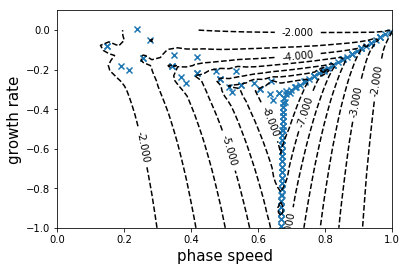

In [231]:
phaseSpeed = -evals.imag.copy()/a
growthRate = evals.real.copy()

CS = plt.contour(speedArr, growthArr, np.log10(1./HinfNormArr), 
                levels = np.arange(-8., -1.1),colors='k')
plt.xlabel("phase speed", fontsize=15)
plt.ylabel("growth rate", fontsize=15)
plt.clabel(CS)
sortInd = np.argsort(growthRate)
growthRate = growthRate[sortInd]
phaseSpeed = phaseSpeed[sortInd]
plt.scatter(phaseSpeed,growthRate,marker='x')
plt.xlim([0.,1.])
plt.ylim([-1.,0.1])
plt.show()

## Turbulent case, $Re_\tau = 186$ (Zare's matrices)

In [244]:
# First, the laminar case. 
Re = 186.  
N  = 151

a = 2.5; b= 7.
speedArr = np.linspace(10., 19., 46)    # Phase speed
growthArr = np.linspace(-10., 0., 101)   # Growth rate
HinfNormArr = np.zeros((growthArr.size, speedArr.size))
#aArr = 2.*np.pi/( (10.** np.linspace(1., 5., 17))/Re )
#bArr = 2.*np.pi/( (10.** np.linspace(1., 4., 13))/Re )
#cArr = np.linspace(12., 22., 21)
matDict = loadmat('data_figure9_jfm17.mat') # Data set from Zare
Am = matDict['A']; Cm = matDict['L']; Bm = Cm.conj().T
evals = np.linalg.eigvals(Am)
Im = np.identity(Am.shape[0], dtype=np.complex)
for i0 in range(growthArr.size):
    omegaImag = growthArr[i0]
    print("growthRate=",growthArr[i0])
    for i1 in range(speedArr.size):
        omegaReal = a * speedArr[i1]
        omega = omegaReal + 1.j*omegaImag
        resolvent = -Cm @ np.linalg.solve(1.j*omega*Im + Am, Im) @ Bm
        HinfNormArr[i0,i1] = svds(resolvent,k=2)[1][0]


growthRate= -10.0
growthRate= -9.9
growthRate= -9.8
growthRate= -9.7
growthRate= -9.6
growthRate= -9.5
growthRate= -9.4
growthRate= -9.3
growthRate= -9.2
growthRate= -9.1
growthRate= -9.0
growthRate= -8.9
growthRate= -8.8
growthRate= -8.7
growthRate= -8.6
growthRate= -8.5
growthRate= -8.4
growthRate= -8.3
growthRate= -8.2
growthRate= -8.1
growthRate= -8.0
growthRate= -7.9
growthRate= -7.8
growthRate= -7.7
growthRate= -7.6
growthRate= -7.5
growthRate= -7.4
growthRate= -7.3
growthRate= -7.2
growthRate= -7.1
growthRate= -7.0
growthRate= -6.9
growthRate= -6.8
growthRate= -6.7
growthRate= -6.6
growthRate= -6.5
growthRate= -6.4
growthRate= -6.3
growthRate= -6.2
growthRate= -6.1
growthRate= -6.0
growthRate= -5.9
growthRate= -5.8
growthRate= -5.7
growthRate= -5.6
growthRate= -5.5
growthRate= -5.4
growthRate= -5.3
growthRate= -5.2
growthRate= -5.1
growthRate= -5.0
growthRate= -4.9
growthRate= -4.8
growthRate= -4.7
growthRate= -4.6
growthRate= -4.5
growthRate= -4.4
growthRate= -4.3
growthRate= -

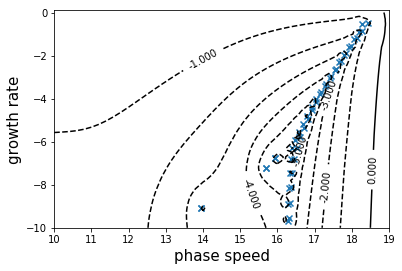

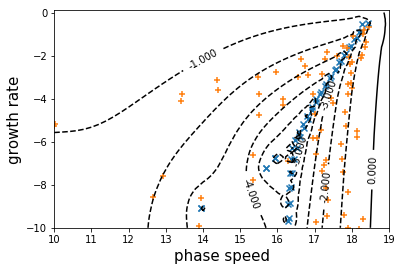

Size of the low rank modification is 197238.884068


In [247]:
phaseSpeed = -evals.imag.copy()/a
growthRate = evals.real.copy()

CS = plt.contour(speedArr, growthArr, np.log10(1./HinfNormArr), 
                levels = np.arange(-8., 0.1),colors='k')
plt.xlabel("phase speed", fontsize=15)
plt.ylabel("growth rate", fontsize=15)
plt.clabel(CS)

sortInd = np.argsort(growthRate)
growthRate = growthRate[sortInd]
phaseSpeed = phaseSpeed[sortInd]
plt.scatter(phaseSpeed,growthRate,marker='x')
plt.xlim([10.,19.])
plt.ylim([-10.,0.1])
plt.show()




CS = plt.contour(speedArr, growthArr, np.log10(1./HinfNormArr), 
                levels = np.arange(-8., 0.1),colors='k')
plt.xlabel("phase speed", fontsize=15)
plt.ylabel("growth rate", fontsize=15)
plt.clabel(CS)

plt.scatter(phaseSpeed,growthRate,marker='x')
plt.xlim([10.,19.])
plt.ylim([-10.,0.1])



matDict = loadmat('data_figure9_jfm17.mat') # Data set from Zare
Am = matDict['A']; Cm = matDict['L']; Bm = Cm.conj().T
Z = matDict['Z']; X = matDict['X']
Z = 0.5*(Z + Z.conj().T)
X = 0.5*(X + X.conj().T)    # Ensure X and Z are Hermitian
If = np.identity(Am.shape[0], dtype=np.complex)
Bm,Hm,Sm = ops.decomposeZ(Z)
HmAdj = Hm.conj().T
BmAdj = Bm.conj().T
CmAdj = Cm.conj().T
Xinv  = np.linalg.solve(X, If)
Cf = (HmAdj - 0.5*BmAdj)@ Xinv     # Eq. 3.6b 
Af = Am + Bm @ Cf                  # Eq. 3.6a

evalsCC = np.linalg.eigvals(Af)
phaseSpeed = -evalsCC.imag.copy()/a
growthRate = evalsCC.real.copy()
sortInd = np.argsort(growthRate)
growthRate = growthRate[sortInd]
phaseSpeed = phaseSpeed[sortInd]
plt.scatter(phaseSpeed,growthRate,marker='+')


plt.show()

svalMod = svds(Bm@Cf, k=2)[1][0]
print("Size of the low rank modification is", svalMod)

## Turbulent pseudospectra, $Re_\tau=5000$

In [249]:
Re = 5000.; N = 301
bArr = np.array([0.2, 2.0, 10.0])
aArr = np.array([0.05,  0.1, 1.0, 5.0, 20.])

speedArr = np.linspace(15., 27., 75)    # Phase speed
growthArr = np.linspace(-10., 0., 101)   # Growth rate

HinfNormArr = np.zeros((aArr.size, bArr.size, growthArr.size, speedArr.size))

turbDict = ops.turbMeanChannel(N=N,Re=Re)
U = turbDict['U']; dU = turbDict['dU']; d2U = turbDict['d2U']
y, DM = pseudo.chebdif(N,2)
D4 = pseudo.cheb4c(N)
D1 = DM[:,:,0]; D2 = DM[:,:,1]
Umat   = np.diag(U)
dUmat  = np.diag(dU)
d2Umat  = np.diag(d2U)
I1 = np.identity(N); I2 = np.identity(2*N)
ZZ = np.zeros((N,N))
weightDict = pseudo.weightMats(N)
W3s = weightDict['W3Sqrt']
W3si= weightDict['W3SqrtInv']
W2s = weightDict['W2Sqrt']
W2si= weightDict['W2SqrtInv']
W2  = weightDict['W2']


def makeSystemTemp(a,b):
    # This time, we don't need the resolvent, but just the system matrices and their adjoints.
    Delta = D2 - (a**2 + b**2) * I1
    DeltaSq = D4 + ((a**2 + b**2)**2) * I1 - 2.*(a**2+b**2)*D2
    DeltaInv = np.linalg.solve(Delta, I1)

    LOS = -1.j*a* Umat @ Delta + 1.j*a* d2Umat + DeltaSq/Re
    LSQ = -1.j*a*Umat + Delta/Re
    Lco = -1.j*b*dUmat
    k2 = a**2 + b**2
    A = np.vstack(( 
            np.hstack(( DeltaInv @ LOS, ZZ )),
            np.hstack(( Lco           , LSQ)) ))
    LOSadj = 1.j*a*Umat - 1.j*a*DeltaInv @ d2Umat + (DeltaInv @ DeltaSq)/Re
    Lcoadj = -1.j*b*DeltaInv @ dUmat
    LSQadj = 1.j*a*Umat + Delta/Re
    Aadj = np.vstack((
            np.hstack(( LOSadj, Lcoadj)),
            np.hstack(( ZZ    , LSQadj))  ))
    B = np.vstack((
            DeltaInv@ np.hstack(( -1.j*a*D1, -k2*I1, -1.j*b*D1 )),
            np.hstack((1.j*b*I1, ZZ, -1.j*a*I1))  ))
    C = (1./k2) * np.vstack((
            np.hstack((1.j*a*D1, -1.j*b*I1)),
            np.hstack((k2 * I1 , ZZ       )),
            np.hstack((1.j*b*D1,  1.j*a*I1)) ))
    Badj = C; Cadj = B
    return A, B, C
# e^{ia(x-ct)}e^{growthRate*t} = e^{iax - iwt}
# So, -i*w = -i*w_r + w_i = gRate - i a c  => w_r = a*c, w_i =gRate
startTime = time.time()
for i0 in range(aArr.size):
    a = aArr[i0]
    print("a=",a)
    for i1 in range(bArr.size):
        b = bArr[i1]
        print("b=",b)
        A,B,C = makeSystemTemp(a,b)
        for i2 in range(growthArr.size):
            omegaImag = growthArr[i2]
            for i3 in range(speedArr.size):
                omegaReal = a * speedArr[i3]
                omega = omegaReal + 1.j*omegaImag
                resolvent = -C @ np.linalg.solve(1.j*omega*I2 + A, I2) @ B
                weightedRes = W3s @ resolvent @ W3si
                HinfNormArr[i0,i1,i2,i3] = svds(weightedRes,k=2)[1][0]
        print("time elapsed:%d min"%((time.time()-startTime)/60.))
HinfNormArrReTau5000 = HinfNormArr.copy()

Using parameters Re=5000, alfa=25.4, kapa=0.426, N=301
a= 0.05
b= 0.2
time elapsed:13 min
b= 2.0
time elapsed:26 min
b= 10.0
time elapsed:38 min
a= 0.1
b= 0.2
time elapsed:50 min
b= 2.0
time elapsed:62 min
b= 10.0
time elapsed:76 min
a= 1.0
b= 0.2
time elapsed:89 min
b= 2.0
time elapsed:104 min
b= 10.0
time elapsed:119 min
a= 5.0
b= 0.2
time elapsed:133 min
b= 2.0
time elapsed:146 min
b= 10.0
time elapsed:159 min
a= 20.0
b= 0.2
time elapsed:172 min
b= 2.0
time elapsed:186 min
b= 10.0
time elapsed:200 min


UCL, Ubulk: 26.1787044308 23.6741493894



/home/svadarevu/linenv/lib/python3.5/site-packages/matplotlib/contour.py:370: RuntimeWarning: invalid value encountered in true_divide
  dist = np.add.reduce(([(abs(s)[i] / L[i]) for i in range(xsize)]), -1)


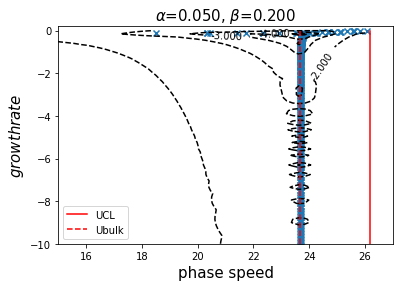

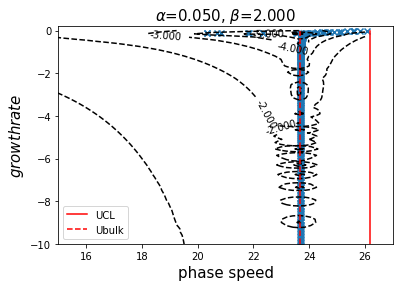

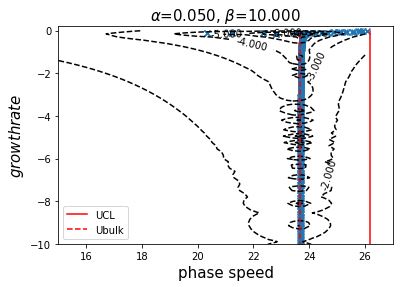

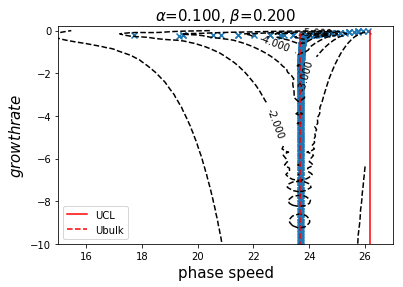

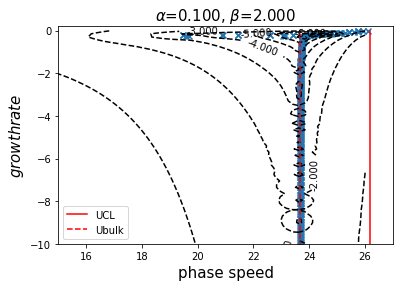

...

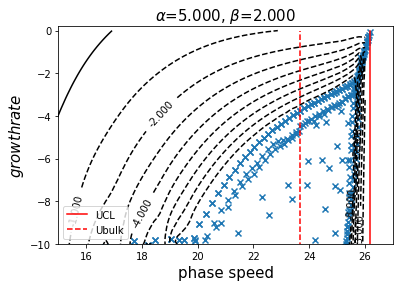

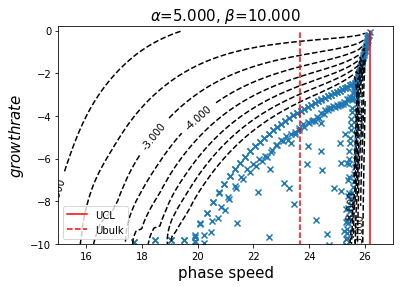

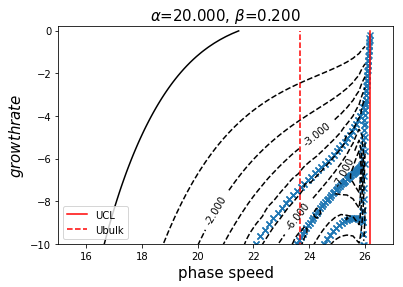

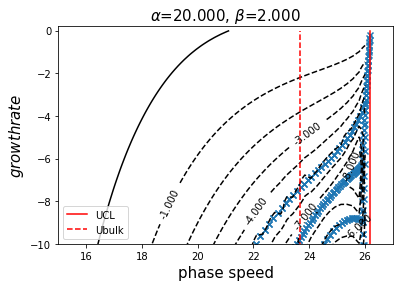

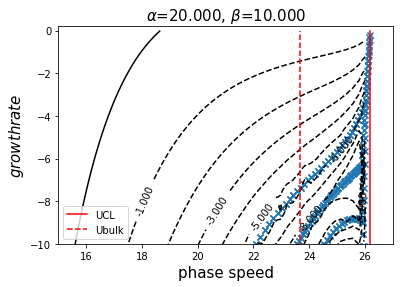

In [255]:
phaseSpeed = -evalsArrReTau5000.imag.copy()/aArr.reshape((aArr.size,1,1))
growthRate =  evalsArrReTau5000.real.copy()
HinfNormArr = HinfNormArrReTau5000.copy()
U = turbDict5000['U']
UCL = np.max(U)
w = pseudo.clencurt(U.size); Ubulk = w @ U
print("UCL, Ubulk:",UCL, Ubulk)


#nEvalsArr = np.array([40,60,85,100,150])
nEvalsArr = N*np.ones(10,dtype=np.int)
symArr = ['x','+','d','v','^','s']
print("")
for i0 in range(aArr.size):
    for i1 in range(bArr.size):
        plt.figure()
        plt.xlabel("phase speed",fontsize=15)
        plt.ylabel("$growth rate$",fontsize=15)
        plt.title('$\\alpha$=%.3f, $\\beta$=%.3f'%(aArr[i0],bArr[i1]),fontsize=15)
        sortInd = np.argsort(growthRate[i0,i1])
        growthRate[i0,i1] = growthRate[i0,i1,sortInd]
        phaseSpeed[i0,i1] = phaseSpeed[i0,i1,sortInd]
        plt.scatter(phaseSpeed[i0,i1,-nEvalsArr[i0]:],growthRate[i0,i1,-nEvalsArr[i0]:],
                    marker='x')
    
        plt.plot(UCL*np.ones(20), np.linspace(np.amin(growthRate[i0,:,-nEvalsArr[i0]:]), 0., 20), 'r-',label="UCL" )
        plt.plot(Ubulk*np.ones(20), np.linspace(np.amin(growthRate[i0,:,-nEvalsArr[i0]:]), 0., 20), 'r--', label="Ubulk" )
        plt.legend(loc=3)
        plt.xlim([15.,27.])
        plt.ylim([-10.,0.2])
        
        CS = plt.contour(speedArr, growthArr, np.log10(1./HinfNormArr[i0,i1]), 
                levels = np.arange(-8., 1.1),colors='k')
        #plt.xlabel("phase speed", fontsize=15)
        #plt.ylabel("growth rate", fontsize=15)
        plt.clabel(CS)

        
        plt.show()


# Interactions between first resolvent modes for different TWs. 

Look at Fig. 16 of CoT. One thing to note is that the sharp peak of the LNSE is flattened out by the low rank mod. The other thing is the reduced amplification. I'm not sure of the amplification bit yet, except maybe that we want the structures to stabilize (i.e., energy extracted from the forcing is lost to diffusion). The interesting bit is the flattening out of the peak. 

My pet hypothesis is that these plateaus represent interactions between different modes - in this case, between different TWS that have their basis close to each other (in terms of wall-normal location), and this interaction produces extended structures instead of the localized structures seen from LNSE. 



# Optimal growth of reconstructed OSS operator with homogenized eigenvalues 
The plan is this:

Take the OSS from LNSE, do an eigenvalue (right) decomposition. Modify the diagonal entries of the eigenvalue matrix so that several phase speeds have the same growth rate, without changing the eigenvectors. My conjecture is that the optimal growth sees a significant increase with the modification. Not just that, the covariance matrix from stochastic forcing should also show a peak near these clustured $c$ values. 

# $H_\infty(H)$ dependence on covariance of white noise in CC
# $ \mathbf{u} = H \mathbf{d}$

In [140]:
from scipy.io import loadmat
omegaArr = np.linspace(-25., 75., 100)
facArr   = np.array([0.01, 1., 100.])
ampArrCC = np.zeros((facArr.size, omegaArr.size))
psdArrCC = np.zeros((facArr.size, omegaArr.size))
#==============================
# The modified dynamics system from covariance completion
matDict = loadmat('data_figure9_jfm17.mat') # Data set from Zare
Am = matDict['A']; Cm = matDict['L']; Bm = Cm.conj().T
Z = matDict['Z']; X = matDict['X']
Z = 0.5*(Z + Z.conj().T)
X = 0.5*(X + X.conj().T)    # Ensure X and Z are Hermitian
If = np.identity(Am.shape[0], dtype=np.complex)
evalsArrCC = np.zeros((facArr.size, Am.shape[0]),dtype=np.complex)

Bm,Hm,Sm = ops.decomposeZ(Z)
HmAdj = Hm.conj().T
BmAdj = Bm.conj().T
CmAdj = Cm.conj().T
Xinv  = np.linalg.solve(X, If)


for i0 in range(facArr.size):
    # Form modified dynamics system from covariance completed data
    Cf = (HmAdj - 0.5*facArr[i0]*BmAdj)@ Xinv     # Eq. 3.6b 
    Af = Am + Bm @ Cf                  # Eq. 3.6a
    Bf = Bm
    #==============================
    
    evalsArrCC[i0] = np.linalg.eigvals(Af)

    for ind in range(omegaArr.size):
        omega = omegaArr[ind]
        # Modified LNSE from CC
        RM = (1.j*omega*If + Af )
        RM = np.linalg.solve(RM, If)
        Tvw = -Cm @ RM @ Bm
        U,Sf,V = np.linalg.svd(Tvw)

        ampArrCC[i0,ind]    = np.real(Sf[0])**2

        psdArrCC[i0,ind]   = np.sum( np.real(Sf)**2 )



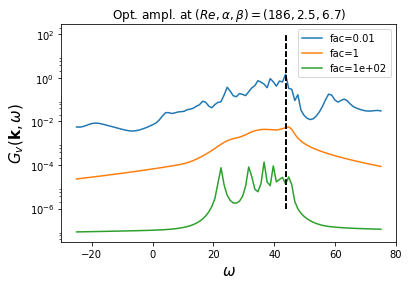

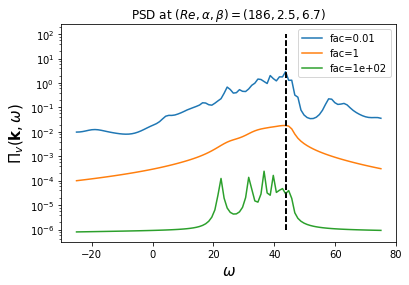

/home/svadarevu/linenv/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


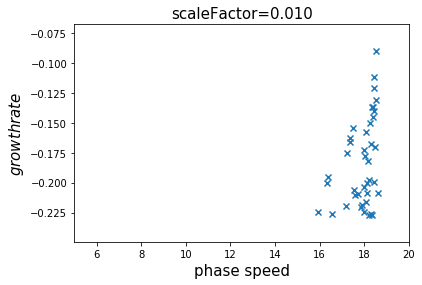

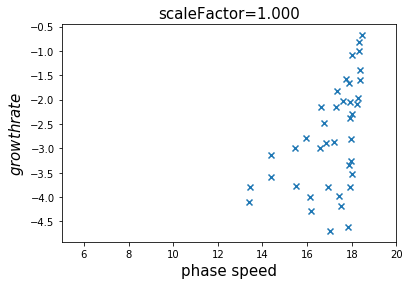

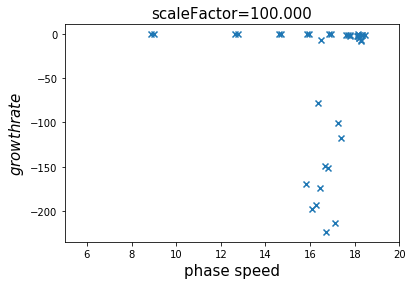

In [145]:
for i0 in range(facArr.size):
    plt.plot(omegaArr, ampArrCC[i0], label='fac=%.2g'%facArr[i0])
    omegaInd = np.argmax(ampArrCC); omegaMax = omegaArr[omegaInd]
    plt.plot(omegaMax*np.ones(15), 10**np.linspace(-6,2,15), 'k--')
    #plt.ylim([1.0e-06, 100.])
    #plt.yticks(10**np.array([-6.,-4.,-2.,0,2]))
    plt.yscale("log")
    plt.xlabel("$\\omega$", fontsize=15); plt.ylabel("$G_v(\mathbf{k},\\omega)$",fontsize=15)
    plt.legend()
    plt.title("Opt. ampl. at $(Re,\\alpha,\\beta) =(186,2.5,6.7)$")
    #plt.savefig(figureFolder+"optAmpLNSE.pdf",format="pdf")
plt.show()

for i0 in range(facArr.size):
    plt.plot(omegaArr, psdArrCC[i0], label='fac=%.2g'%facArr[i0])
    omegaInd = np.argmax(psdArrCC); omegaMax = omegaArr[omegaInd]
    plt.plot(omegaMax*np.ones(15), 10**np.linspace(-6,2,15), 'k--')
    plt.yscale("log")
    plt.xlabel("$\\omega$", fontsize=15); plt.ylabel("$\Pi_v(\mathbf{k},\\omega)$",fontsize=15)
    plt.legend()
    plt.title("PSD at $(Re,\\alpha,\\beta) =(186,2.5,6.7)$")
    #plt.savefig(figureFolder+"optAmpLNSE.pdf",format="pdf")
plt.show()

nEvals = 40
growthRate = evalsArrCC.real.copy()
phaseSpeed = -evalsArrCC.imag.copy()/2.5
for i0 in range(facArr.size):
    plt.figure()
    plt.xlabel("phase speed",fontsize=15)
    plt.ylabel("$growth rate$",fontsize=15)
    plt.title('scaleFactor=%.3f'%facArr[i0],fontsize=15)
    plt.xlim([5., 20.])
    sortInd = np.argsort(growthRate[i0])
    growthRate[i0] = growthRate[i0,sortInd]
    phaseSpeed[i0] = phaseSpeed[i0,sortInd]
    plt.scatter(phaseSpeed[i0,-nEvals:],growthRate[i0,-nEvals:],marker='x')
    plt.legend(loc=3)
    plt.show()

